In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd

# Dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Main Work/Bangla Language/Final Bangla Dataset.xlsx - Sheet1.csv')

In [ ]:
df.isnull().sum()

,0
sentence,4
label,4


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
import re
import time
import numpy as np # Importing the NumPy library
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import roc_auc_score, balanced_accuracy_score
from imblearn.metrics import geometric_mean_score
from sklearn.metrics import precision_score
import re
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt


In [ ]:
from sklearn.preprocessing import LabelEncoder
le_x= LabelEncoder()

In [ ]:
df.isnull().sum()

,0
sentence,4
label,4


In [ ]:
df.dropna(inplace=True)

In [ ]:
df['label'].value_counts()

,count
label,
Sylhet,3922
Chittagong,3480
Mymensingh,2500
Barishal,980
Standard_Bangla,980


In [ ]:
df.shape

(11862, 2)

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(11523, 2)

In [ ]:
df['label'].value_counts()

,count
label,
Sylhet,3798
Chittagong,3402
Mymensingh,2500
Standard_Bangla,918
Barishal,905


In [ ]:
print(df['label'].unique())
print(df['label'].value_counts())

['Sylhet' 'Mymensingh' 'Chittagong' 'Barishal' 'Standard_Bangla']
label
Sylhet             3798
Chittagong         3402
Mymensingh         2500
Standard_Bangla     918
Barishal            905
Name: count, dtype: int64


In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df['label'].value_counts()

,count
label,
Sylhet,3798
Chittagong,3402
Mymensingh,2500
Standard_Bangla,918
Barishal,905


In [ ]:
df.shape

(11523, 2)

In [ ]:
df.isnull().sum()

,0
sentence,0
label,0


In [ ]:
df['label'] = le_x.fit_transform(df.label)

In [ ]:
label_mapping = dict(zip(le_x.classes_, le_x.transform(le_x.classes_)))
print(label_mapping)

{'Barishal': 0, 'Chittagong': 1, 'Mymensingh': 2, 'Standard_Bangla': 3, 'Sylhet': 4}


In [ ]:
df.head(20)

,sentence,label
0,আমি ওবায় যাইতাম না,4
1,আমি ওবায় যাইমু,4
2,একটা কবিতা কও,4
3,মোর কবিতা পছন্দ,4
4,আমার কপাল ভাল,4
5,হে কিলাখান ঝিমার দেখ,4
6,কিতা পাইছো,4
7,আমি তোমারে দেখিয়া নিমু,4
8,ভুলিয়া গেছো,4
9,কিতা তরকারি?,4


In [ ]:
level_0_sentences = df.loc[df['label'] == 2, 'sentence']


In [ ]:
level_0_sentences

,sentence
3923,কেমত আছো?
3924,আইজ আমার মন ভালা নাই
3925,তুমি কিতা করো?
3926,এই গরমডাত আমার কিছু ভালা লাগে না
3927,ছেড়াটা সাদা রংগের একটা শার্ট পইড়া আইছিল
...,...
6418,তুমি কিতা আমারে এক গ্লাস পানি আইন্না দিতে পারবা ?
6419,আমি ফারতাম না পানি দিতে
6420,তোমার ভাই পড়ালেহাতে অনেক মেধাবি
6421,আচ্ছা কও দেহি বাংলাদেশে কয়ডা জেলা?


# Data Preprocessing

In [ ]:
punctuation_chars = "?,।!;:"

def remove_punctuation(text):
    if isinstance(text, str):
        return ''.join(char for char in text if char not in punctuation_chars)
    elif isinstance(text, float):
        return ''.join(char for char in str(text) if char not in punctuation_chars)
    else:
        return text

df['sentence'] = df['sentence'].apply(remove_punctuation)


In [ ]:
import re
df['sentence'] = df['sentence'].apply(lambda x: re.sub(r"[^\w\s]", "", x))

In [ ]:
df['sentence'] = df['sentence'].apply(lambda x: " ".join(x.split()))


In [ ]:
labels = list(label_mapping.keys())

In [ ]:
labels

['Barishal', 'Chittagong', 'Mymensingh', 'Standard_Bangla', 'Sylhet']

In [ ]:
vectorizer = TfidfVectorizer(max_features=5000)
X = vectorizer.fit_transform(df['sentence'])
y = df['label']


In [ ]:
label_mapping = dict(zip(le_x.classes_, le_x.transform(le_x.classes_)))

In [ ]:
label_mapping

{'Barishal': 0,
 'Chittagong': 1,
 'Mymensingh': 2,
 'Standard_Bangla': 3,
 'Sylhet': 4}

# **Plot**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-112-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-112-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


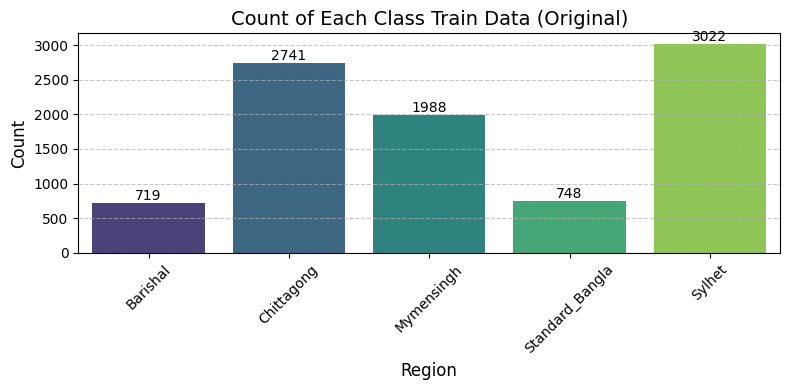

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data (Original)")

# ML Models

## Multinomial NB- 80.26%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8026030368763557
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.31      0.47       186
           1       0.92      0.92      0.92       661
           2       0.83      0.79      0.81       512
           3       0.91      0.30      0.45       170
           4       0.70      0.94      0.80       776

    accuracy                           0.80      2305
   macro avg       0.87      0.65      0.69      2305
weighted avg       0.83      0.80      0.78      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8026030368763557
Precision: 0.8314
Recall for : 0.8026
F1 Score:  0.7848
AUC Score: 0.9670
Balanced Accuracy: 0.6515
G-mean Score: 0.8551
pf Score: 0.0573
Bal Score :  0.8546662190067511


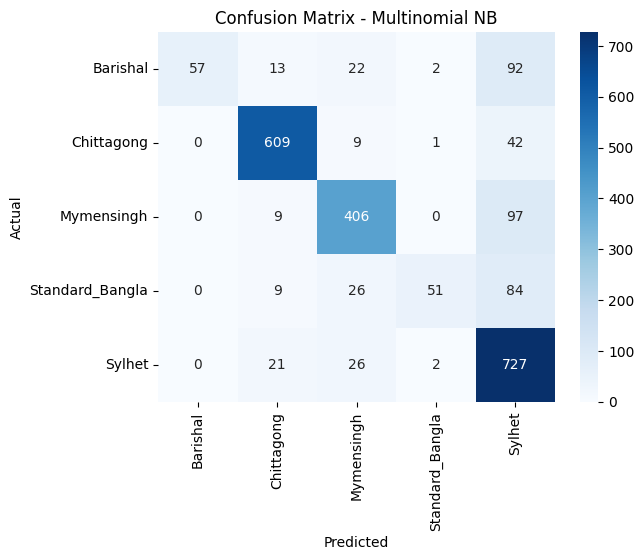

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -75.36%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=10, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7535791757049891
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.72      0.70       186
           1       0.85      0.87      0.86       661
           2       0.75      0.64      0.69       512
           3       0.65      0.61      0.63       170
           4       0.71      0.77      0.74       776

    accuracy                           0.75      2305
   macro avg       0.73      0.72      0.72      2305
weighted avg       0.75      0.75      0.75      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 2.18 seconds
Accuracy: 0.7535791757049891
Precision: 0.7536
Recall for : 0.7536
F1 Score:  0.7522
AUC Score: 0.9181
Balanced Accuracy: 0.7215
G-mean Score: 0.8288
pf Score: 0.0670
Bal Score :  0.8194318733469761


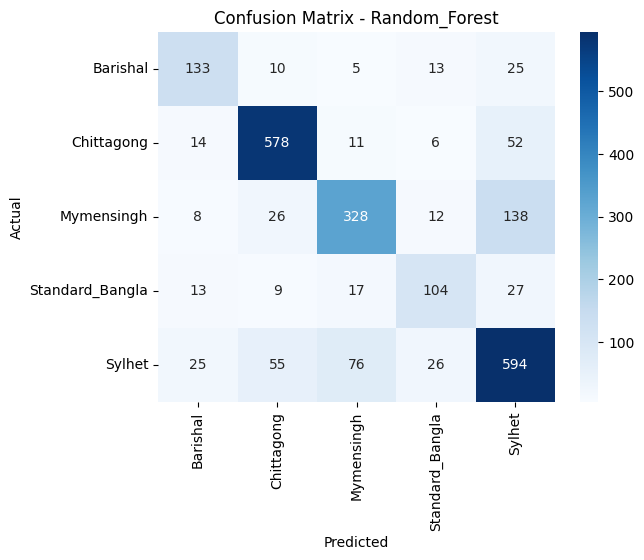

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 75.97%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7596529284164859
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.53      0.62       188
           1       0.76      0.93      0.84       667
           2       0.79      0.68      0.73       497
           3       0.71      0.51      0.59       193
           4       0.75      0.78      0.77       760

    accuracy                           0.76      2305
   macro avg       0.75      0.69      0.71      2305
weighted avg       0.76      0.76      0.75      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 43.77 seconds
Accuracy: 0.7596529284164859
Precision: 0.7592
Recall for : 0.7597
F1 Score:  0.7532
AUC Score: 0.9443
Balanced Accuracy: 0.6867
G-mean Score: 0.8316
pf Score: 0.0660
Bal Score :  0.8237575169393403


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

43.7715
0.7597
0.7592
0.7597
0.7532
0.9443
0.6867
0.8316
0.0660
0.8238


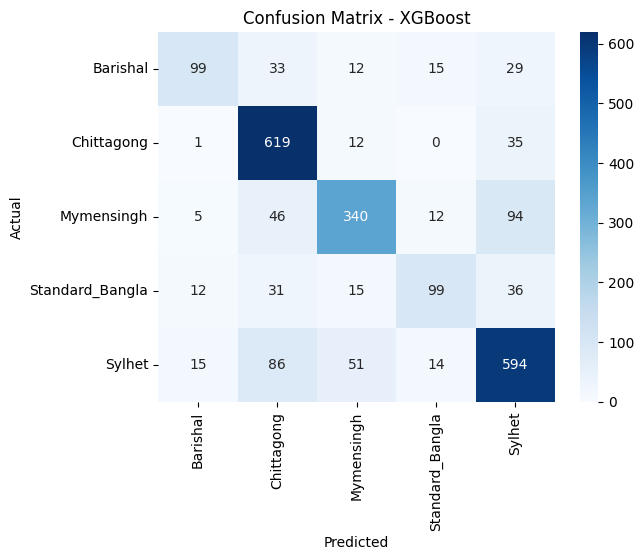

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 68.55%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6854663774403471
Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.55      0.55       188
           1       0.77      0.90      0.83       667
           2       0.62      0.60      0.61       497
           3       0.57      0.49      0.53       193
           4       0.70      0.64      0.67       760

    accuracy                           0.69      2305
   macro avg       0.64      0.63      0.64      2305
weighted avg       0.68      0.69      0.68      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.05 seconds
Accuracy: 0.6854663774403471
Precision: 0.6798
Recall for : 0.6855
F1 Score:  0.6806
AUC Score: 0.8054
Balanced Accuracy: 0.6349
G-mean Score: 0.7837
pf Score: 0.0837
Bal Score :  0.7698532632047606


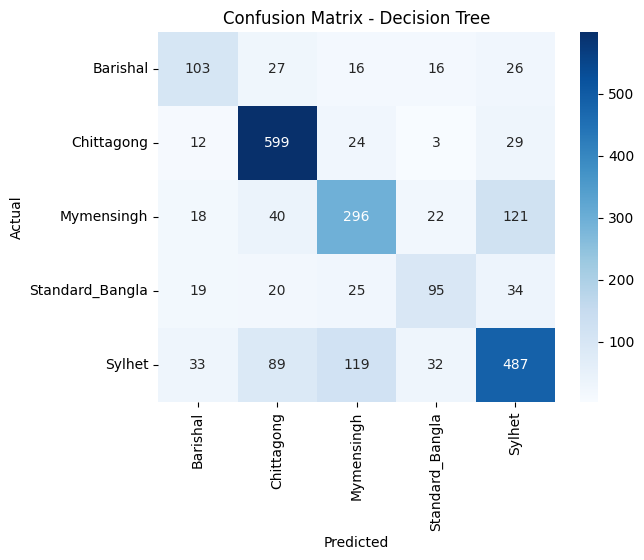

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 69.85%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6984815618221258
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.50      0.55       188
           1       0.68      0.94      0.79       667
           2       0.88      0.43      0.57       497
           3       0.52      0.50      0.51       193
           4       0.72      0.76      0.74       760

    accuracy                           0.70      2305
   macro avg       0.68      0.63      0.63      2305
weighted avg       0.72      0.70      0.68      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.6984815618221258
Precision: 0.7175
Recall for : 0.6985
F1 Score:  0.6845
AUC Score: 0.9222
Balanced Accuracy: 0.6258
G-mean Score: 0.7889
pf Score: 0.0821
Bal Score :  0.7790319290569065


## LightGBM Model -73.75%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10639
[LightGBM] [Info] Number of data points in the train set: 9218, number of used features: 431
[LightGBM] [Info] Start training from score -2.553838
[LightGBM] [Info] Start training from score -1.215027
[LightGBM] [Info] Start training from score -1.526512
[LightGBM] [Info] Start training from score -2.542742
[LightGBM] [Info] Start training from score -1.109959


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.737527114967462
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.41      0.49       188
           1       0.77      0.88      0.83       667
           2       0.75      0.71      0.73       497
           3       0.61      0.53      0.57       193
           4       0.74      0.76      0.75       760

    accuracy                           0.74      2305
   macro avg       0.70      0.66      0.67      2305
weighted avg       0.73      0.74      0.73      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 4.86 seconds
Accuracy: 0.737527114967462
Precision: 0.7314
Recall for : 0.7375
F1 Score:  0.7315
AUC Score: 0.9369
Balanced Accuracy: 0.6596
G-mean Score: 0.8184
pf Score: 0.0709
Bal Score :  0.8077607856364494


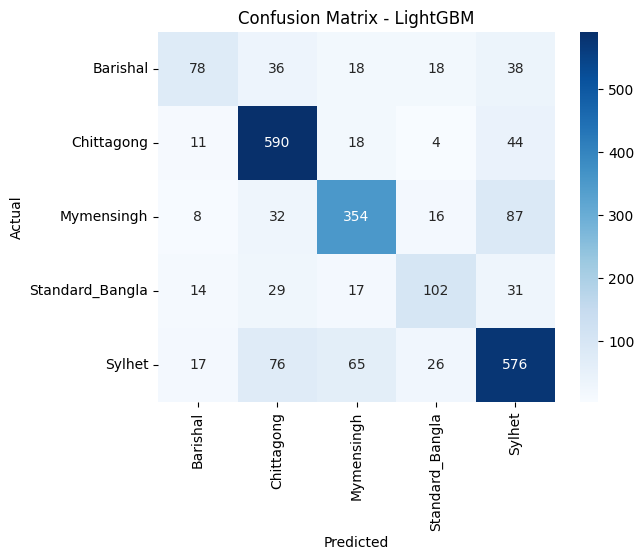

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 81.78%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8177874186550976
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.56      0.68       188
           1       0.86      0.94      0.90       667
           2       0.80      0.79      0.80       497
           3       0.79      0.50      0.61       193
           4       0.79      0.88      0.83       760

    accuracy                           0.82      2305
   macro avg       0.82      0.73      0.76      2305
weighted avg       0.82      0.82      0.81      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 4.89 seconds
Accuracy: 0.8177874186550976
Precision: 0.8183
Recall for : 0.8178
F1 Score:  0.8114
AUC Score: 0.9669
Balanced Accuracy: 0.7326
G-mean Score: 0.8724
pf Score: 0.0503
Bal Score :  0.8663315949838961


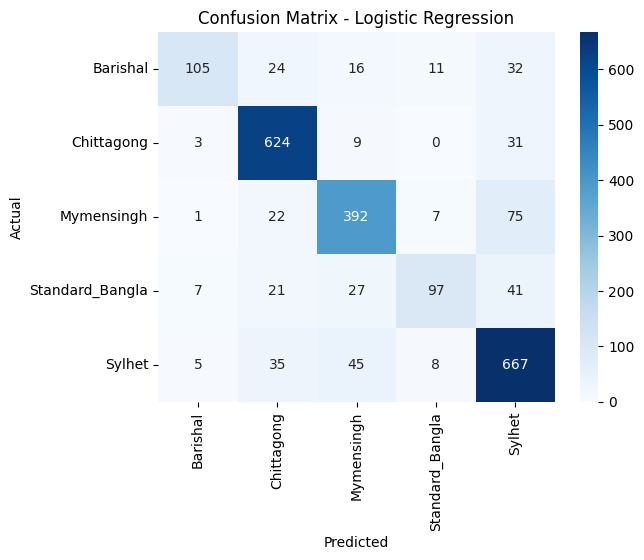

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 79.57%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7956616052060738
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.28      0.43       188
           1       0.88      0.95      0.91       667
           2       0.84      0.81      0.82       497
           3       0.87      0.24      0.38       193
           4       0.70      0.92      0.80       760

    accuracy                           0.80      2305
   macro avg       0.85      0.64      0.67      2305
weighted avg       0.82      0.80      0.77      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.7956616052060738
Precision: 0.8168
Recall for : 0.7957
F1 Score:  0.7713
AUC Score: 0.9643
Balanced Accuracy: 0.6398
G-mean Score: 0.8517
pf Score: 0.0585
Bal Score :  0.8497019891282107


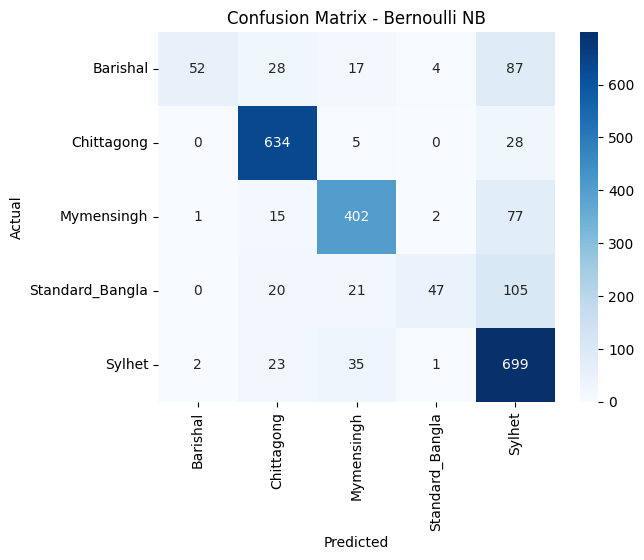

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

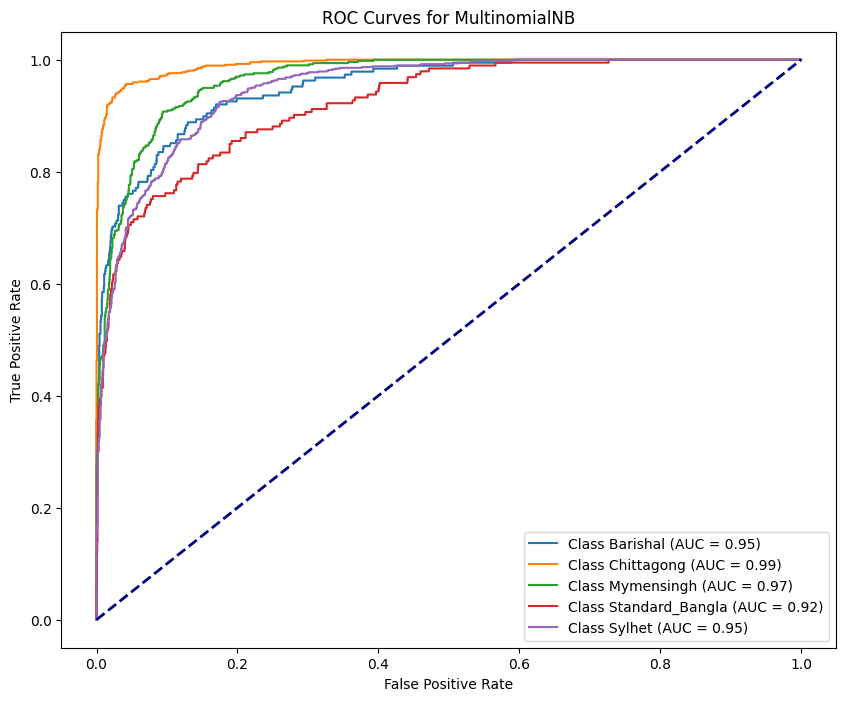

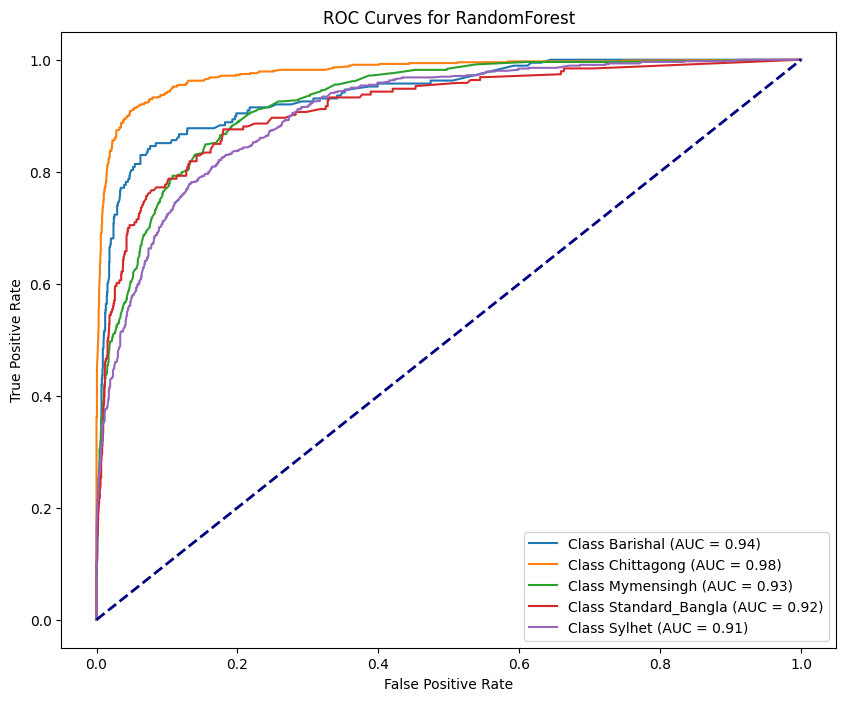

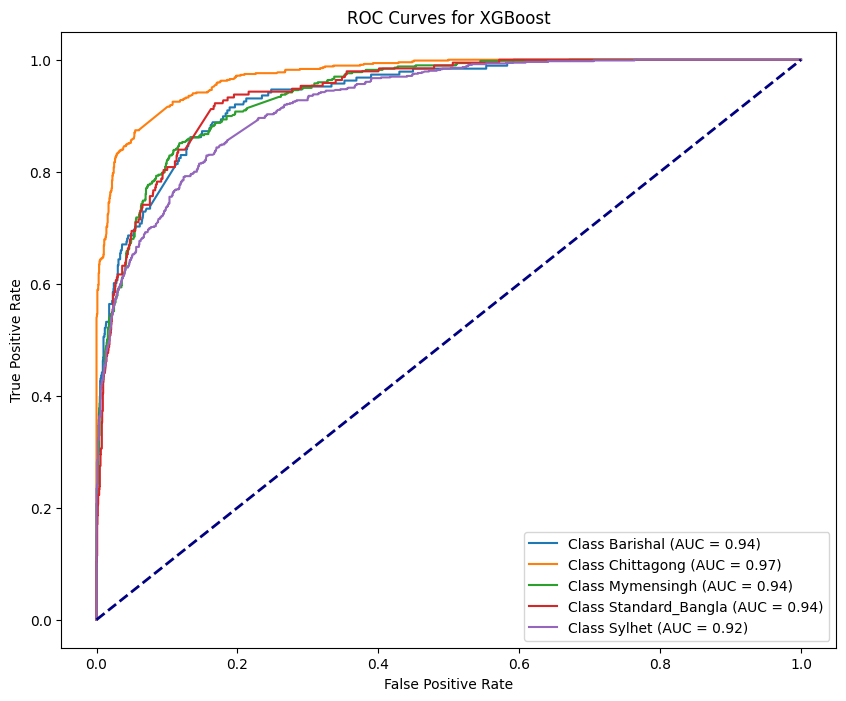

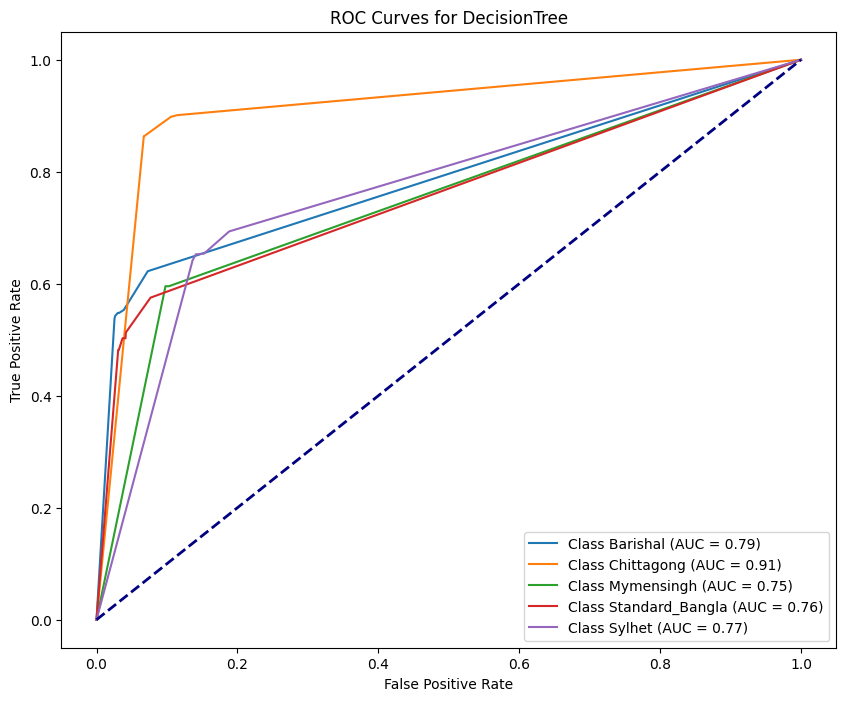

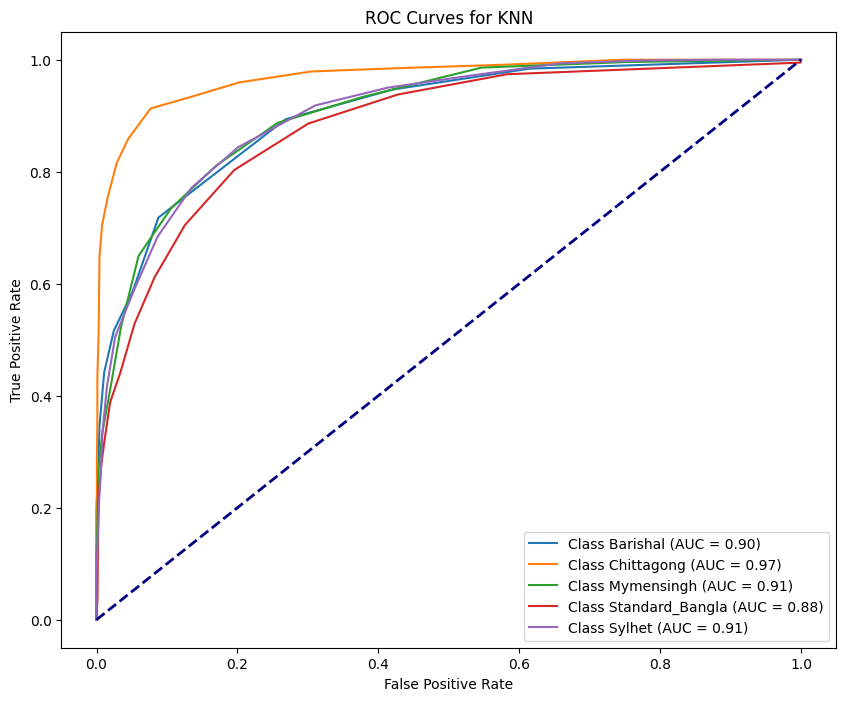

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


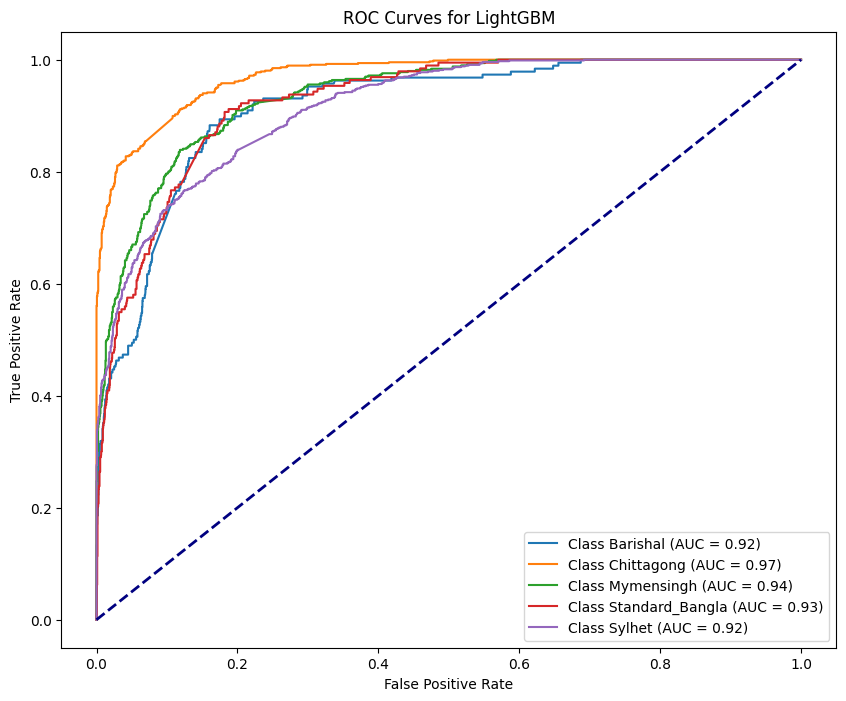

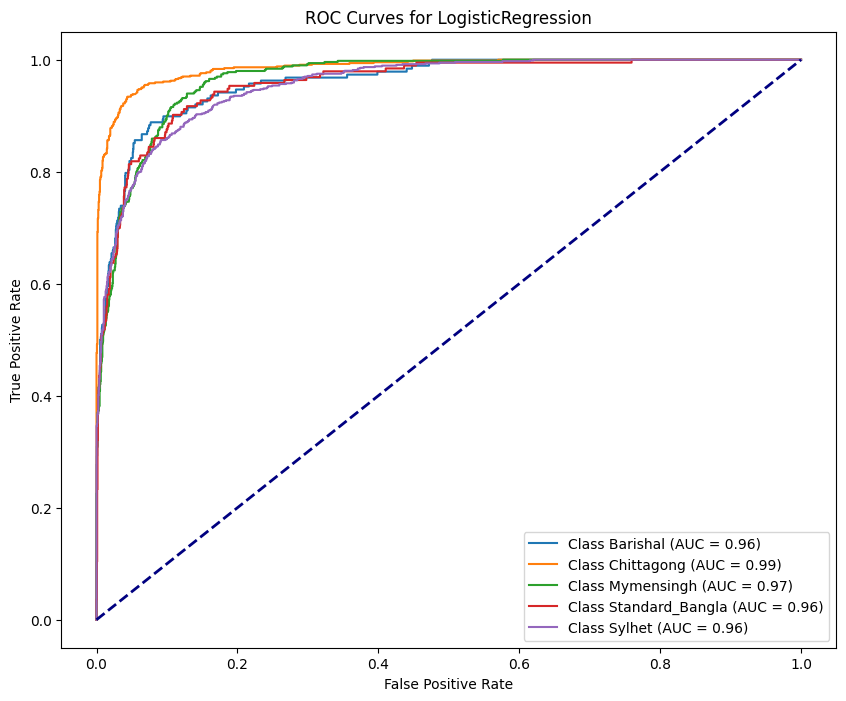

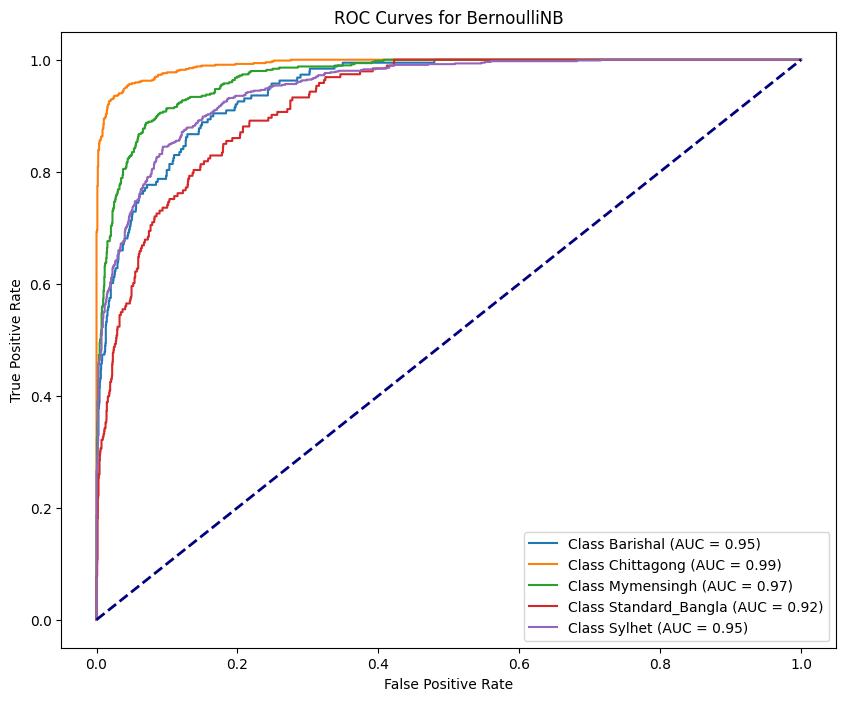

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


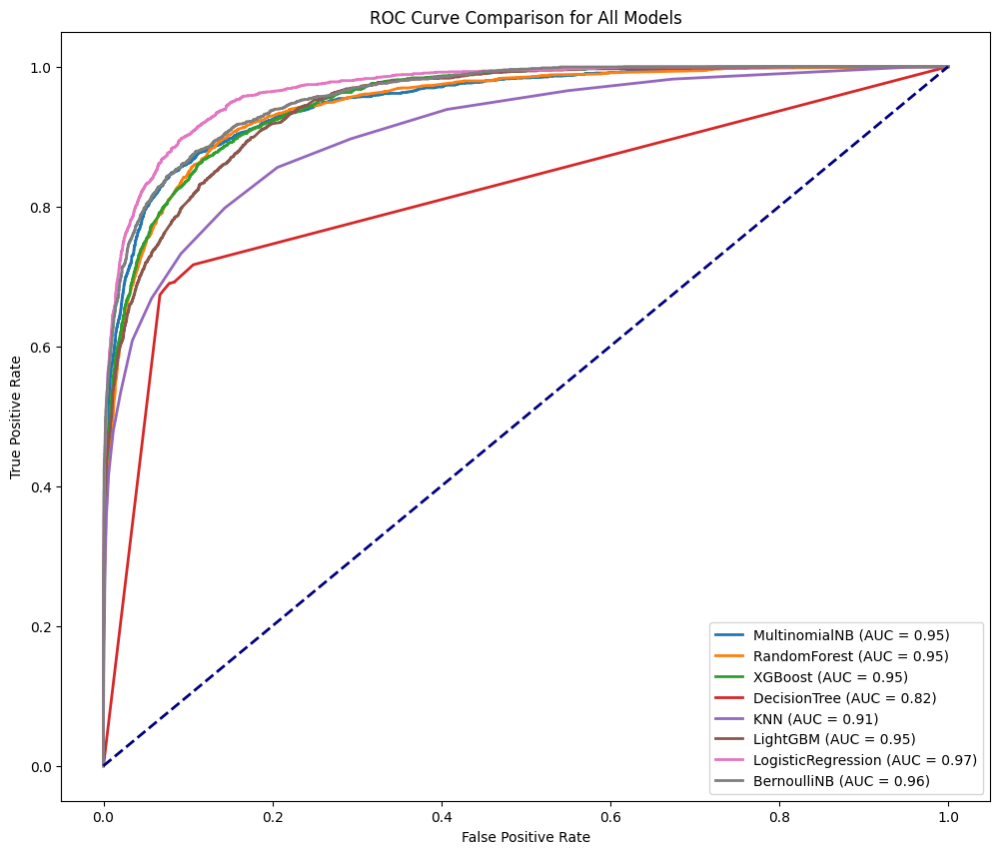

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

In [ ]:
X_train_a, X_test, y_train_a, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#**SMOTE**

In [ ]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=1)
X_train, y_train = smote.fit_resample(X_train_a,y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-34-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-34-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


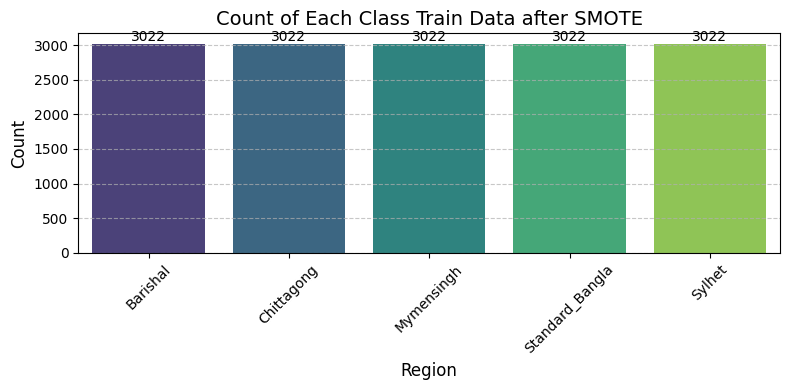

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTE")

## Multinomial NB- 84.38%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8438177874186551
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.83      0.75       186
           1       0.96      0.90      0.93       661
           2       0.83      0.85      0.84       512
           3       0.56      0.83      0.67       170
           4       0.91      0.80      0.85       776

    accuracy                           0.84      2305
   macro avg       0.79      0.84      0.81      2305
weighted avg       0.86      0.84      0.85      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8438177874186551
Precision: 0.8622
Recall for : 0.8438
F1 Score:  0.8488
AUC Score: 0.9674
Balanced Accuracy: 0.8423
G-mean Score: 0.9021
pf Score: 0.0383
Bal Score :  0.8862835468823788


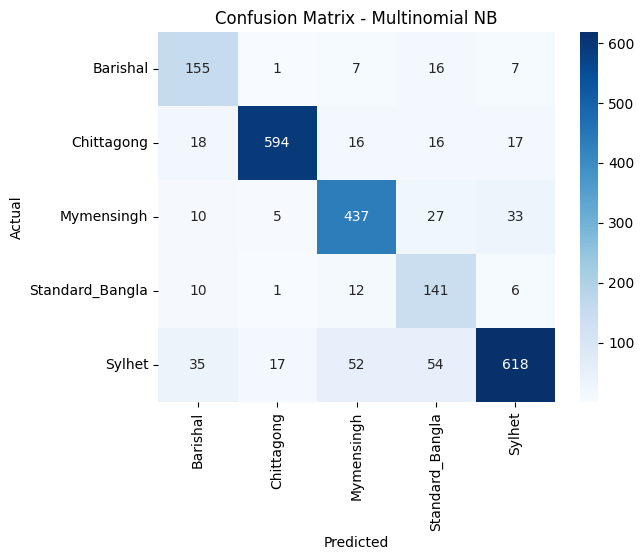

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -76.44%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7644251626898048
Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.77      0.67       186
           1       0.85      0.88      0.87       661
           2       0.83      0.64      0.72       512
           3       0.63      0.73      0.68       170
           4       0.74      0.75      0.75       776

    accuracy                           0.76      2305
   macro avg       0.73      0.76      0.74      2305
weighted avg       0.77      0.76      0.76      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 39.48 seconds
Accuracy: 0.7644251626898048
Precision: 0.7725
Recall for : 0.7644
F1 Score:  0.7646
AUC Score: 0.9283
Balanced Accuracy: 0.7555
G-mean Score: 0.8398
pf Score: 0.0626
Bal Score :  0.8276414561154946


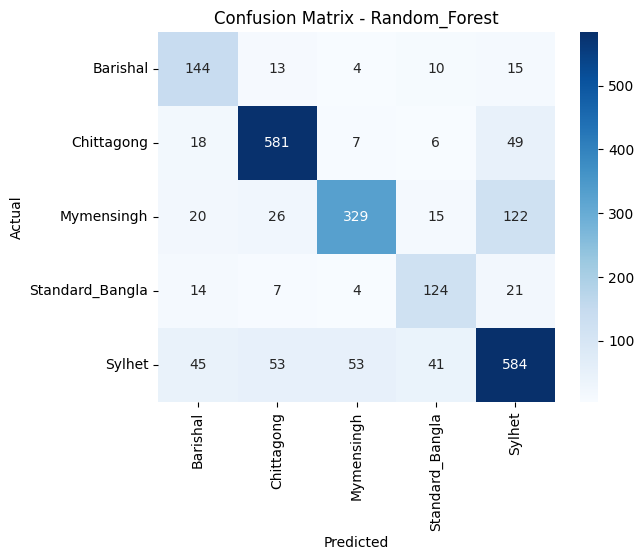

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 76.40%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7639913232104122
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.69      0.65       186
           1       0.80      0.90      0.85       661
           2       0.81      0.69      0.74       512
           3       0.54      0.72      0.62       170
           4       0.82      0.72      0.77       776

    accuracy                           0.76      2305
   macro avg       0.72      0.74      0.73      2305
weighted avg       0.77      0.76      0.76      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 73.40 seconds
Accuracy: 0.7639913232104122
Precision: 0.7733
Recall for : 0.7640
F1 Score:  0.7645
AUC Score: 0.9437
Balanced Accuracy: 0.7450
G-mean Score: 0.8426
pf Score: 0.0613
Bal Score :  0.8275723581382904


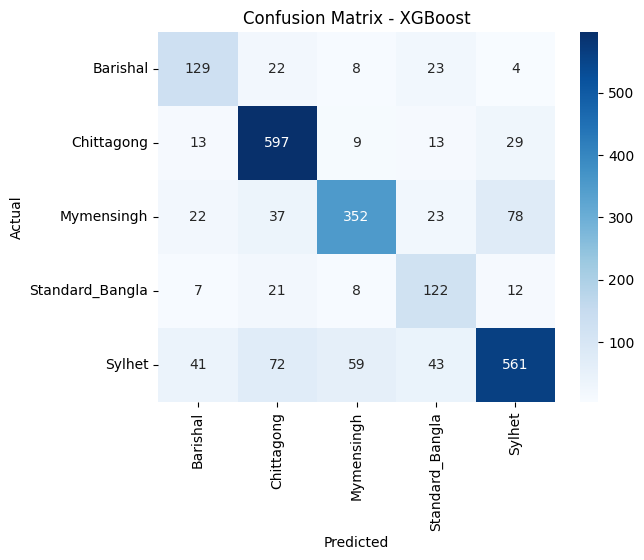

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 67.72%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6772234273318872
Classification Report:
               precision    recall  f1-score   support

           0       0.50      0.63      0.56       186
           1       0.78      0.87      0.82       661
           2       0.64      0.58      0.60       512
           3       0.54      0.66      0.59       170
           4       0.70      0.60      0.64       776

    accuracy                           0.68      2305
   macro avg       0.63      0.67      0.64      2305
weighted avg       0.68      0.68      0.68      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 2.47 seconds
Accuracy: 0.6772234273318872
Precision: 0.6809
Recall for : 0.6772
F1 Score:  0.6756
AUC Score: 0.7997
Balanced Accuracy: 0.6675
G-mean Score: 0.7806
pf Score: 0.0846
Bal Score :  0.7640531288700566


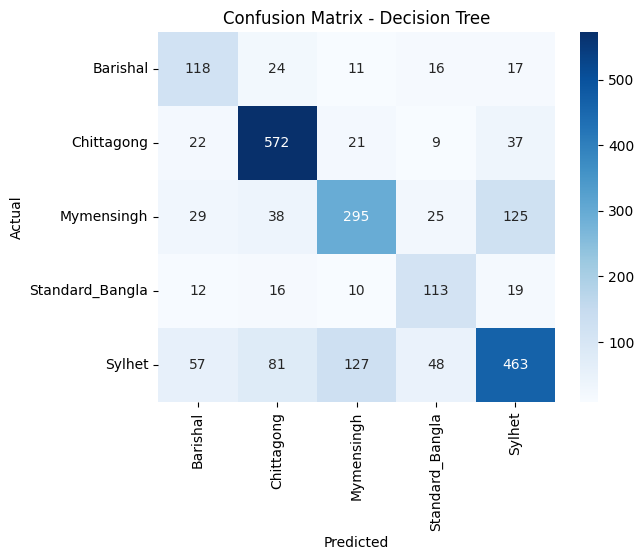

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 28.42%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2841648590021692
Classification Report:
               precision    recall  f1-score   support

           0       0.13      0.87      0.22       186
           1       0.92      0.51      0.65       661
           2       0.75      0.01      0.01       512
           3       0.21      0.79      0.33       170
           4       1.00      0.03      0.05       776

    accuracy                           0.28      2305
   macro avg       0.60      0.44      0.25      2305
weighted avg       0.79      0.28      0.25      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.2841648590021692
Precision: 0.7915
Recall for : 0.2842
F1 Score:  0.2493
AUC Score: 0.7427
Balanced Accuracy: 0.4399
G-mean Score: 0.5154
pf Score: 0.1562
Bal Score :  0.48191218569669014


## LightGBM Model -75.31%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.112142 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 19400
[LightGBM] [Info] Number of data points in the train set: 15110, number of used features: 674
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7531453362255965
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.73      0.56       186
           1       0.86      0.85      0.85       661
           2       0.81      0.72      0.76       512
           3       0.54      0.74      0.63       170
           4       0.81      0.71      0.75       776

    accuracy                           0.75      2305
   macro avg       0.70      0.75      0.71      2305
weighted avg       0.78      0.75      0.76      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 11.32 seconds
Accuracy: 0.7531453362255965
Precision: 0.7765
Recall for : 0.7531
F1 Score:  0.7596
AUC Score: 0.9476
Balanced Accuracy: 0.7475
G-mean Score: 0.8394
pf Score: 0.0623
Bal Score :  0.8199787536363417


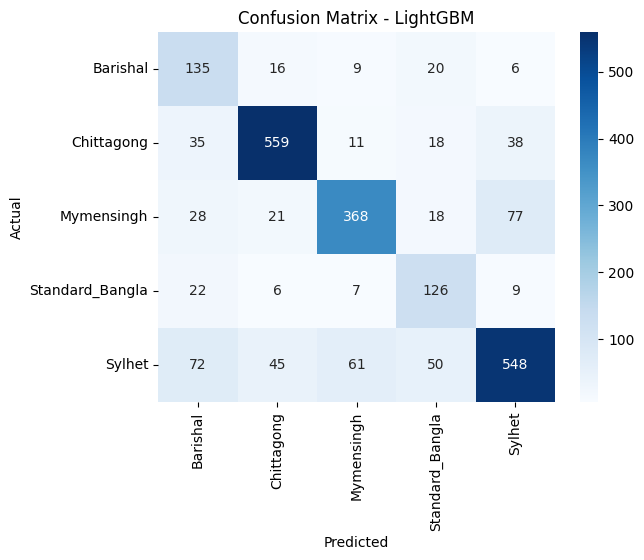

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 83.25%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8325379609544469
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.83      0.71       186
           1       0.94      0.91      0.92       661
           2       0.86      0.80      0.83       512
           3       0.58      0.82      0.68       170
           4       0.89      0.79      0.84       776

    accuracy                           0.83      2305
   macro avg       0.77      0.83      0.79      2305
weighted avg       0.85      0.83      0.84      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.25 seconds
Accuracy: 0.8325379609544469
Precision: 0.8501
Recall for : 0.8325
F1 Score:  0.8372
AUC Score: 0.9647
Balanced Accuracy: 0.8314
G-mean Score: 0.8941
pf Score: 0.0415
Bal Score :  0.8780103267876462


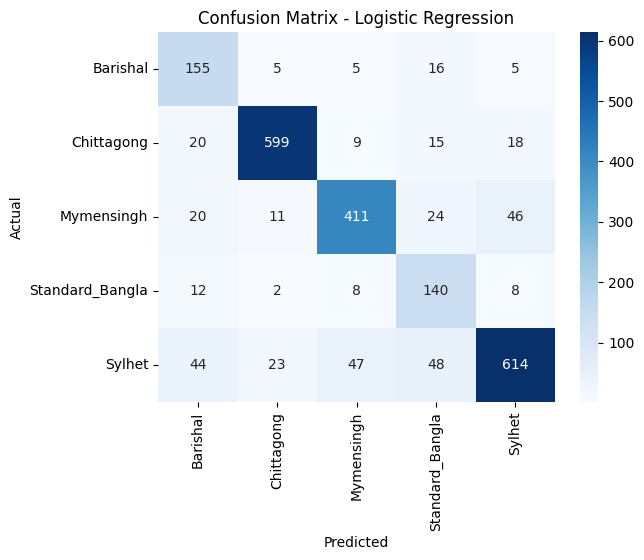

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 81.65%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8164859002169197
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.85      0.73       186
           1       0.96      0.89      0.92       661
           2       0.92      0.74      0.82       512
           3       0.44      0.90      0.59       170
           4       0.89      0.77      0.83       776

    accuracy                           0.82      2305
   macro avg       0.77      0.83      0.78      2305
weighted avg       0.86      0.82      0.83      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8164859002169197
Precision: 0.8614
Recall for : 0.8165
F1 Score:  0.8281
AUC Score: 0.9717
Balanced Accuracy: 0.8318
G-mean Score: 0.8874
pf Score: 0.0438
Bal Score :  0.8665912215710151


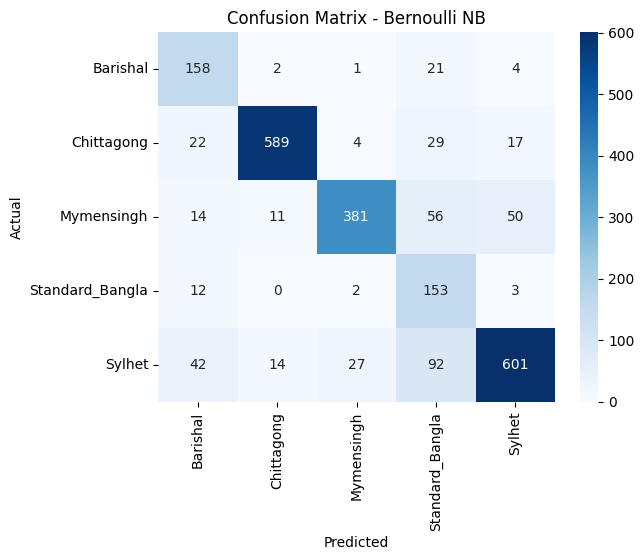

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

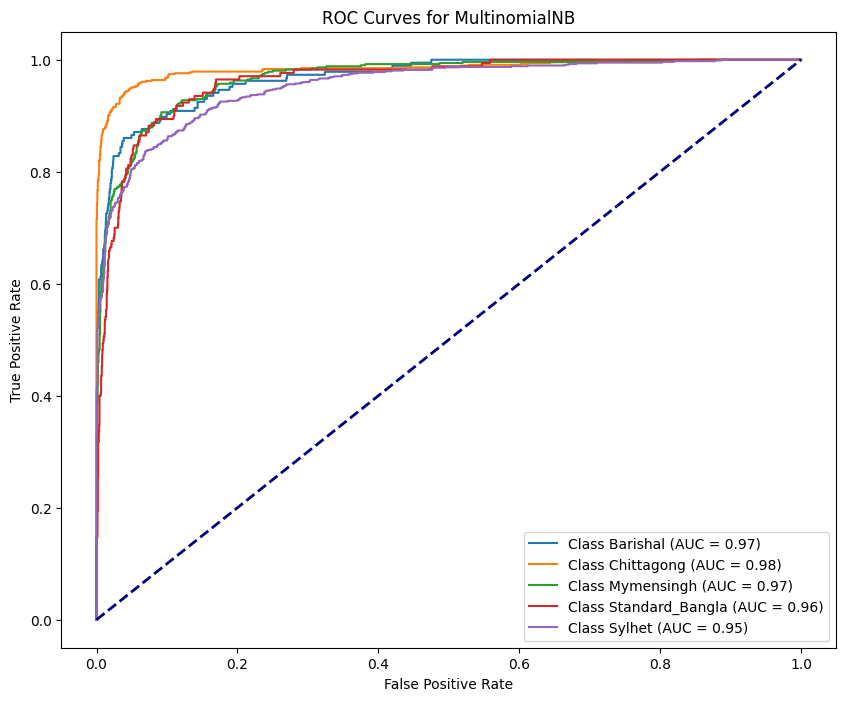

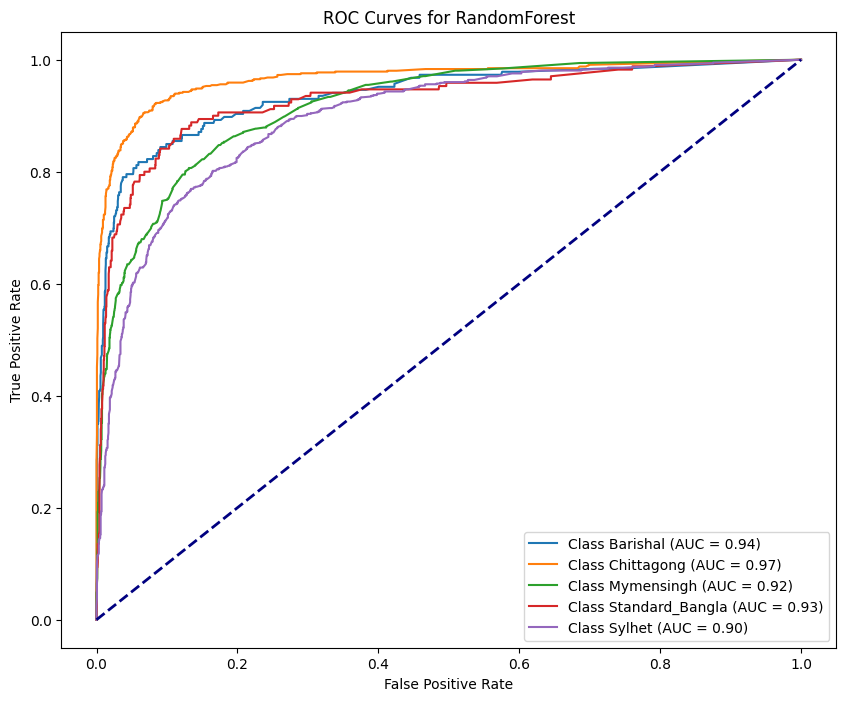

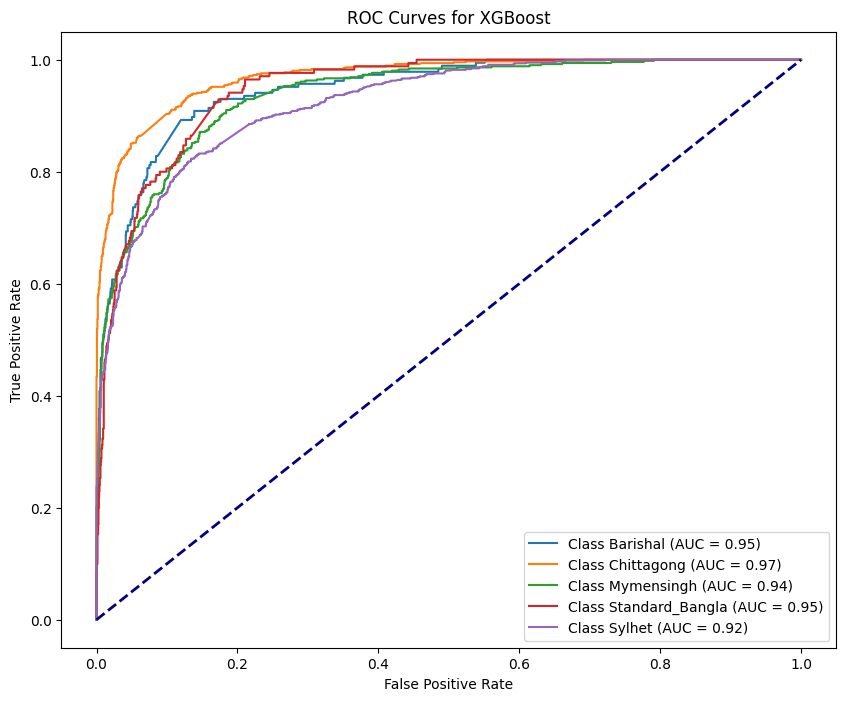

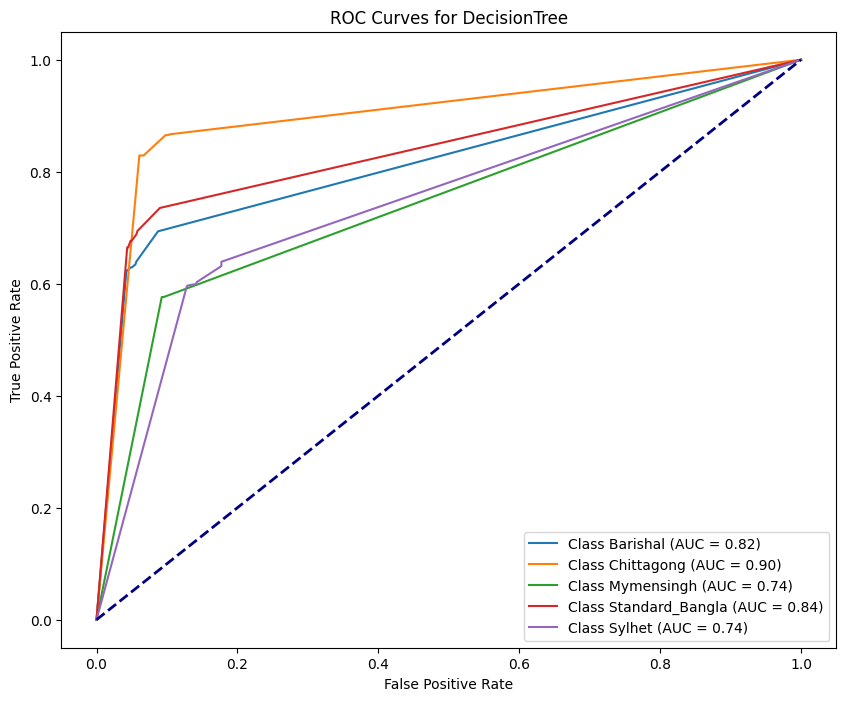

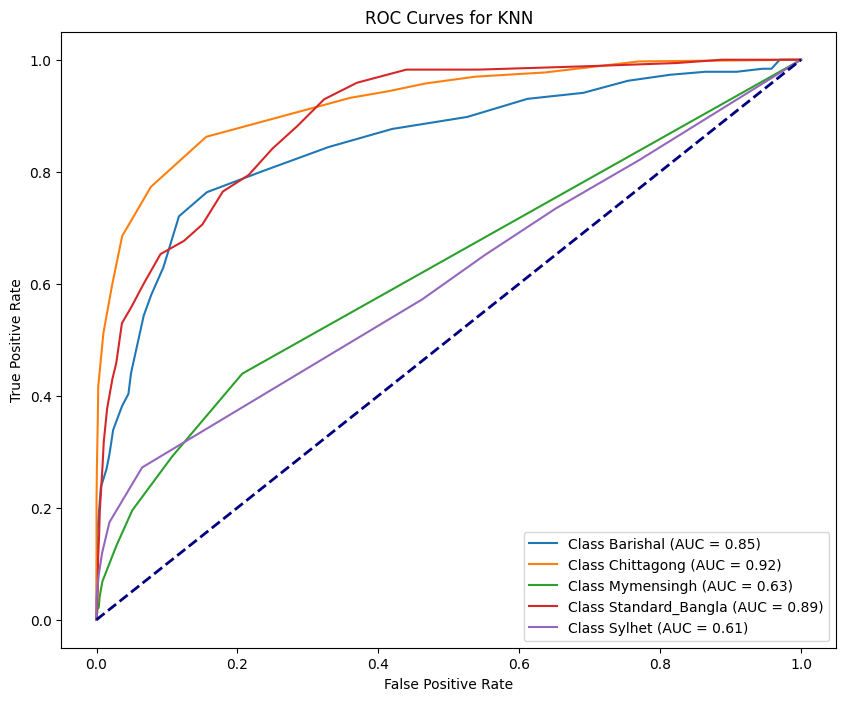

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


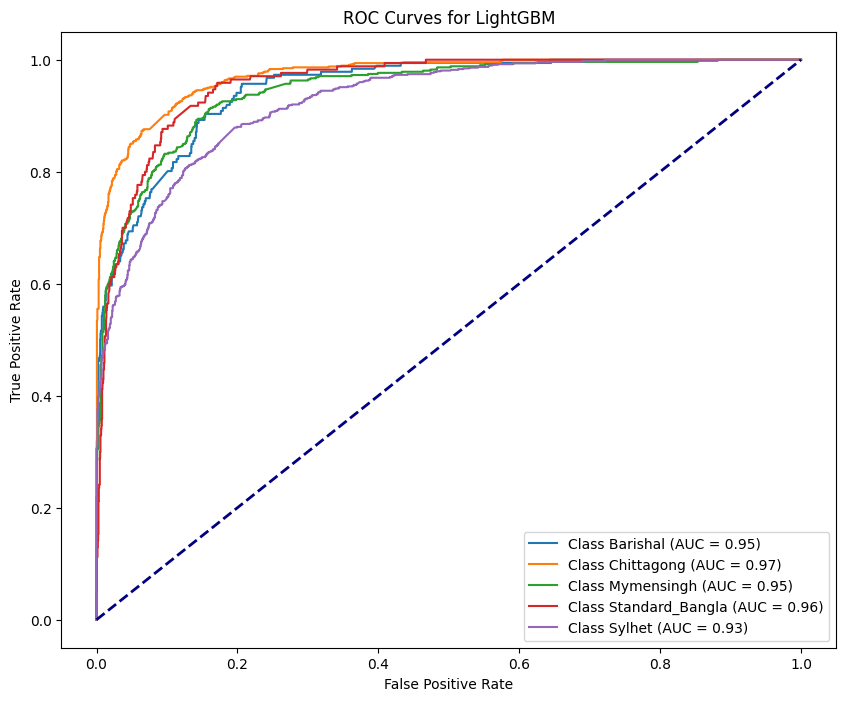

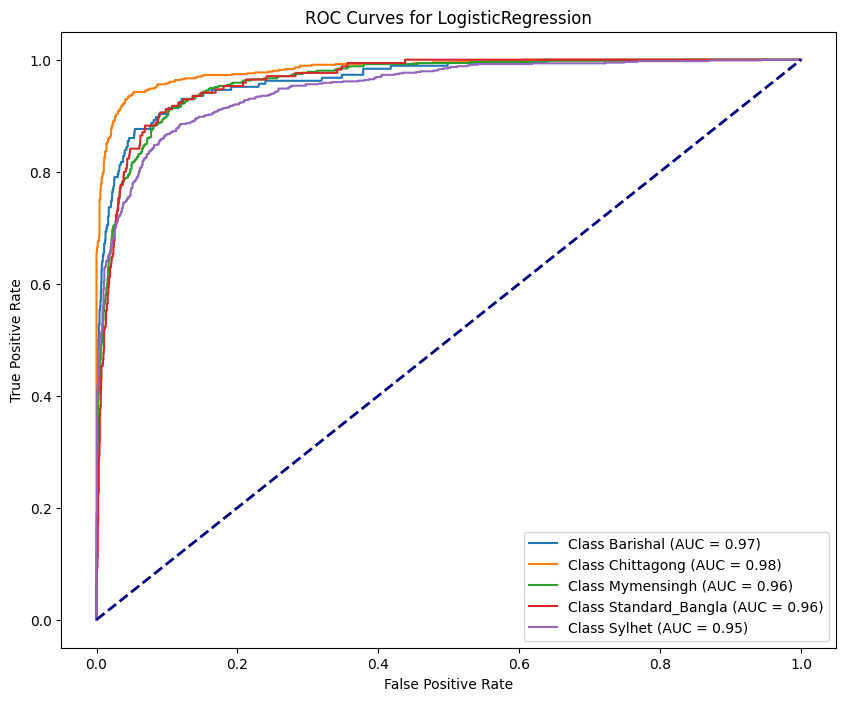

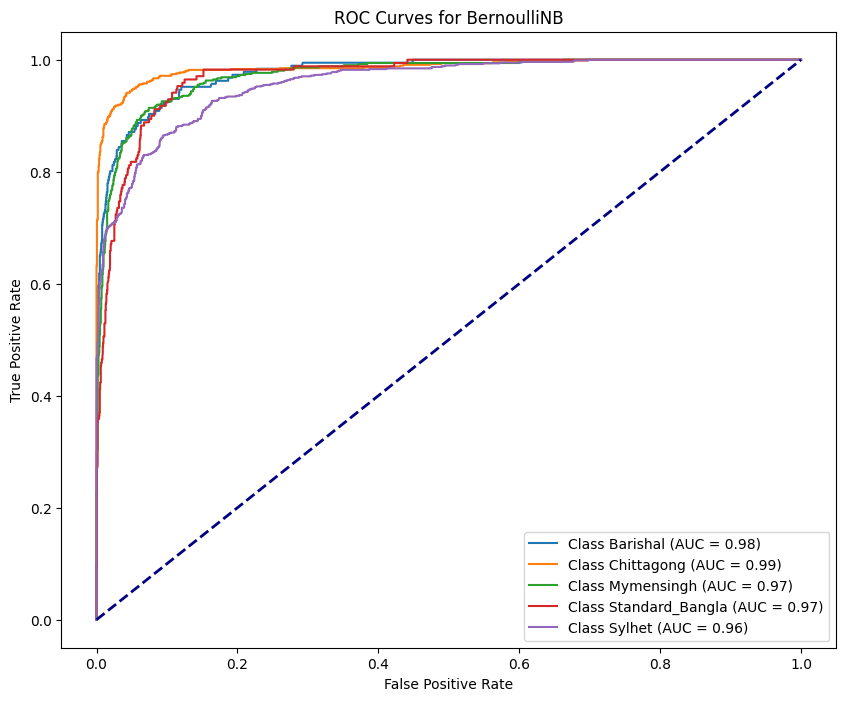

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


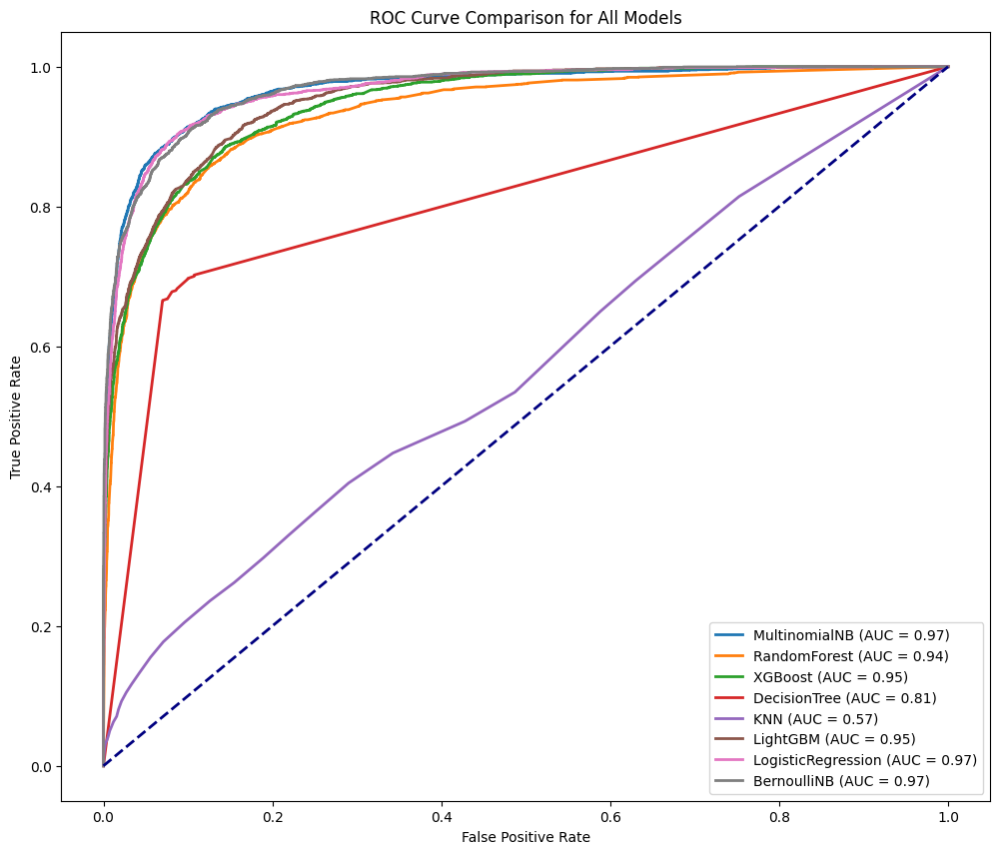

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS**

In [ ]:
from imblearn.over_sampling import RandomOverSampler

In [ ]:
rose = RandomOverSampler(random_state=42)
X_train, y_train = rose.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-382-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-382-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


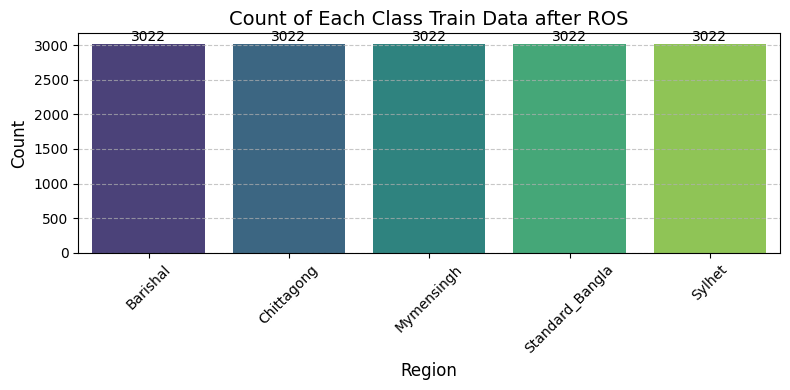

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS")

## Multinomial NB- 83.90%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8390455531453362
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.82      0.75       186
           1       0.96      0.90      0.93       661
           2       0.83      0.84      0.84       512
           3       0.52      0.82      0.63       170
           4       0.91      0.80      0.85       776

    accuracy                           0.84      2305
   macro avg       0.78      0.83      0.80      2305
weighted avg       0.86      0.84      0.85      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8390455531453362
Precision: 0.8608
Recall for : 0.8390
F1 Score:  0.8453
AUC Score: 0.9673
Balanced Accuracy: 0.8350
G-mean Score: 0.8997
pf Score: 0.0392
Bal Score :  0.8828560690840683


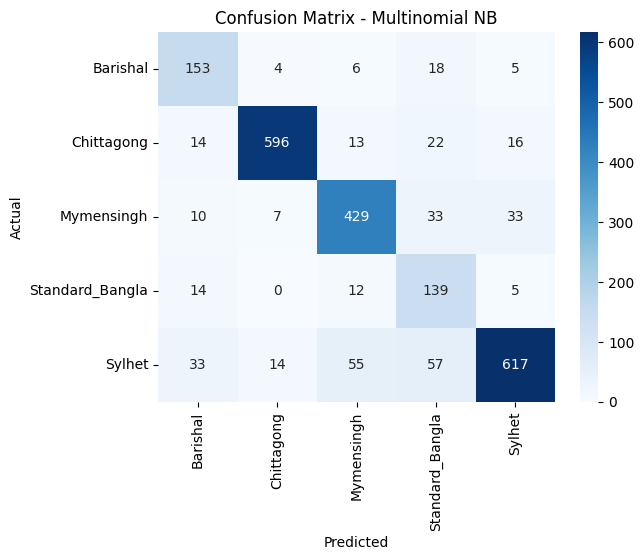

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -75.84%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7583514099783081
Classification Report:
               precision    recall  f1-score   support

           0       0.58      0.76      0.66       186
           1       0.85      0.88      0.86       661
           2       0.75      0.70      0.72       512
           3       0.59      0.72      0.65       170
           4       0.78      0.70      0.74       776

    accuracy                           0.76      2305
   macro avg       0.71      0.75      0.73      2305
weighted avg       0.77      0.76      0.76      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 45.19 seconds
Accuracy: 0.7583514099783081
Precision: 0.7654
Recall for : 0.7584
F1 Score:  0.7594
AUC Score: 0.9249
Balanced Accuracy: 0.7530
G-mean Score: 0.8387
pf Score: 0.0628
Bal Score :  0.8234491747212499


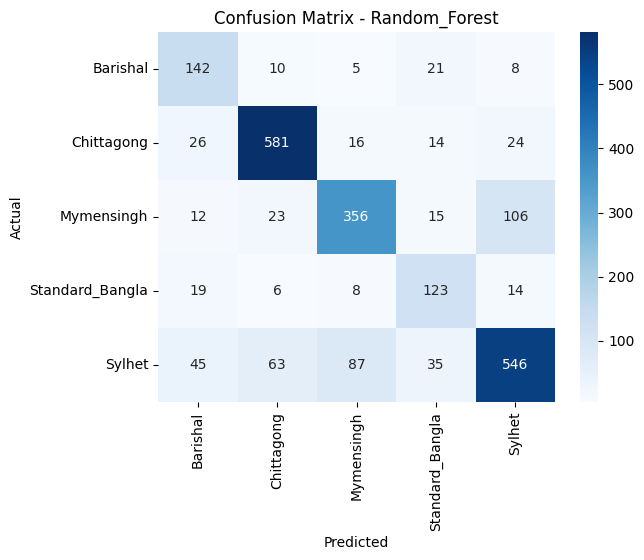

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 75.01%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7501084598698482
Classification Report:
               precision    recall  f1-score   support

           0       0.43      0.78      0.55       186
           1       0.89      0.82      0.85       661
           2       0.79      0.76      0.77       512
           3       0.51      0.72      0.60       170
           4       0.85      0.68      0.76       776

    accuracy                           0.75      2305
   macro avg       0.69      0.75      0.71      2305
weighted avg       0.79      0.75      0.76      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 59.40 seconds
Accuracy: 0.7501084598698482
Precision: 0.7888
Recall for : 0.7501
F1 Score:  0.7604
AUC Score: 0.9426
Balanced Accuracy: 0.7524
G-mean Score: 0.8412
pf Score: 0.0613
Bal Score :  0.8180629540794944


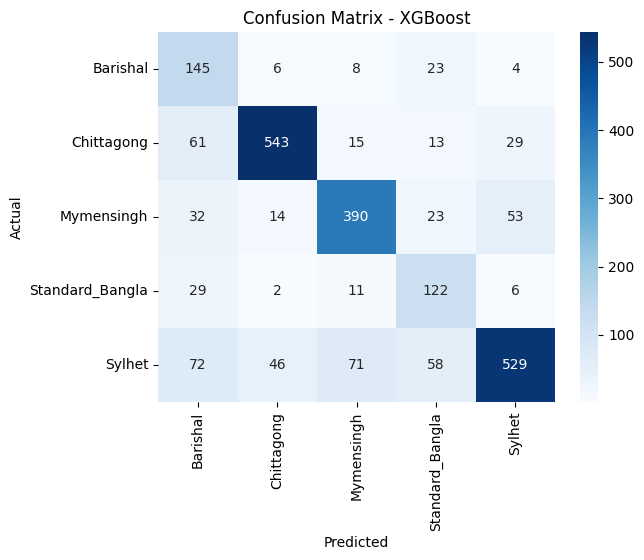

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 65.03%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6503253796095445
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.65      0.50       186
           1       0.82      0.82      0.82       661
           2       0.59      0.57      0.58       512
           3       0.48      0.60      0.53       170
           4       0.68      0.57      0.62       776

    accuracy                           0.65      2305
   macro avg       0.60      0.64      0.61      2305
weighted avg       0.67      0.65      0.65      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 2.82 seconds
Accuracy: 0.6503253796095445
Precision: 0.6658
Recall for : 0.6503
F1 Score:  0.6540
AUC Score: 0.7837
Balanced Accuracy: 0.6411
G-mean Score: 0.7645
pf Score: 0.0902
Bal Score :  0.7446468376455486


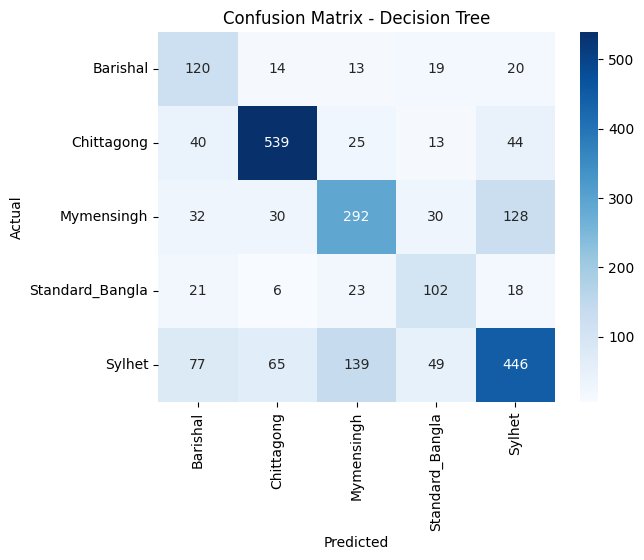

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 15.10%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.1509761388286334
Classification Report:
               precision    recall  f1-score   support

           0       0.08      0.91      0.15       186
           1       1.00      0.05      0.09       661
           2       0.86      0.01      0.02       512
           3       0.50      0.66      0.57       170
           4       0.91      0.04      0.07       776

    accuracy                           0.15      2305
   macro avg       0.67      0.33      0.18      2305
weighted avg       0.83      0.15      0.11      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.1509761388286334
Precision: 0.8269
Recall for : 0.1510
F1 Score:  0.1094
AUC Score: 0.8128
Balanced Accuracy: 0.3337
G-mean Score: 0.3737
pf Score: 0.1848
Bal Score :  0.38559921278252896


## LightGBM Model -75.44%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105346 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 14598
[LightGBM] [Info] Number of data points in the train set: 15110, number of used features: 632
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7544468546637744
Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.73      0.55       186
           1       0.89      0.84      0.86       661
           2       0.81      0.76      0.78       512
           3       0.50      0.72      0.59       170
           4       0.83      0.69      0.76       776

    accuracy                           0.75      2305
   macro avg       0.69      0.75      0.71      2305
weighted avg       0.79      0.75      0.76      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 10.06 seconds
Accuracy: 0.7544468546637744
Precision: 0.7857
Recall for : 0.7544
F1 Score:  0.7635
AUC Score: 0.9461
Balanced Accuracy: 0.7473
G-mean Score: 0.8427
pf Score: 0.0609
Bal Score :  0.8211152593191136


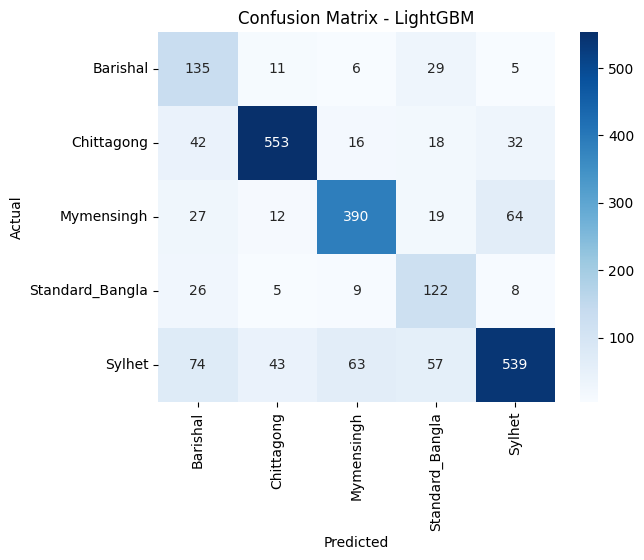

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 84.03%




In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8403470715835141
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.83      0.75       186
           1       0.93      0.91      0.92       661
           2       0.84      0.82      0.83       512
           3       0.61      0.79      0.69       170
           4       0.88      0.80      0.84       776

    accuracy                           0.84      2305
   macro avg       0.79      0.83      0.81      2305
weighted avg       0.85      0.84      0.84      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 2.63 seconds
Accuracy: 0.8403470715835141
Precision: 0.8505
Recall for : 0.8403
F1 Score:  0.8432
AUC Score: 0.9661
Balanced Accuracy: 0.8330
G-mean Score: 0.8974
pf Score: 0.0403
Bal Score :  0.8835718300694995


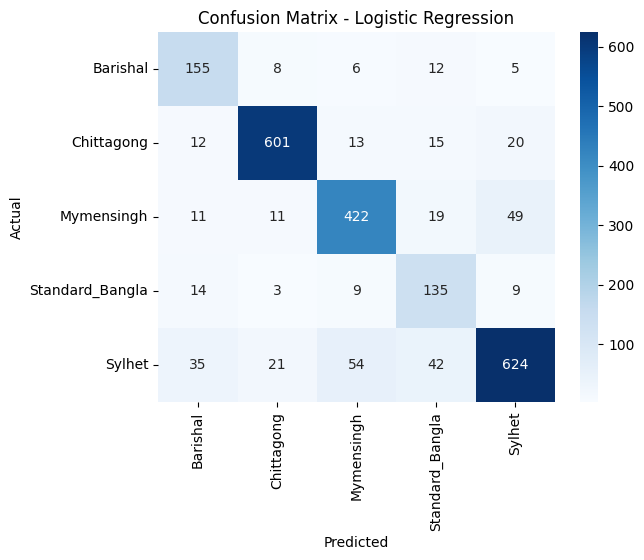

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 81.78%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8177874186550976
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.84      0.72       186
           1       0.96      0.88      0.92       661
           2       0.90      0.80      0.85       512
           3       0.44      0.89      0.59       170
           4       0.90      0.75      0.82       776

    accuracy                           0.82      2305
   macro avg       0.77      0.83      0.78      2305
weighted avg       0.86      0.82      0.83      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8177874186550976
Precision: 0.8603
Recall for : 0.8178
F1 Score:  0.8290
AUC Score: 0.9715
Balanced Accuracy: 0.8343
G-mean Score: 0.8884
pf Score: 0.0434
Bal Score :  0.8675519318860413


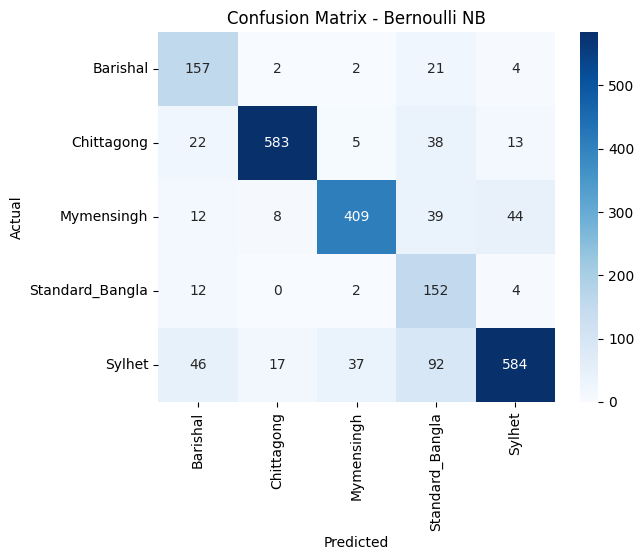

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

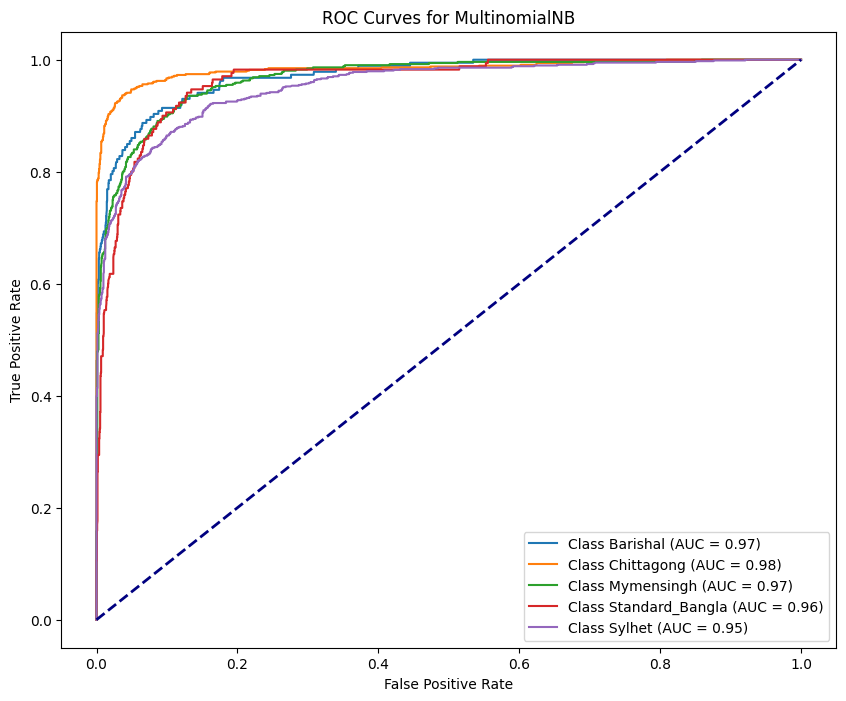

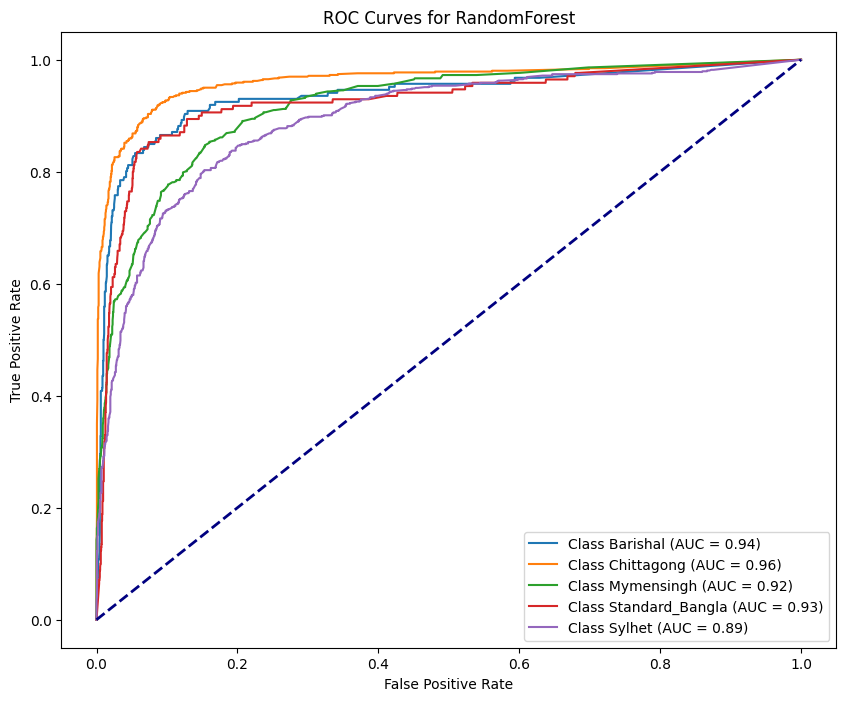

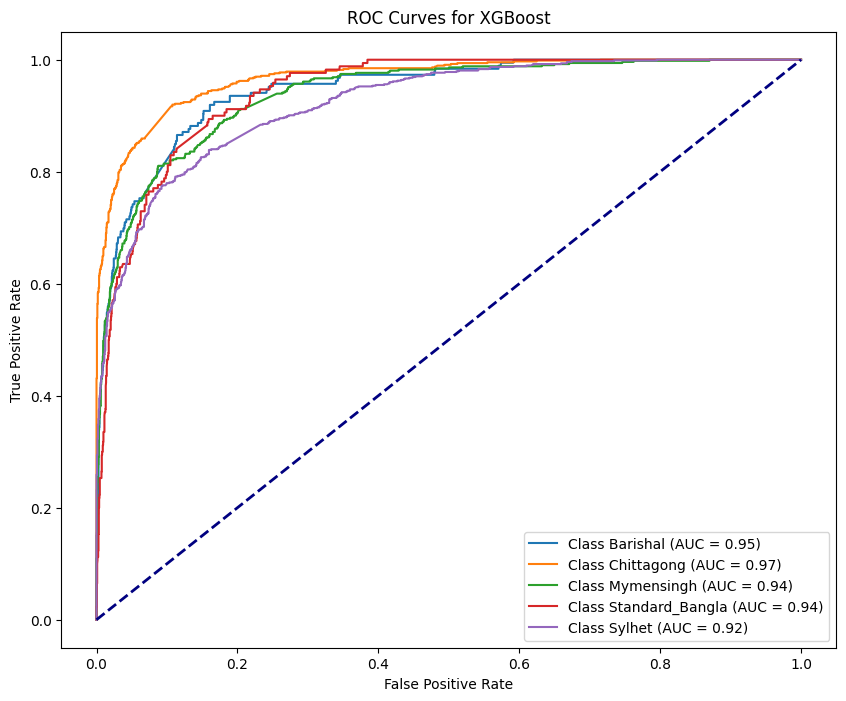

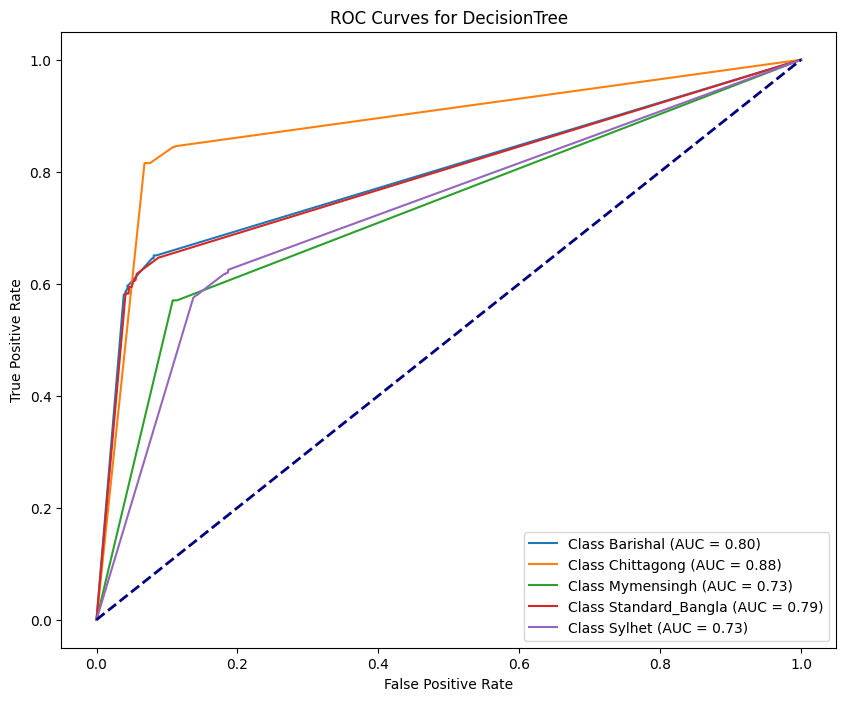

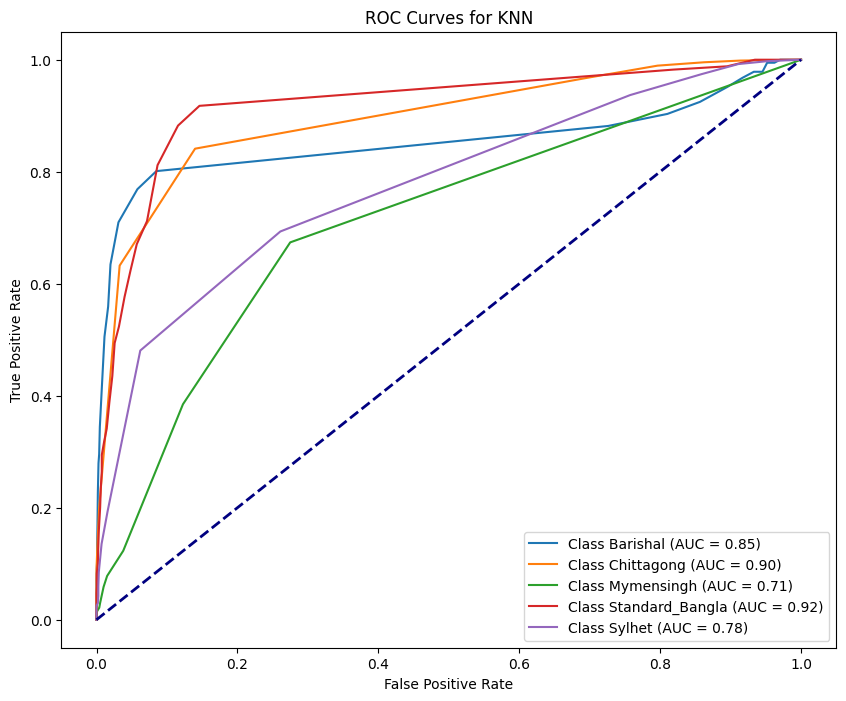

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


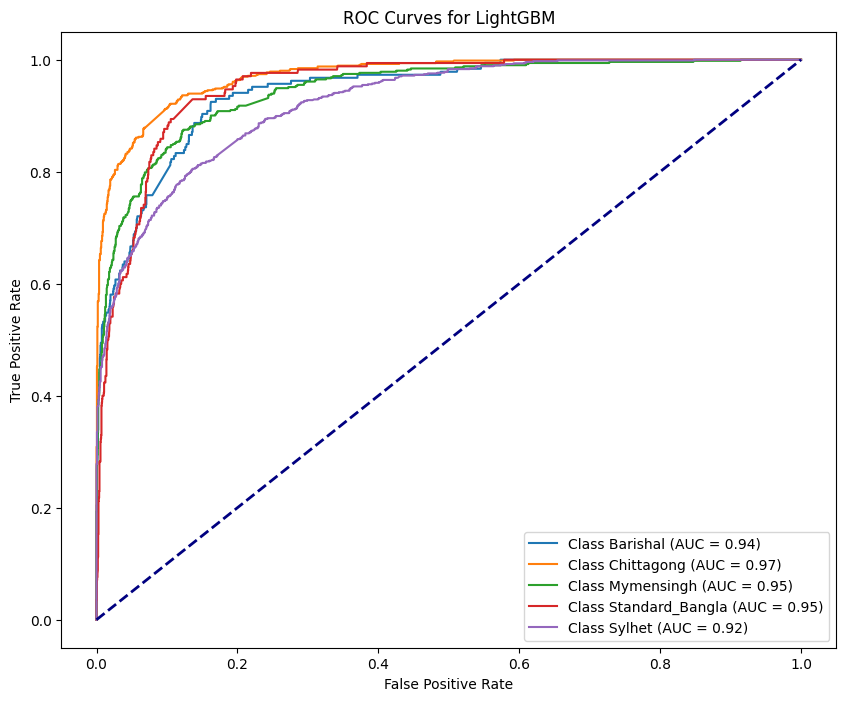

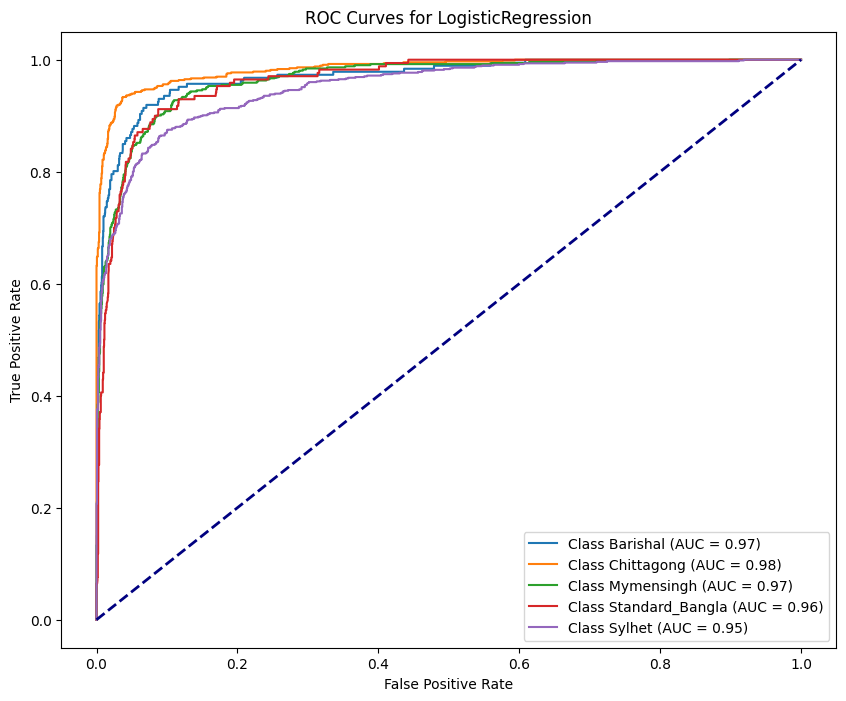

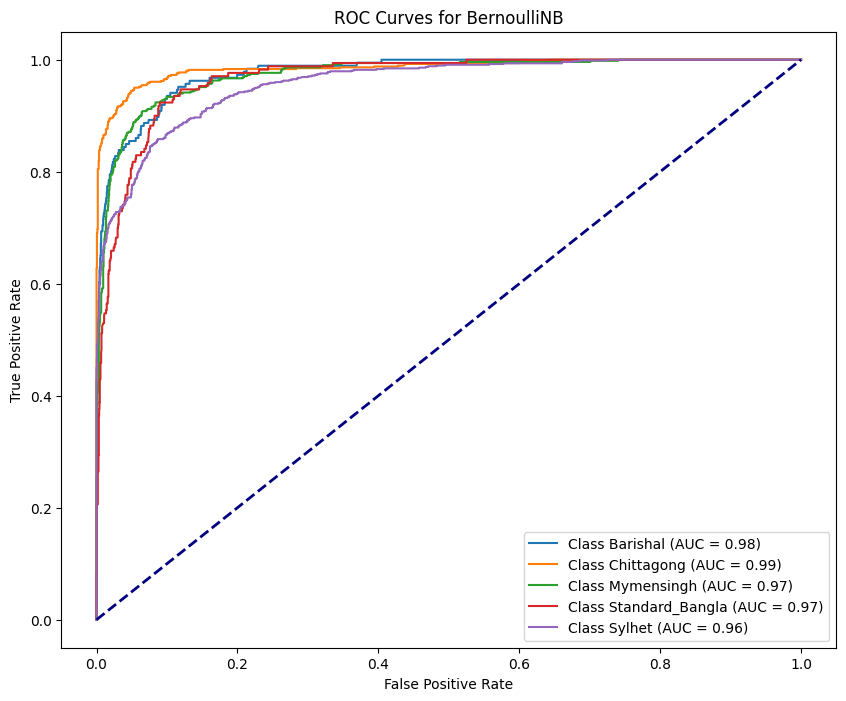

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


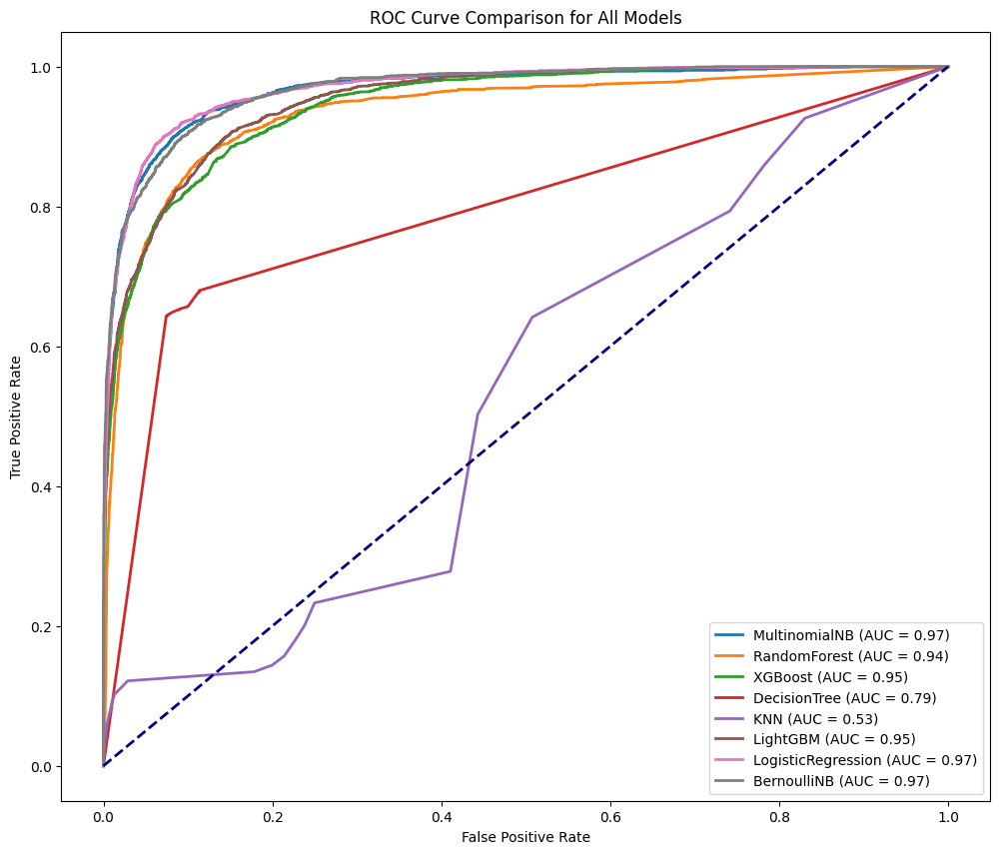

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ADASYN**

In [ ]:
from imblearn.over_sampling import ADASYN
adasyn = ADASYN(sampling_strategy='minority', random_state=42)
X_train, y_train = adasyn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-430-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-430-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


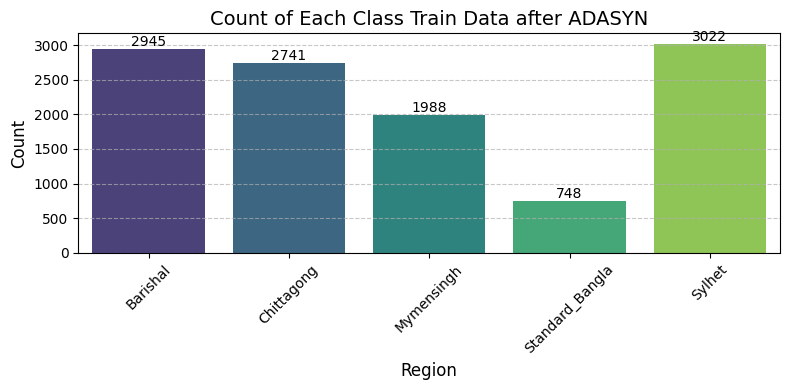

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ADASYN")

## Multinomial NB- 80.78%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8078091106290672
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.92      0.61       186
           1       0.95      0.91      0.93       661
           2       0.91      0.75      0.82       512
           3       1.00      0.17      0.29       170
           4       0.80      0.88      0.84       776

    accuracy                           0.81      2305
   macro avg       0.82      0.72      0.70      2305
weighted avg       0.85      0.81      0.80      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8078091106290672
Precision: 0.8543
Recall for : 0.8078
F1 Score:  0.8006
AUC Score: 0.9658
Balanced Accuracy: 0.7248
G-mean Score: 0.8735
pf Score: 0.0495
Bal Score :  0.8596621972128712


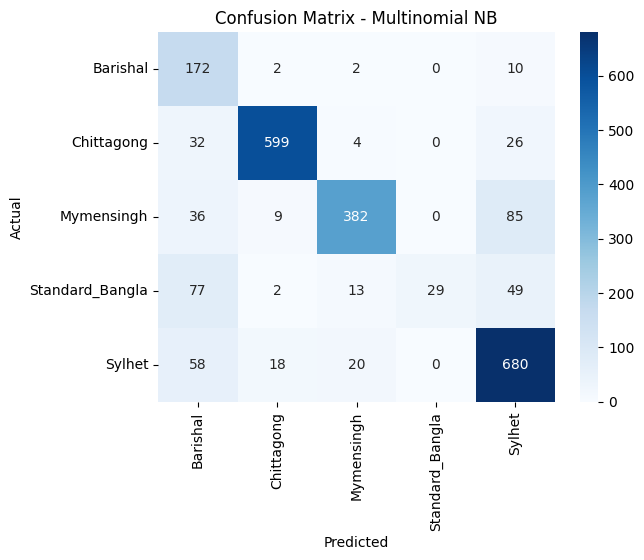

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -75.75%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7574837310195228
Classification Report:
               precision    recall  f1-score   support

           0       0.46      0.81      0.59       186
           1       0.87      0.90      0.88       661
           2       0.82      0.62      0.70       512
           3       0.70      0.64      0.67       170
           4       0.77      0.74      0.76       776

    accuracy                           0.76      2305
   macro avg       0.72      0.74      0.72      2305
weighted avg       0.78      0.76      0.76      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 38.88 seconds
Accuracy: 0.7574837310195228
Precision: 0.7774
Recall for : 0.7575
F1 Score:  0.7603
AUC Score: 0.9277
Balanced Accuracy: 0.7421
G-mean Score: 0.8386
pf Score: 0.0628
Bal Score :  0.8228536155028113


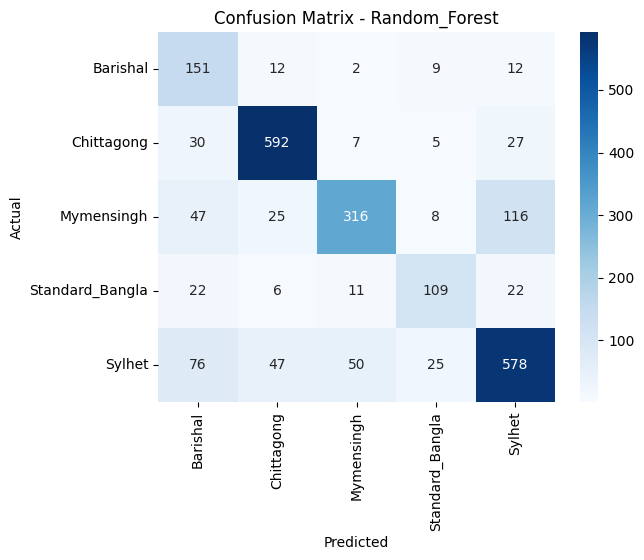

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 74.53%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7453362255965292
Classification Report:
               precision    recall  f1-score   support

           0       0.37      0.89      0.52       186
           1       0.89      0.82      0.86       661
           2       0.82      0.69      0.75       512
           3       0.76      0.49      0.59       170
           4       0.80      0.74      0.77       776

    accuracy                           0.75      2305
   macro avg       0.73      0.73      0.70      2305
weighted avg       0.80      0.75      0.76      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 52.88 seconds
Accuracy: 0.7453362255965292
Precision: 0.7960
Recall for : 0.7453
F1 Score:  0.7575
AUC Score: 0.9461
Balanced Accuracy: 0.7258
G-mean Score: 0.8356
pf Score: 0.0636
Bal Score :  0.8144028735258182


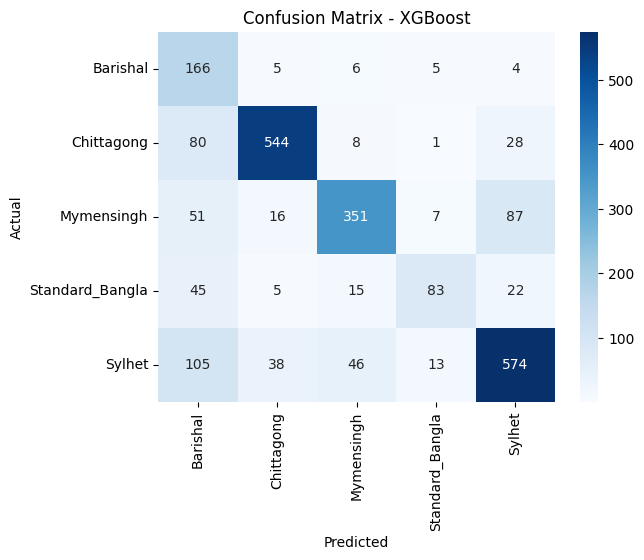

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 67.11%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6711496746203904
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.77      0.54       186
           1       0.83      0.83      0.83       661
           2       0.63      0.55      0.59       512
           3       0.57      0.49      0.53       170
           4       0.69      0.63      0.66       776

    accuracy                           0.67      2305
   macro avg       0.63      0.65      0.63      2305
weighted avg       0.69      0.67      0.67      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.96 seconds
Accuracy: 0.6711496746203904
Precision: 0.6877
Recall for : 0.6711
F1 Score:  0.6738
AUC Score: 0.7963
Balanced Accuracy: 0.6538
G-mean Score: 0.7783
pf Score: 0.0852
Bal Score :  0.7597828705924508


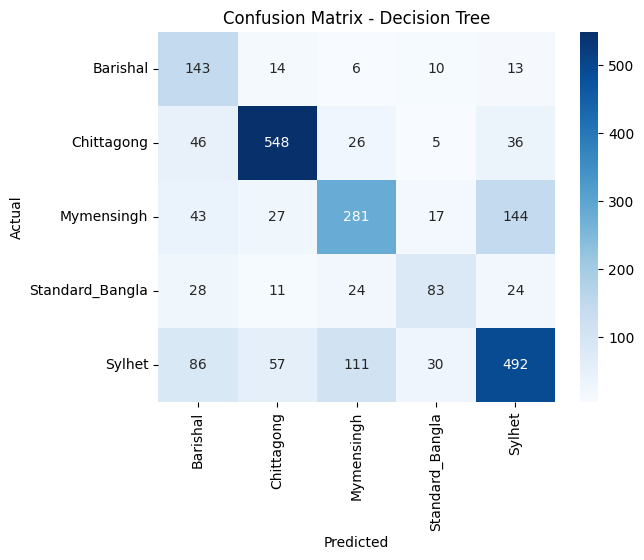

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 9.54%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.09544468546637744
Classification Report:
               precision    recall  f1-score   support

           0       0.08      1.00      0.15       186
           1       1.00      0.03      0.05       661
           2       0.00      0.00      0.00       512
           3       0.75      0.02      0.03       170
           4       0.87      0.02      0.03       776

    accuracy                           0.10      2305
   macro avg       0.54      0.21      0.05      2305
weighted avg       0.64      0.10      0.04      2305



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.09544468546637744
Precision: 0.6405
Recall for : 0.0954
F1 Score:  0.0410
AUC Score: 0.6971
Balanced Accuracy: 0.2123
G-mean Score: 0.2964
pf Score: 0.1969
Bal Score :  0.34541028639063176


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## LightGBM Model -74.06%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.151597 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13369
[LightGBM] [Info] Number of data points in the train set: 11444, number of used features: 524
[LightGBM] [Info] Start training from score -1.357357
[LightGBM] [Info] Start training from score -1.429143
[LightGBM] [Info] Start training from score -1.750336
[LightGBM] [Info] Start training from score -2.727818
[LightGBM] [Info] Start training from score -1.331547


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7405639913232104
Classification Report:
               precision    recall  f1-score   support

           0       0.40      0.78      0.53       186
           1       0.87      0.83      0.85       661
           2       0.79      0.71      0.75       512
           3       0.64      0.46      0.54       170
           4       0.79      0.74      0.76       776

    accuracy                           0.74      2305
   macro avg       0.70      0.70      0.68      2305
weighted avg       0.77      0.74      0.75      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 7.77 seconds
Accuracy: 0.7405639913232104
Precision: 0.7693
Recall for : 0.7406
F1 Score:  0.7478
AUC Score: 0.9444
Balanced Accuracy: 0.7045
G-mean Score: 0.8298
pf Score: 0.0659
Bal Score :  0.8107215983432727


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

7.7703
0.7406
0.7693
0.7406
0.7478
0.9444
0.7045
0.8298
0.0659
0.8107


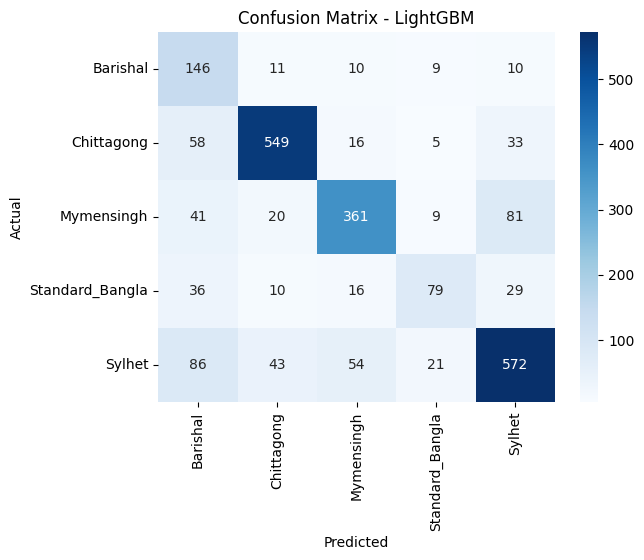

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 81.08%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8108459869848156
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.92      0.62       186
           1       0.94      0.89      0.91       661
           2       0.86      0.75      0.80       512
           3       0.82      0.49      0.61       170
           4       0.84      0.83      0.83       776

    accuracy                           0.81      2305
   macro avg       0.79      0.78      0.76      2305
weighted avg       0.84      0.81      0.82      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.78 seconds
Accuracy: 0.8108459869848156
Precision: 0.8406
Recall for : 0.8108
F1 Score:  0.8157
AUC Score: 0.9660
Balanced Accuracy: 0.7752
G-mean Score: 0.8777
pf Score: 0.0478
Bal Score :  0.8620383286056518


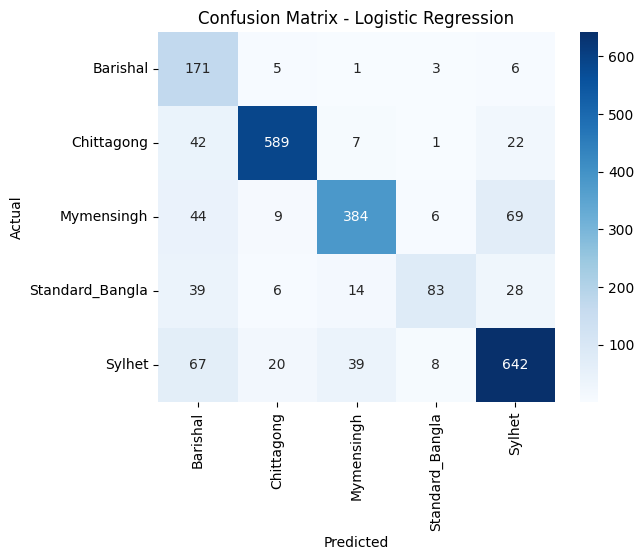

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 79.26%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7926247288503254
Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.96      0.56       186
           1       0.95      0.89      0.92       661
           2       0.91      0.76      0.83       512
           3       0.81      0.15      0.26       170
           4       0.84      0.83      0.83       776

    accuracy                           0.79      2305
   macro avg       0.78      0.72      0.68      2305
weighted avg       0.85      0.79      0.79      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.7926247288503254
Precision: 0.8490
Recall for : 0.7926
F1 Score:  0.7926
AUC Score: 0.9675
Balanced Accuracy: 0.7192
G-mean Score: 0.8686
pf Score: 0.0511
Bal Score :  0.8489761366691758


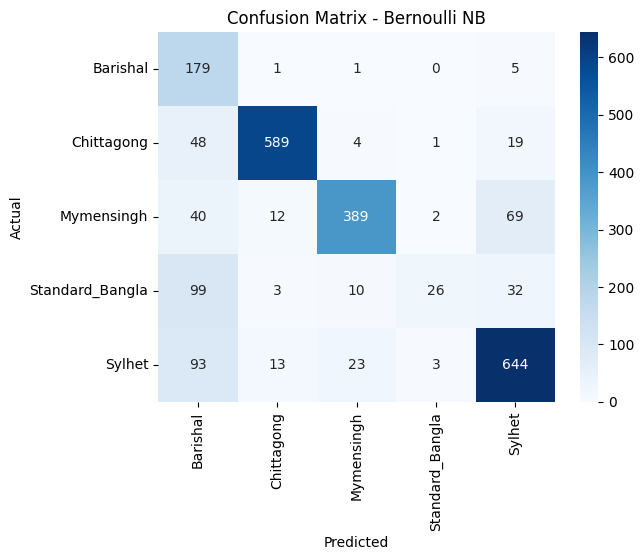

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

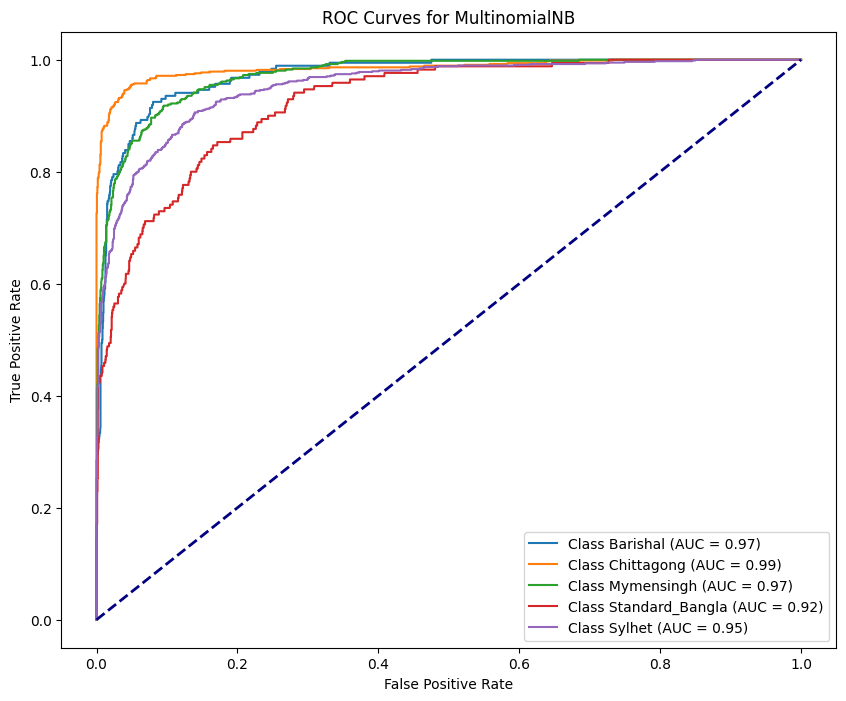

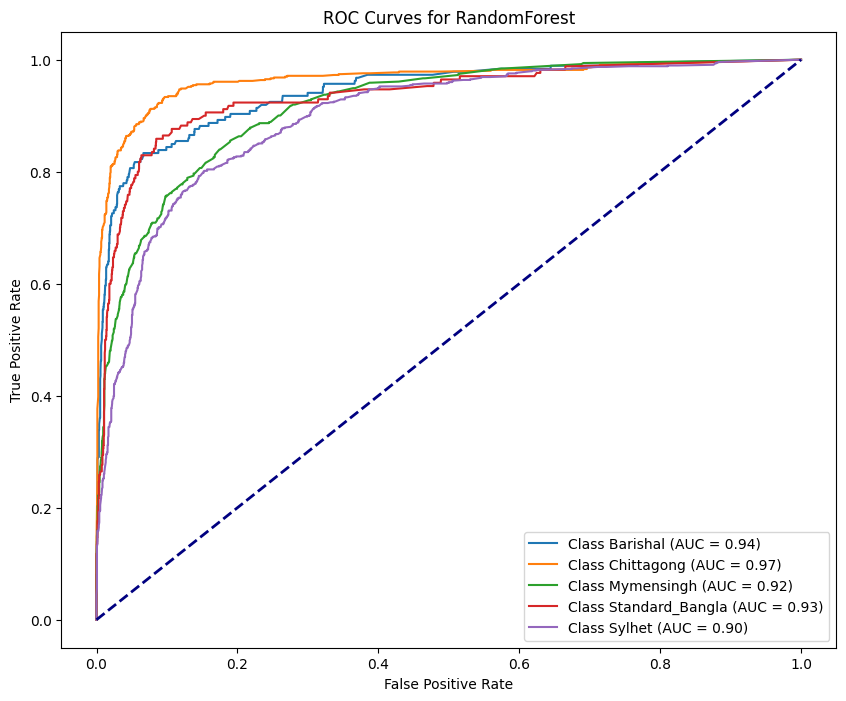

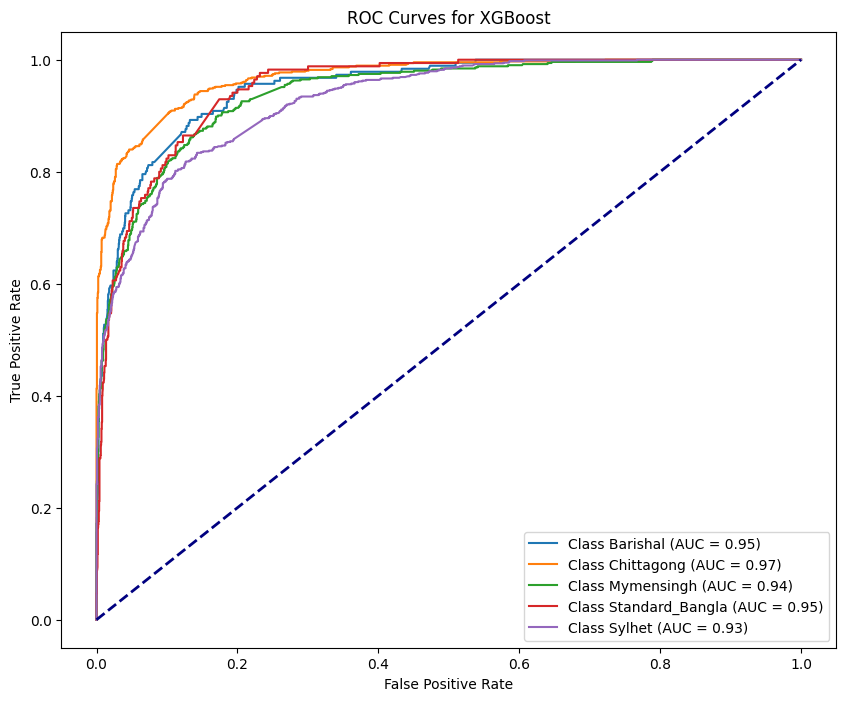

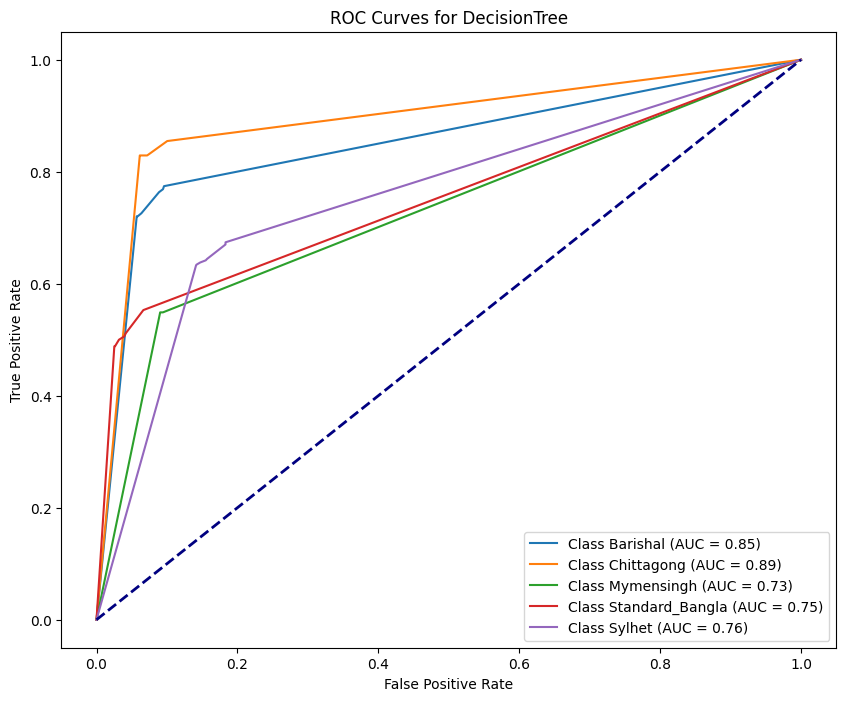

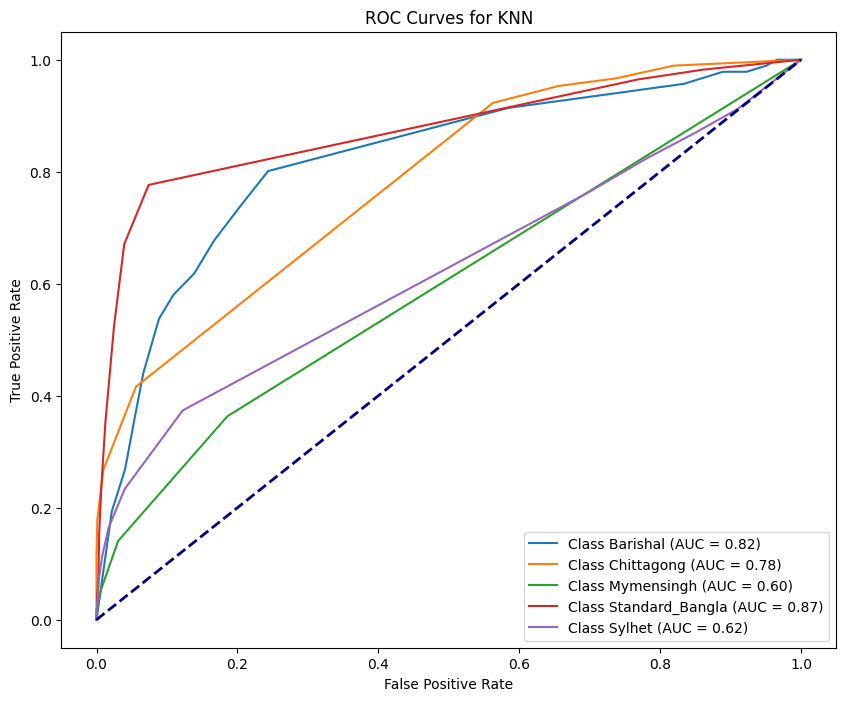

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


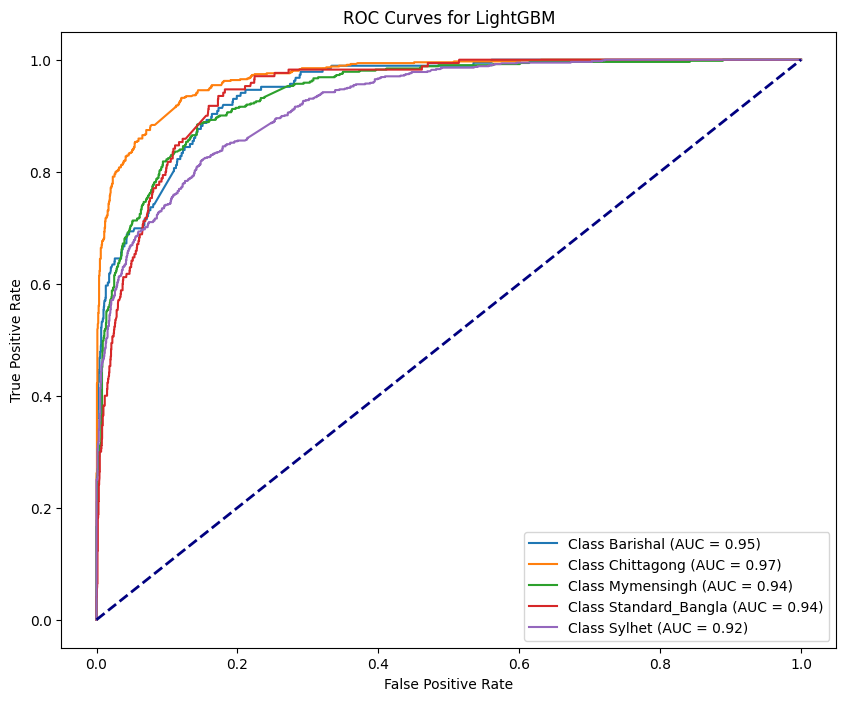

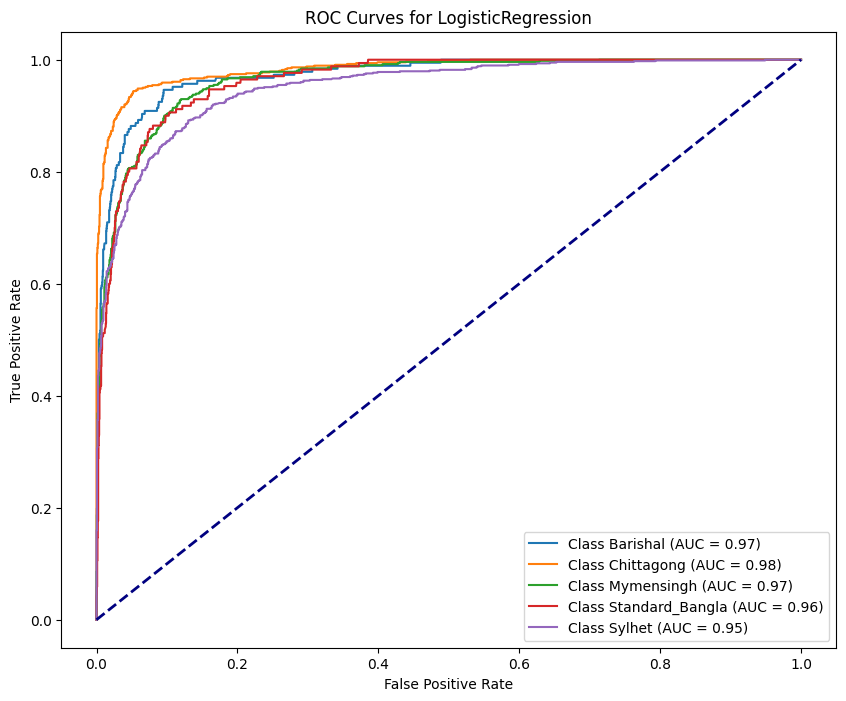

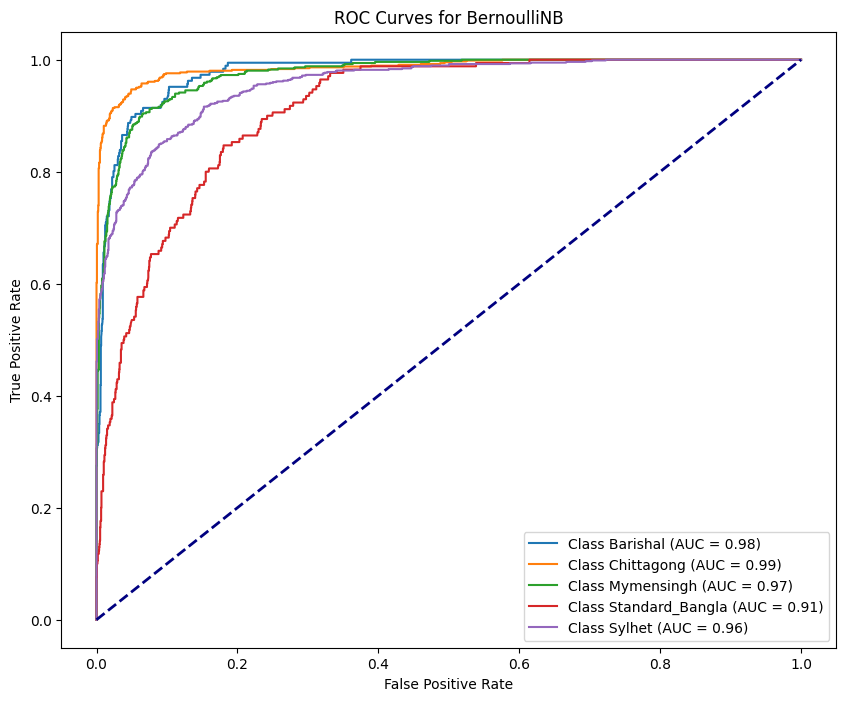

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


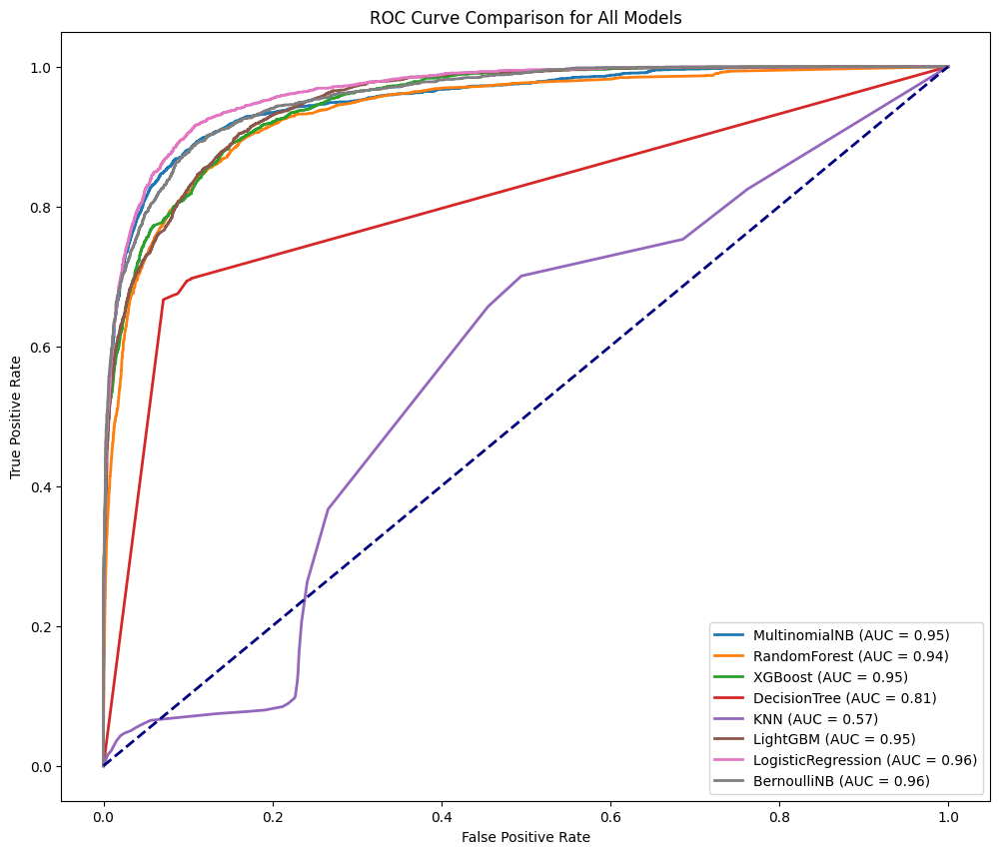

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **RUS**

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)

X_train, y_train = rus.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-478-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-478-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


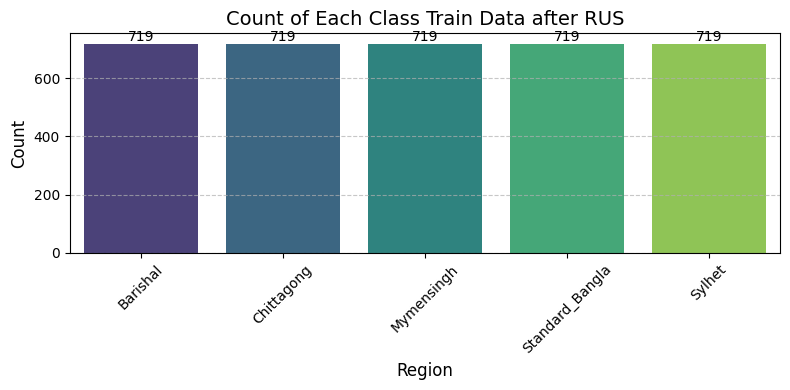

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after RUS")

## Multinomial NB- 78.00%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7800433839479393
Classification Report:
               precision    recall  f1-score   support

           0       0.60      0.82      0.69       186
           1       0.94      0.86      0.90       661
           2       0.77      0.80      0.78       512
           3       0.46      0.82      0.59       170
           4       0.87      0.68      0.77       776

    accuracy                           0.78      2305
   macro avg       0.73      0.80      0.74      2305
weighted avg       0.81      0.78      0.79      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.7800433839479393
Precision: 0.8148
Recall for : 0.7800
F1 Score:  0.7878
AUC Score: 0.9477
Balanced Accuracy: 0.7960
G-mean Score: 0.8614
pf Score: 0.0537
Bal Score :  0.8398935061744046


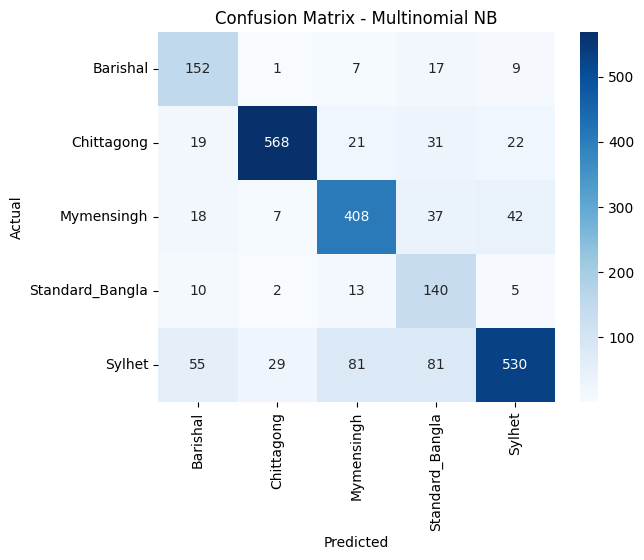

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -69.02%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.690238611713666
Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.83      0.53       186
           1       0.87      0.83      0.85       661
           2       0.71      0.65      0.68       512
           3       0.45      0.82      0.58       170
           4       0.83      0.53      0.65       776

    accuracy                           0.69      2305
   macro avg       0.65      0.73      0.66      2305
weighted avg       0.75      0.69      0.70      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 13.04 seconds
Accuracy: 0.690238611713666
Precision: 0.7519
Recall for : 0.6902
F1 Score:  0.6990
AUC Score: 0.9074
Balanced Accuracy: 0.7343
G-mean Score: 0.8034
pf Score: 0.0749
Bal Score :  0.7746518409236263


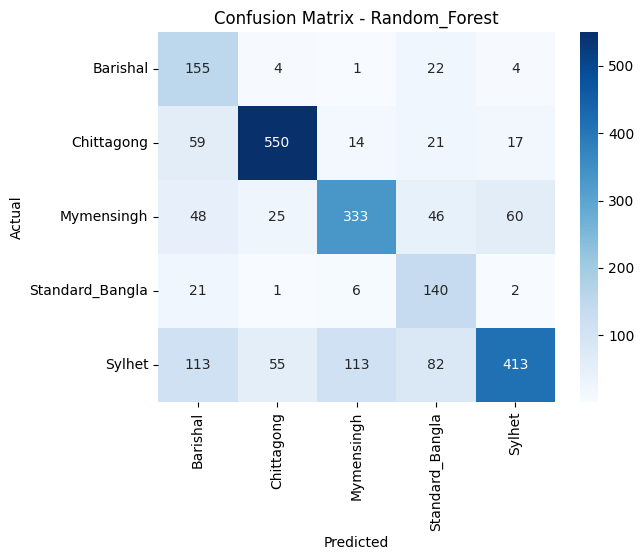

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 68.94%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6893709327548807
Classification Report:
               precision    recall  f1-score   support

           0       0.37      0.79      0.50       186
           1       0.89      0.78      0.83       661
           2       0.70      0.71      0.70       512
           3       0.46      0.74      0.57       170
           4       0.82      0.56      0.67       776

    accuracy                           0.69      2305
   macro avg       0.65      0.72      0.65      2305
weighted avg       0.75      0.69      0.70      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 18.20 seconds
Accuracy: 0.6893709327548807
Precision: 0.7502
Recall for : 0.6894
F1 Score:  0.7020
AUC Score: 0.9158
Balanced Accuracy: 0.7168
G-mean Score: 0.8023
pf Score: 0.0754
Bal Score :  0.7739766704643243


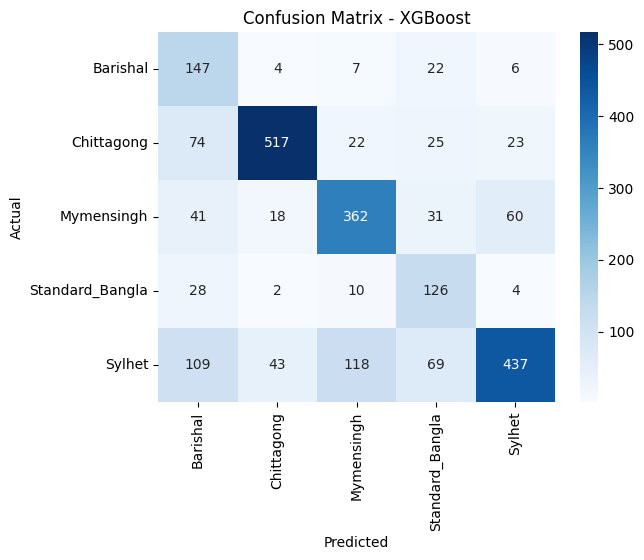

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 59.52%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5952277657266811
Classification Report:
               precision    recall  f1-score   support

           0       0.33      0.77      0.47       186
           1       0.83      0.77      0.80       661
           2       0.54      0.56      0.55       512
           3       0.38      0.61      0.47       170
           4       0.70      0.43      0.53       776

    accuracy                           0.60      2305
   macro avg       0.56      0.63      0.56      2305
weighted avg       0.65      0.60      0.60      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.65 seconds
Accuracy: 0.5952277657266811
Precision: 0.6516
Recall for : 0.5952
F1 Score:  0.6030
AUC Score: 0.7655
Balanced Accuracy: 0.6259
G-mean Score: 0.7340
pf Score: 0.0999
Bal Score :  0.7051888568105491


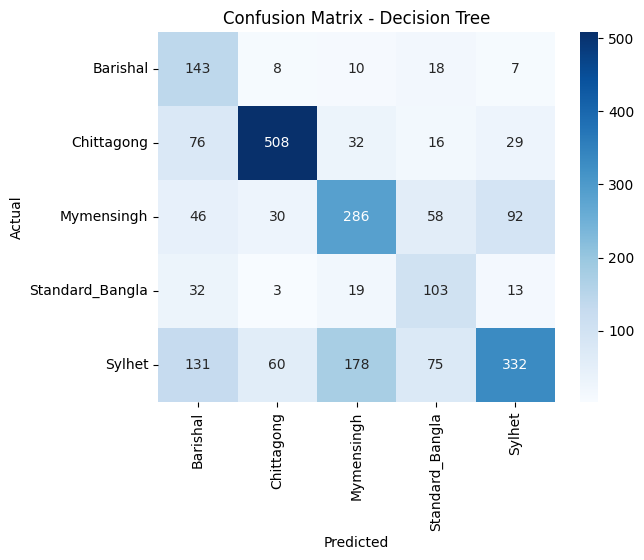

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 50.54%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5054229934924078
Classification Report:
               precision    recall  f1-score   support

           0       0.20      0.81      0.32       186
           1       0.89      0.70      0.78       661
           2       0.81      0.34      0.48       512
           3       0.24      0.71      0.36       170
           4       0.85      0.33      0.48       776

    accuracy                           0.51      2305
   macro avg       0.60      0.58      0.48      2305
weighted avg       0.75      0.51      0.54      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.5054229934924078
Precision: 0.7547
Recall for : 0.5054
F1 Score:  0.5432
AUC Score: 0.8756
Balanced Accuracy: 0.5788
G-mean Score: 0.6887
pf Score: 0.1112
Bal Score :  0.6415458167040258


## LightGBM Model -59.70%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006529 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2891
[LightGBM] [Info] Number of data points in the train set: 3595, number of used features: 156
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.5969631236442516
Classification Report:
               precision    recall  f1-score   support

           0       0.27      0.72      0.39       186
           1       0.85      0.72      0.78       661
           2       0.64      0.60      0.62       512
           3       0.36      0.56      0.44       170
           4       0.73      0.47      0.57       776

    accuracy                           0.60      2305
   macro avg       0.57      0.61      0.56      2305
weighted avg       0.68      0.60      0.62      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 1.99 seconds
Accuracy: 0.5969631236442516
Precision: 0.6780
Recall for : 0.5970
F1 Score:  0.6163
AUC Score: 0.8786
Balanced Accuracy: 0.6145
G-mean Score: 0.7386
pf Score: 0.0978
Bal Score :  0.7067333145192047


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

1.9867
0.5970
0.6780
0.5970
0.6163
0.8786
0.6145
0.7386
0.0978
0.7067


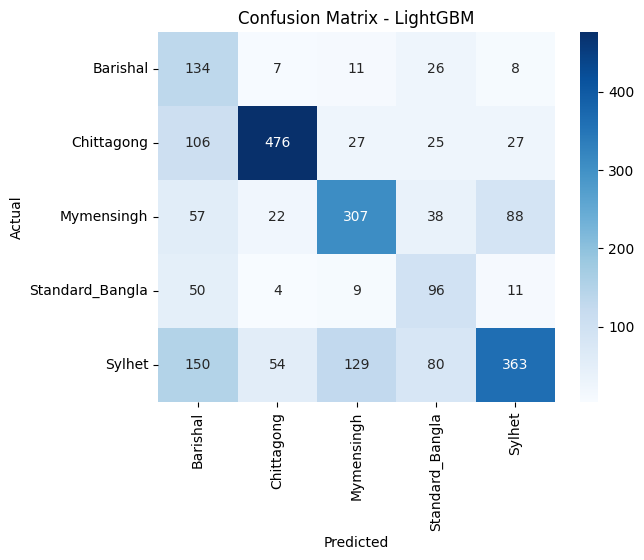

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 77.96%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7796095444685467
Classification Report:
               precision    recall  f1-score   support

           0       0.57      0.80      0.67       186
           1       0.89      0.89      0.89       661
           2       0.80      0.76      0.78       512
           3       0.51      0.79      0.62       170
           4       0.85      0.70      0.77       776

    accuracy                           0.78      2305
   macro avg       0.72      0.79      0.74      2305
weighted avg       0.80      0.78      0.78      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.14 seconds
Accuracy: 0.7796095444685467
Precision: 0.8020
Recall for : 0.7796
F1 Score:  0.7844
AUC Score: 0.9452
Balanced Accuracy: 0.7857
G-mean Score: 0.8585
pf Score: 0.0550
Bal Score :  0.8393799465795498


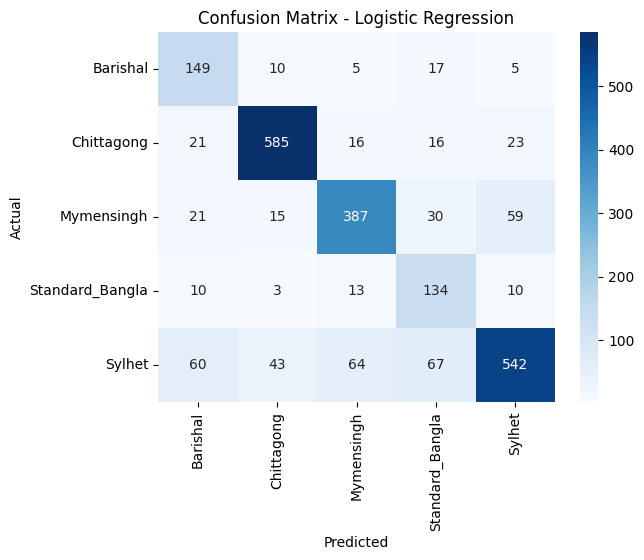

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 72.10%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7210412147505423
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.85      0.61       186
           1       0.94      0.83      0.88       661
           2       0.88      0.65      0.75       512
           3       0.31      0.89      0.46       170
           4       0.90      0.61      0.72       776

    accuracy                           0.72      2305
   macro avg       0.70      0.77      0.69      2305
weighted avg       0.83      0.72      0.75      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.7210412147505423
Precision: 0.8285
Recall for : 0.7210
F1 Score:  0.7457
AUC Score: 0.9507
Balanced Accuracy: 0.7669
G-mean Score: 0.8313
pf Score: 0.0641
Bal Score :  0.7976015103787604


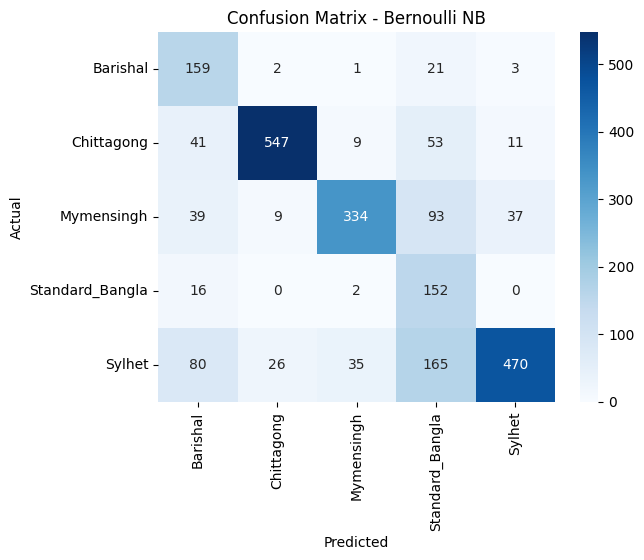

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

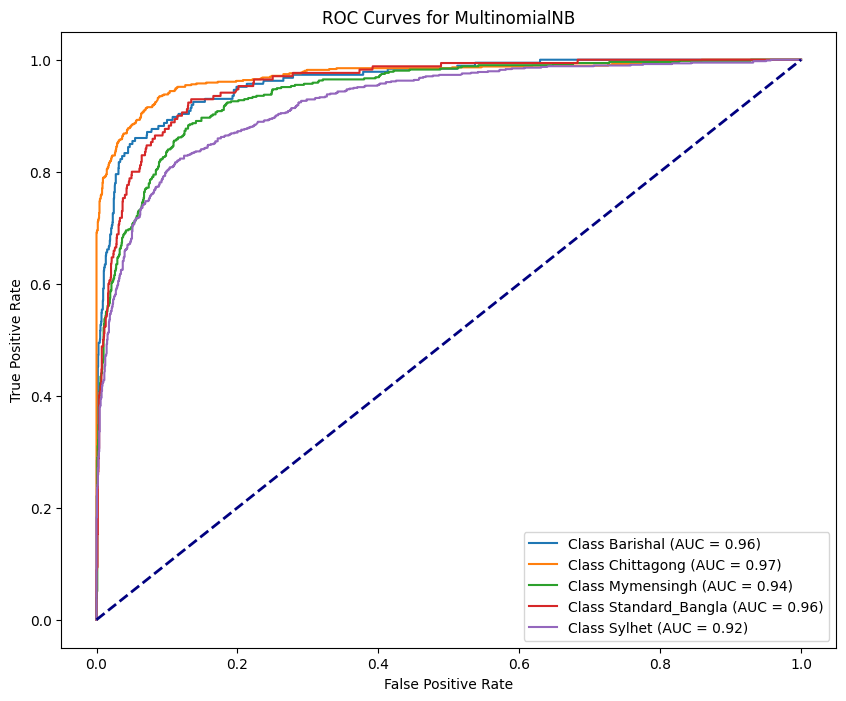

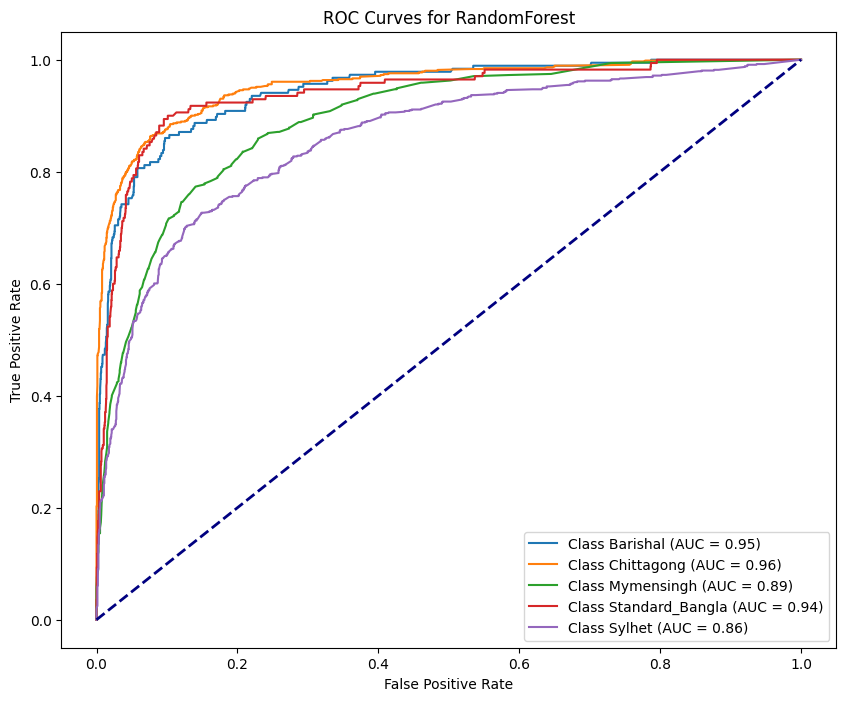

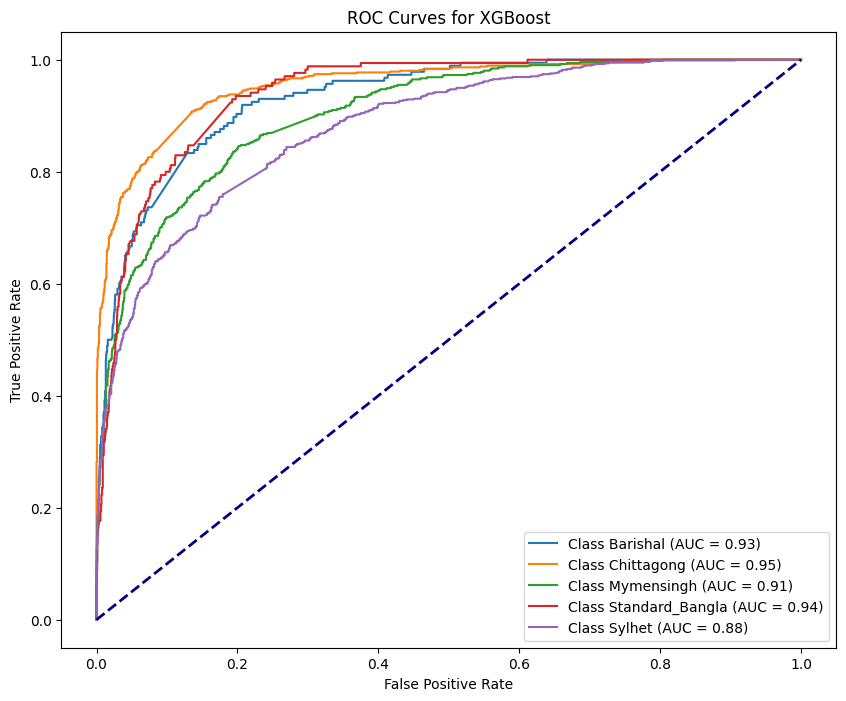

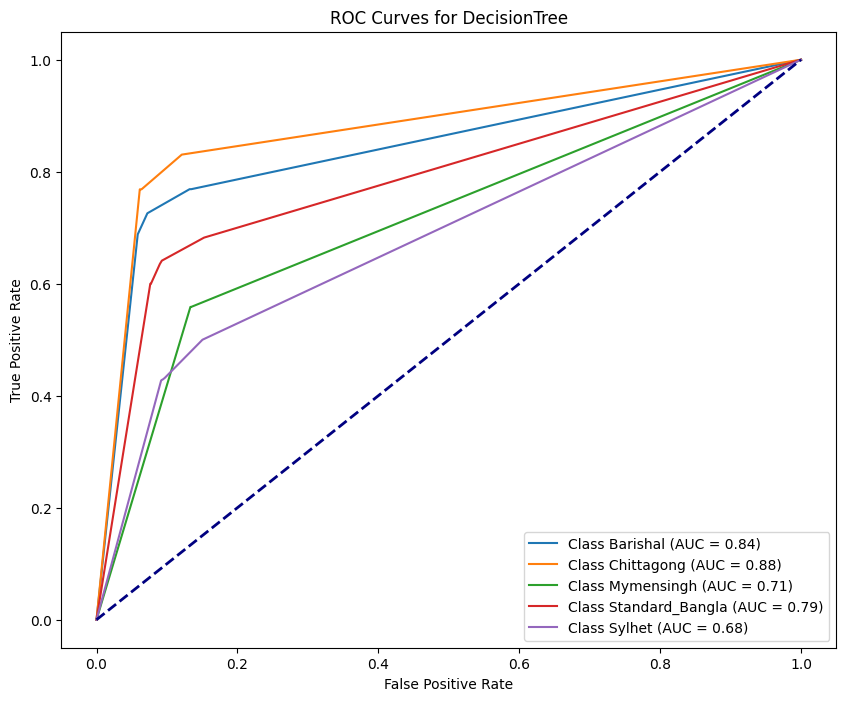

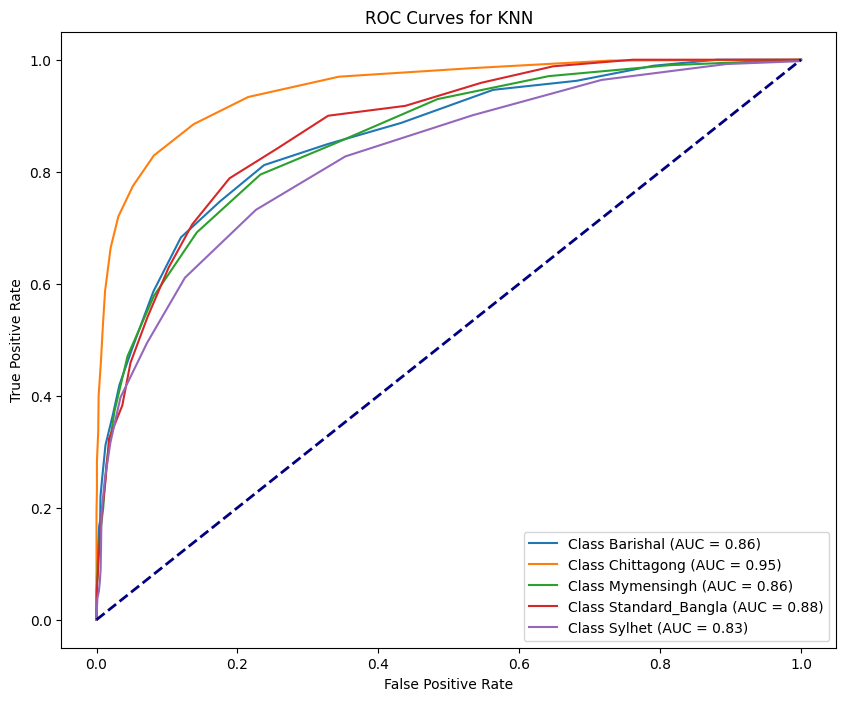

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


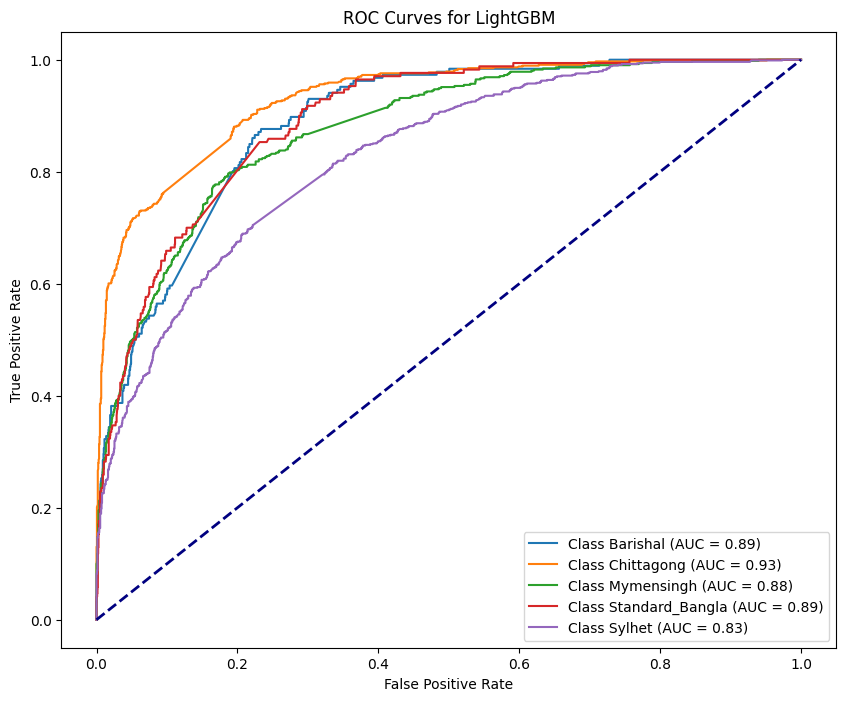

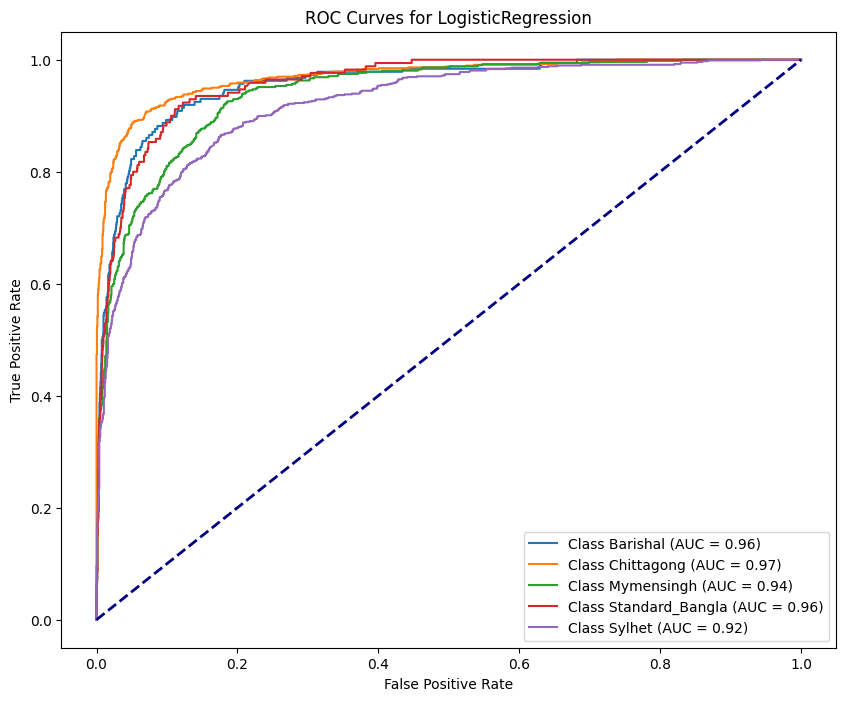

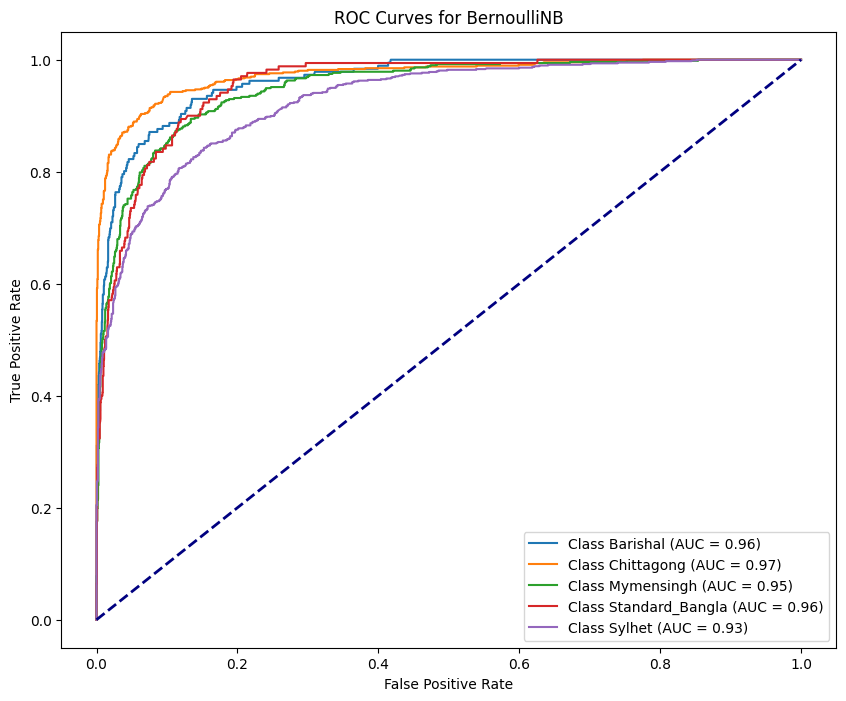

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


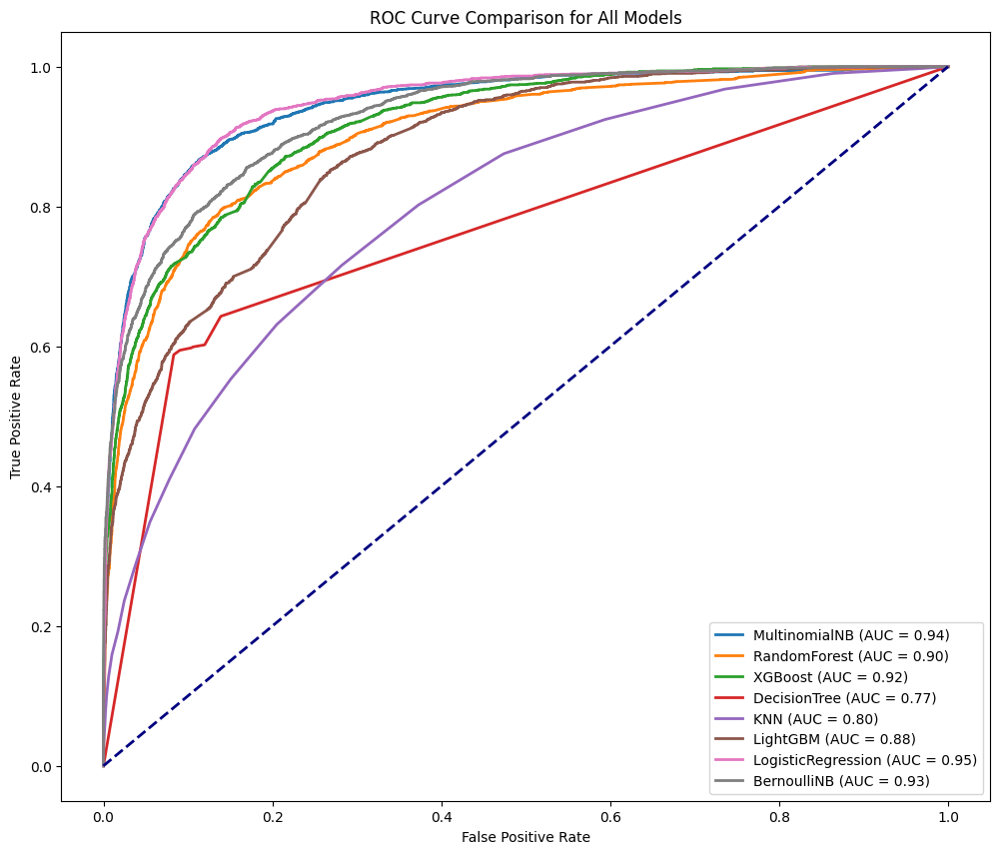

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **TomekLinks**

In [ ]:
from imblearn.under_sampling import TomekLinks

tl = TomekLinks(sampling_strategy='majority')
X_train, y_train = tl.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-526-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-526-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


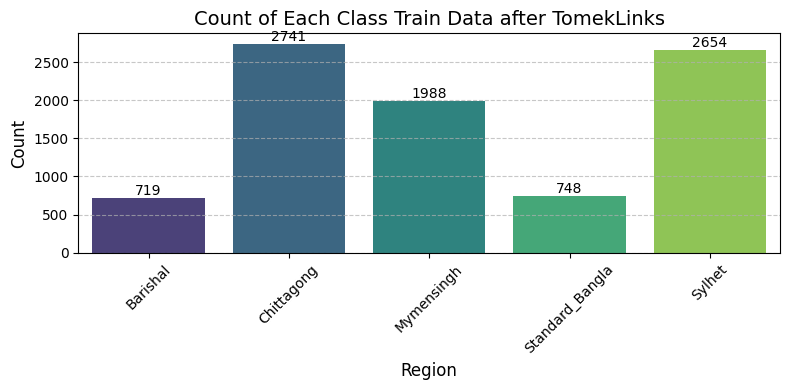

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after TomekLinks")

## Multinomial NB- 80.91%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8091106290672451
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.33      0.49       186
           1       0.89      0.94      0.91       661
           2       0.79      0.84      0.81       512
           3       0.87      0.31      0.46       170
           4       0.75      0.90      0.82       776

    accuracy                           0.81      2305
   macro avg       0.86      0.66      0.70      2305
weighted avg       0.83      0.81      0.79      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8091106290672451
Precision: 0.8255
Recall for : 0.8091
F1 Score:  0.7911
AUC Score: 0.9667
Balanced Accuracy: 0.6642
G-mean Score: 0.8625
pf Score: 0.0543
Bal Score :  0.8596697666517679


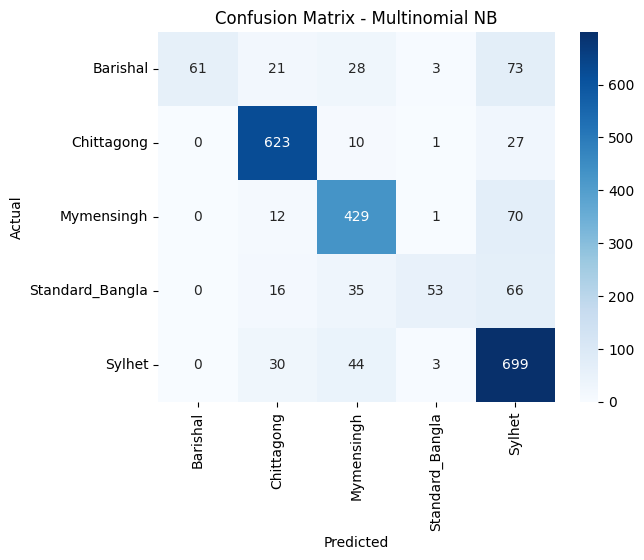

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -78.31%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7830802603036876
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.73      0.74       186
           1       0.84      0.91      0.87       661
           2       0.77      0.71      0.74       512
           3       0.67      0.66      0.67       170
           4       0.77      0.76      0.77       776

    accuracy                           0.78      2305
   macro avg       0.76      0.75      0.76      2305
weighted avg       0.78      0.78      0.78      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 36.53 seconds
Accuracy: 0.7830802603036876
Precision: 0.7812
Recall for : 0.7831
F1 Score:  0.7814
AUC Score: 0.9365
Balanced Accuracy: 0.7548
G-mean Score: 0.8506
pf Score: 0.0586
Bal Score :  0.8411206246170475


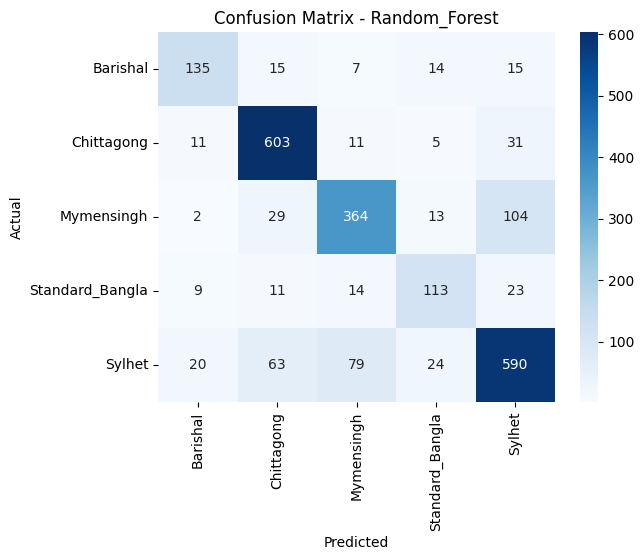

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 77.05%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7704989154013016
Classification Report:
               precision    recall  f1-score   support

           0       0.78      0.56      0.65       186
           1       0.75      0.93      0.83       661
           2       0.78      0.76      0.77       512
           3       0.67      0.51      0.58       170
           4       0.81      0.75      0.78       776

    accuracy                           0.77      2305
   macro avg       0.76      0.70      0.72      2305
weighted avg       0.77      0.77      0.77      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 36.56 seconds
Accuracy: 0.7704989154013016
Precision: 0.7716
Recall for : 0.7705
F1 Score:  0.7655
AUC Score: 0.9460
Balanced Accuracy: 0.7017
G-mean Score: 0.8405
pf Score: 0.0625
Bal Score :  0.8318044793632806


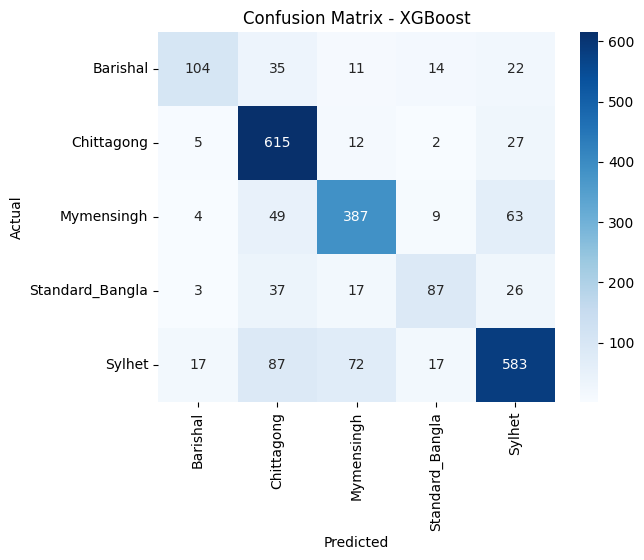

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 68.11%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6811279826464208
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.59      0.56       186
           1       0.79      0.87      0.82       661
           2       0.61      0.63      0.62       512
           3       0.52      0.51      0.52       170
           4       0.70      0.62      0.66       776

    accuracy                           0.68      2305
   macro avg       0.63      0.64      0.64      2305
weighted avg       0.68      0.68      0.68      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.86 seconds
Accuracy: 0.6811279826464208
Precision: 0.6803
Recall for : 0.6811
F1 Score:  0.6791
AUC Score: 0.7990
Balanced Accuracy: 0.6423
G-mean Score: 0.7815
pf Score: 0.0844
Bal Score :  0.7667545587373359


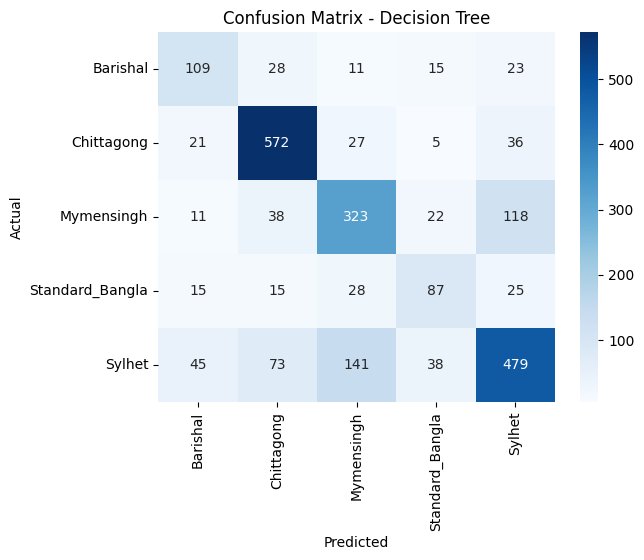

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 69.41%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6941431670281996
Classification Report:
               precision    recall  f1-score   support

           0       0.48      0.53      0.50       186
           1       0.73      0.92      0.81       661
           2       0.90      0.36      0.52       512
           3       0.56      0.51      0.53       170
           4       0.68      0.80      0.74       776

    accuracy                           0.69      2305
   macro avg       0.67      0.62      0.62      2305
weighted avg       0.72      0.69      0.68      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.6941431670281996
Precision: 0.7208
Recall for : 0.6941
F1 Score:  0.6769
AUC Score: 0.9212
Balanced Accuracy: 0.6241
G-mean Score: 0.7856
pf Score: 0.0833
Bal Score :  0.7758410089133769


## LightGBM Model -74.01%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.085865 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10147
[LightGBM] [Info] Number of data points in the train set: 8850, number of used features: 419
[LightGBM] [Info] Start training from score -2.510311
[LightGBM] [Info] Start training from score -1.172095
[LightGBM] [Info] Start training from score -1.493288
[LightGBM] [Info] Start training from score -2.470770
[LightGBM] [Info] Start training from score -1.204350


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7401301518438178
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.45      0.52       186
           1       0.75      0.89      0.81       661
           2       0.77      0.75      0.76       512
           3       0.51      0.49      0.50       170
           4       0.79      0.74      0.76       776

    accuracy                           0.74      2305
   macro avg       0.69      0.66      0.67      2305
weighted avg       0.74      0.74      0.74      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 5.60 seconds
Accuracy: 0.7401301518438178
Precision: 0.7378
Recall for : 0.7401
F1 Score:  0.7360
AUC Score: 0.9387
Balanced Accuracy: 0.6625
G-mean Score: 0.8218
pf Score: 0.0695
Bal Score :  0.8097926269830558


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

5.5984
0.7401
0.7378
0.7401
0.7360
0.9387
0.6625
0.8218
0.0695
0.8098


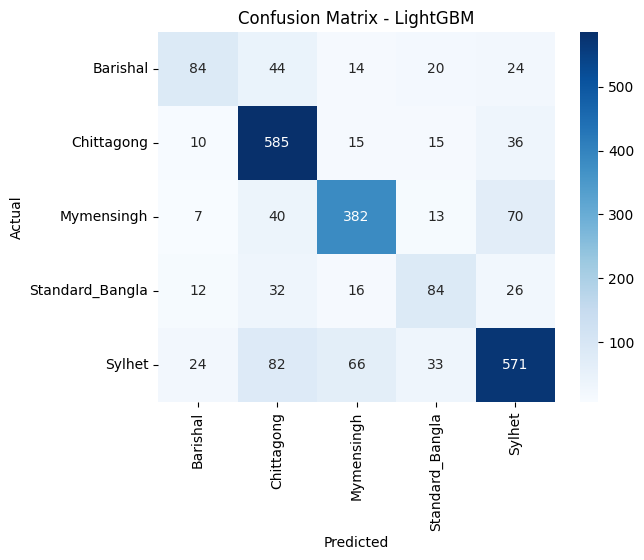

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 83.95%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8394793926247288
Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.64      0.72       186
           1       0.87      0.94      0.90       661
           2       0.83      0.83      0.83       512
           3       0.74      0.61      0.67       170
           4       0.84      0.86      0.85       776

    accuracy                           0.84      2305
   macro avg       0.82      0.78      0.79      2305
weighted avg       0.84      0.84      0.84      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 2.30 seconds
Accuracy: 0.8394793926247288
Precision: 0.8372
Recall for : 0.8395
F1 Score:  0.8365
AUC Score: 0.9675
Balanced Accuracy: 0.7758
G-mean Score: 0.8897
pf Score: 0.0435
Bal Score :  0.8823951658665072


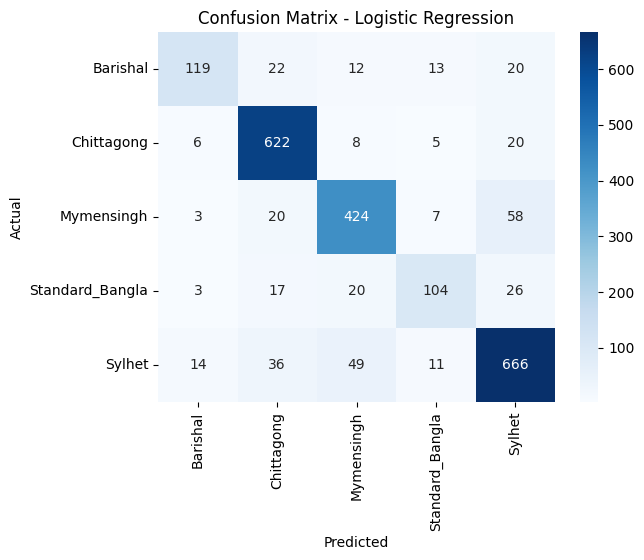

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 81.34%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8134490238611713
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.33      0.49       186
           1       0.88      0.95      0.91       661
           2       0.84      0.83      0.83       512
           3       0.80      0.32      0.46       170
           4       0.74      0.91      0.82       776

    accuracy                           0.81      2305
   macro avg       0.84      0.67      0.70      2305
weighted avg       0.82      0.81      0.80      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8134490238611713
Precision: 0.8248
Recall for : 0.8134
F1 Score:  0.7958
AUC Score: 0.9675
Balanced Accuracy: 0.6685
G-mean Score: 0.8653
pf Score: 0.0532
Bal Score :  0.8628218231881746


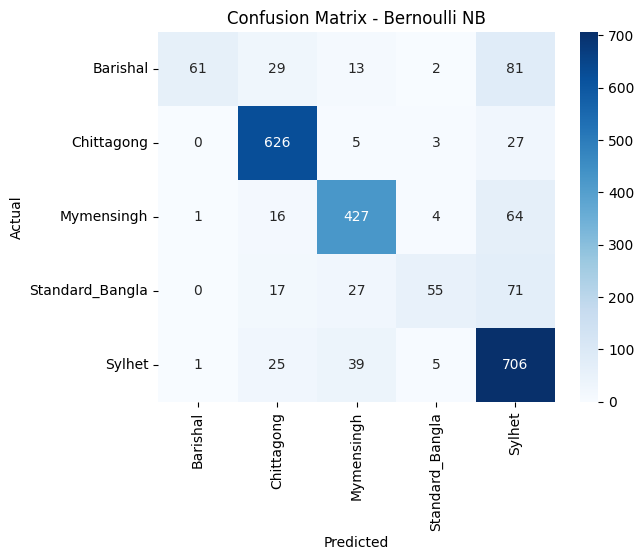

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

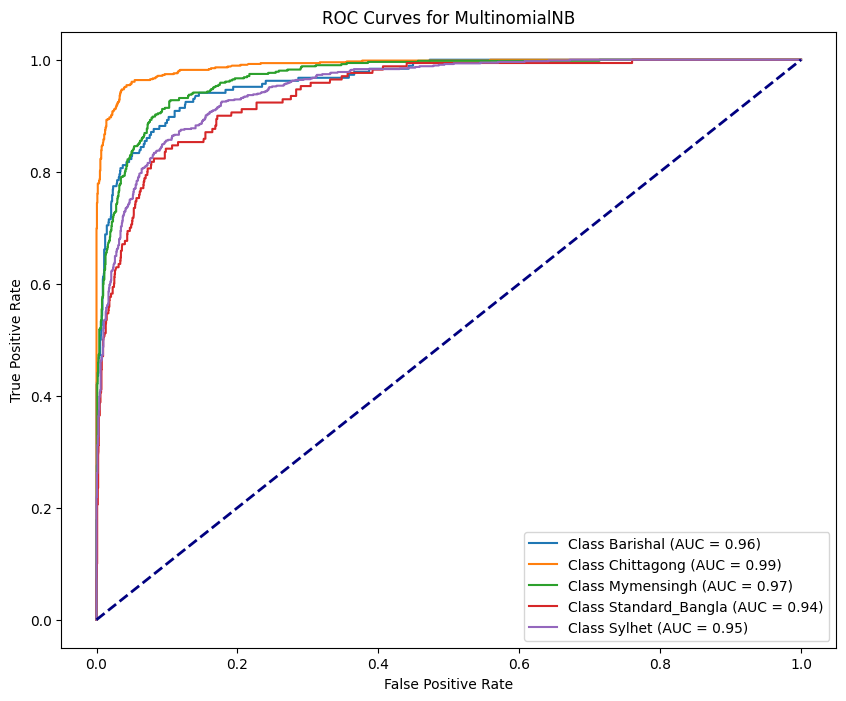

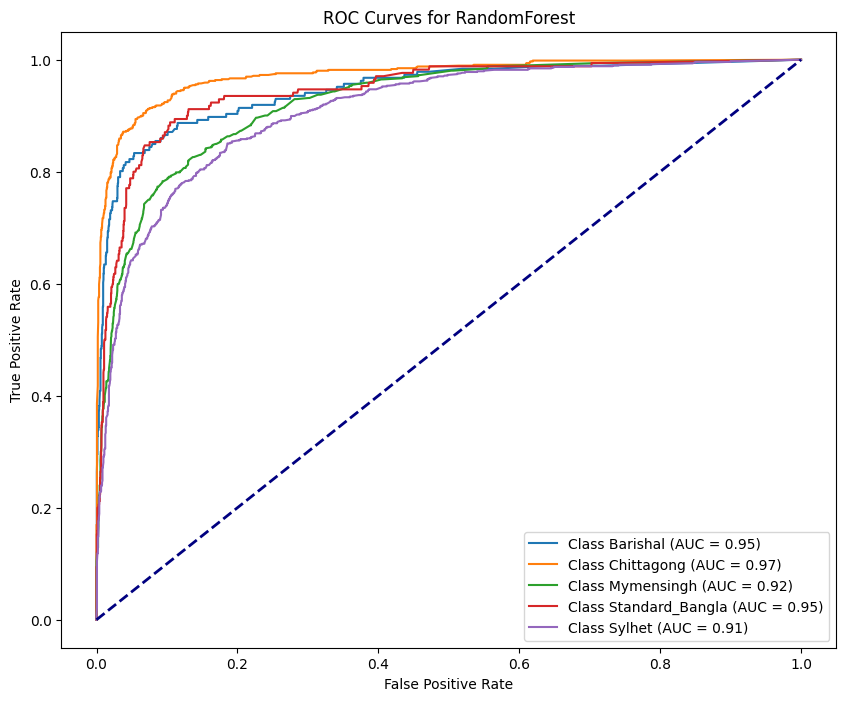

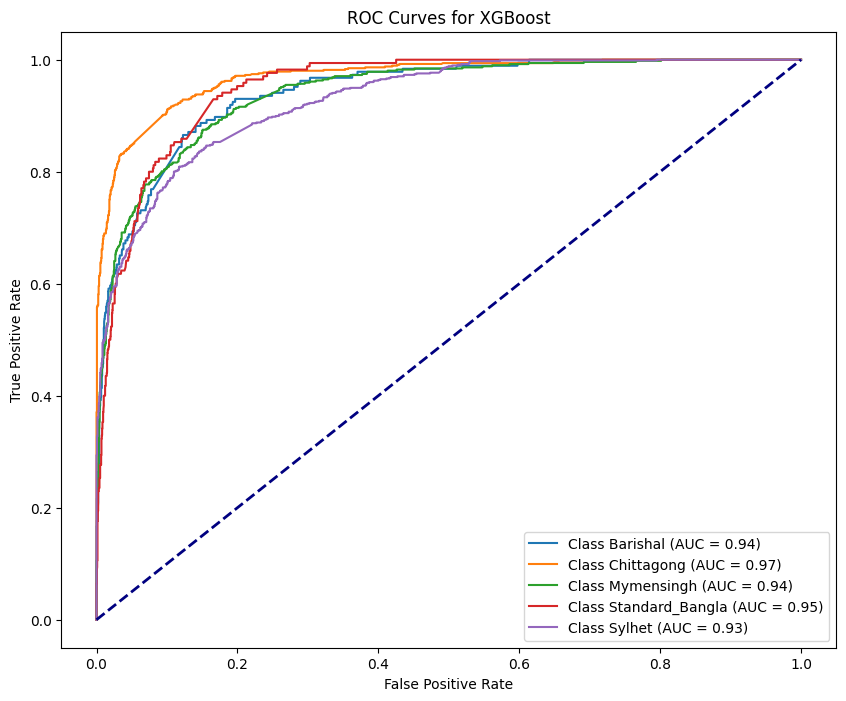

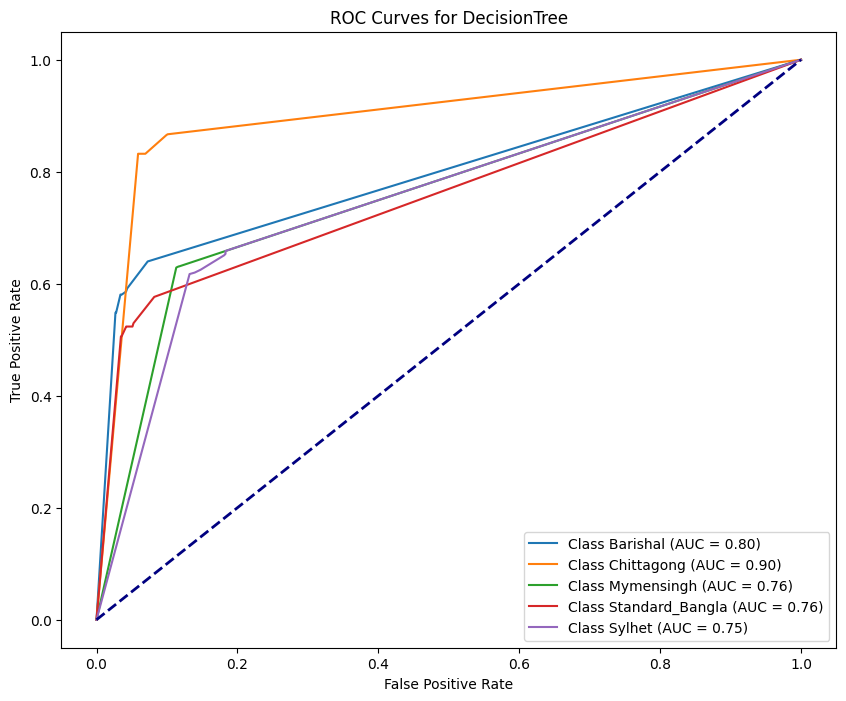

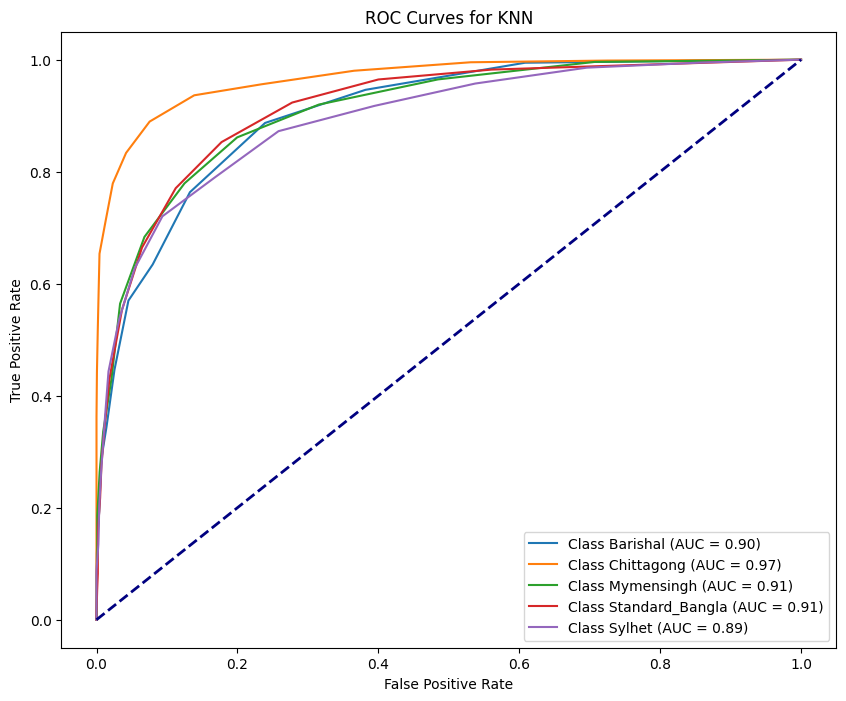

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


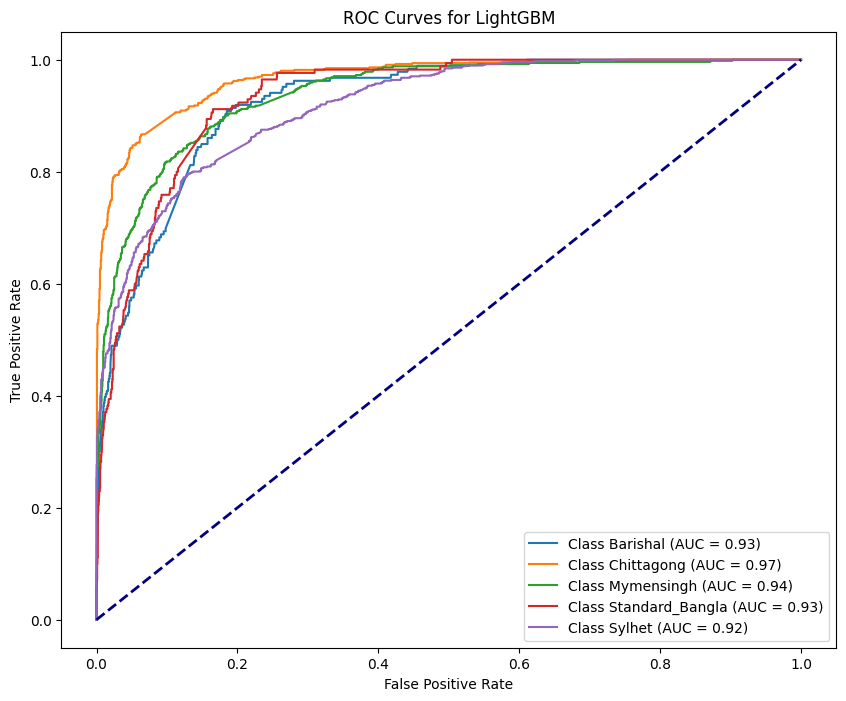

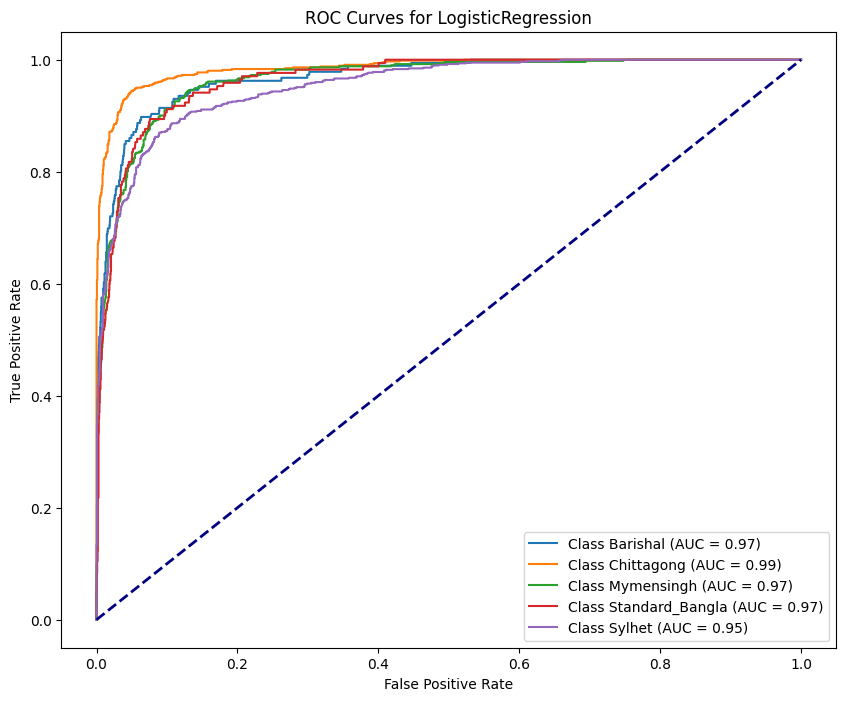

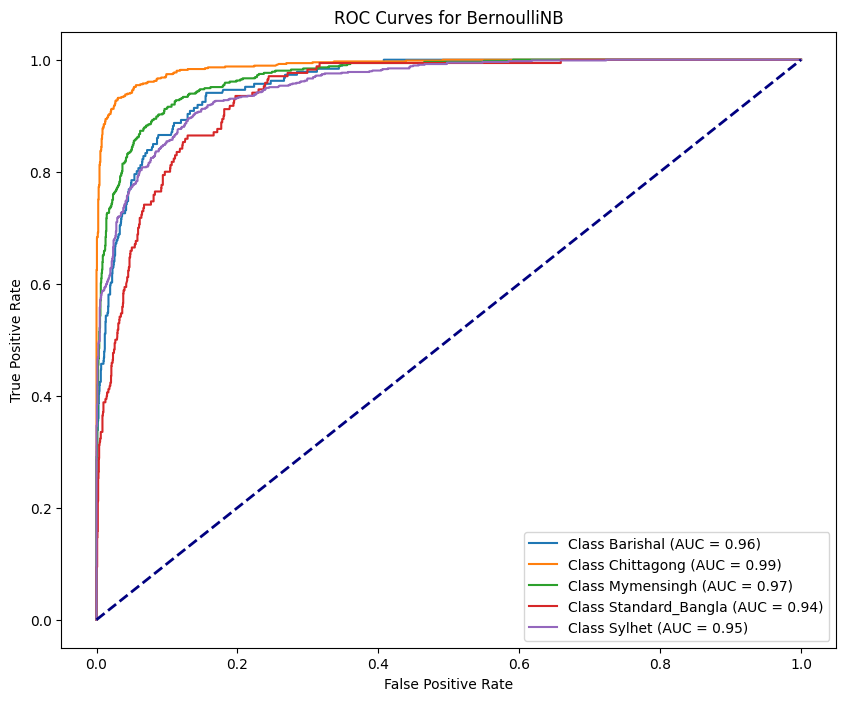

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


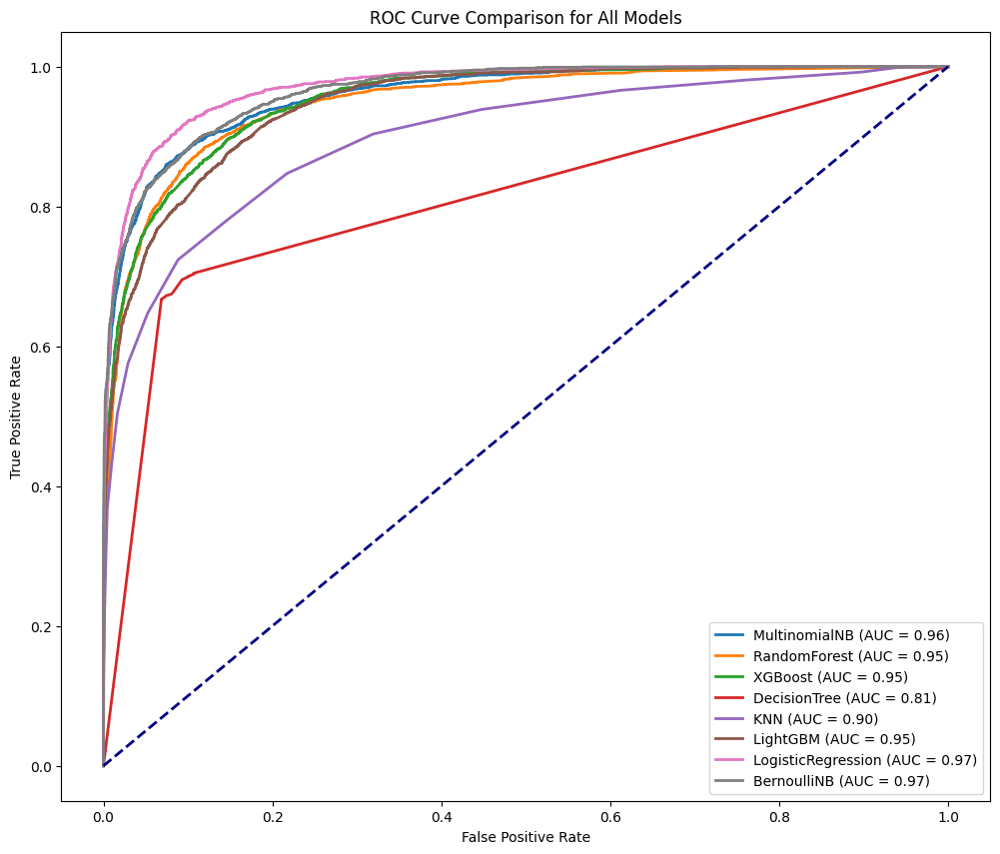

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **NearMiss**

In [ ]:
from imblearn.under_sampling import NearMiss

In [ ]:
nm = NearMiss()
X_train, y_train = nm.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-577-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-577-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


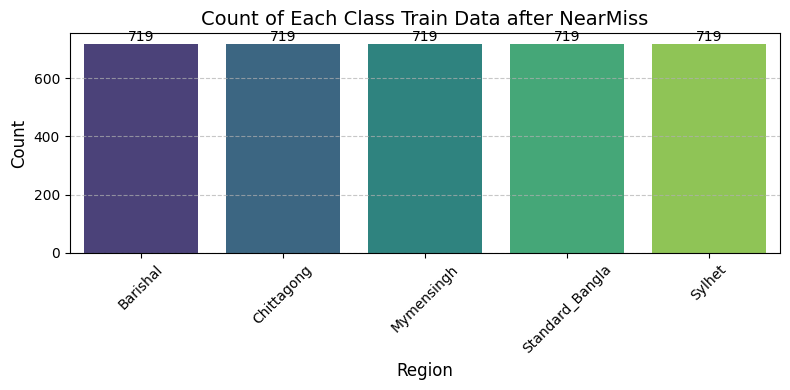

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after NearMiss")

## Multinomial NB- 78.22%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7822125813449023
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.80      0.72       186
           1       0.92      0.85      0.89       661
           2       0.76      0.80      0.78       512
           3       0.46      0.82      0.59       170
           4       0.86      0.70      0.77       776

    accuracy                           0.78      2305
   macro avg       0.73      0.79      0.75      2305
weighted avg       0.81      0.78      0.79      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.7822125813449023
Precision: 0.8106
Recall for : 0.7822
F1 Score:  0.7890
AUC Score: 0.9450
Balanced Accuracy: 0.7929
G-mean Score: 0.8611
pf Score: 0.0540
Bal Score :  0.8413460728558049


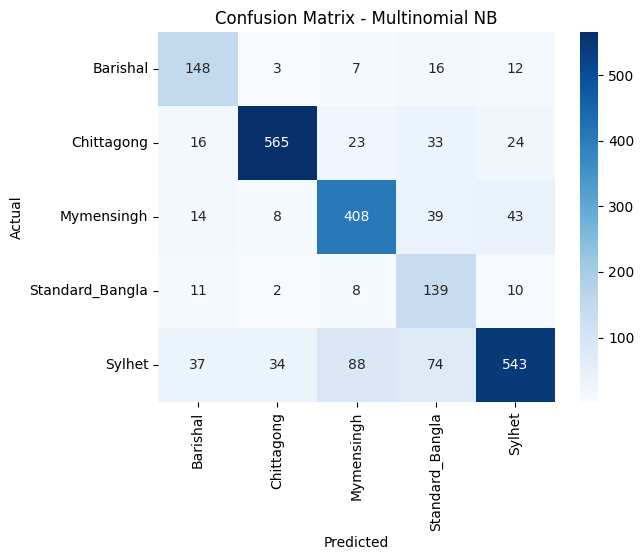

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -69.11%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6911062906724512
Classification Report:
               precision    recall  f1-score   support

           0       0.49      0.78      0.60       186
           1       0.81      0.86      0.83       661
           2       0.70      0.65      0.67       512
           3       0.45      0.79      0.58       170
           4       0.78      0.53      0.63       776

    accuracy                           0.69      2305
   macro avg       0.65      0.72      0.66      2305
weighted avg       0.72      0.69      0.69      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 18.93 seconds
Accuracy: 0.6911062906724512
Precision: 0.7210
Recall for : 0.6911
F1 Score:  0.6918
AUC Score: 0.9084
Balanced Accuracy: 0.7229
G-mean Score: 0.7979
pf Score: 0.0776
Bal Score :  0.7747987559302967


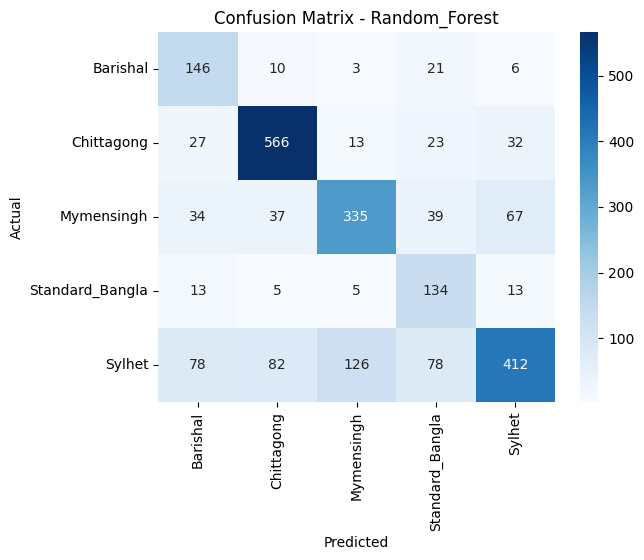

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 67.77%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6776572668112798
Classification Report:
               precision    recall  f1-score   support

           0       0.35      0.78      0.48       186
           1       0.87      0.78      0.82       661
           2       0.67      0.71      0.69       512
           3       0.48      0.65      0.56       170
           4       0.81      0.55      0.65       776

    accuracy                           0.68      2305
   macro avg       0.64      0.69      0.64      2305
weighted avg       0.74      0.68      0.69      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 21.60 seconds
Accuracy: 0.6776572668112798
Precision: 0.7363
Recall for : 0.6777
F1 Score:  0.6896
AUC Score: 0.9167
Balanced Accuracy: 0.6949
G-mean Score: 0.7933
pf Score: 0.0788
Bal Score :  0.7653650345354512


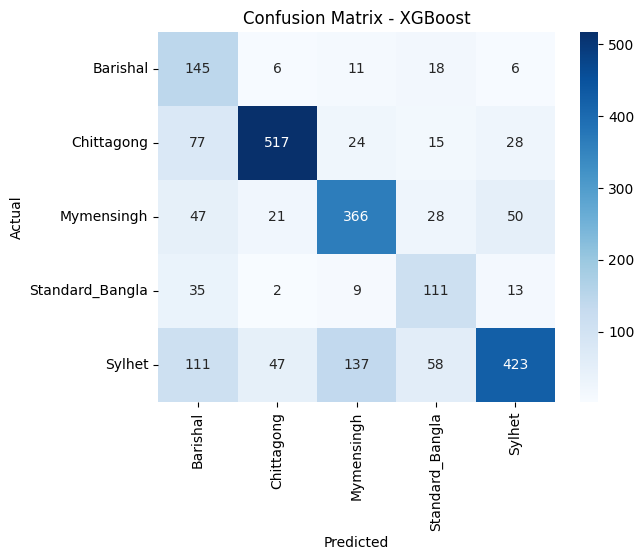

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 60.04%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6004338394793927
Classification Report:
               precision    recall  f1-score   support

           0       0.47      0.69      0.56       186
           1       0.72      0.85      0.78       661
           2       0.54      0.56      0.55       512
           3       0.38      0.62      0.47       170
           4       0.68      0.39      0.49       776

    accuracy                           0.60      2305
   macro avg       0.56      0.62      0.57      2305
weighted avg       0.62      0.60      0.59      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.70 seconds
Accuracy: 0.6004338394793927
Precision: 0.6219
Recall for : 0.6004
F1 Score:  0.5923
AUC Score: 0.7620
Balanced Accuracy: 0.6228
G-mean Score: 0.7308
pf Score: 0.1020
Bal Score :  0.708399985786035


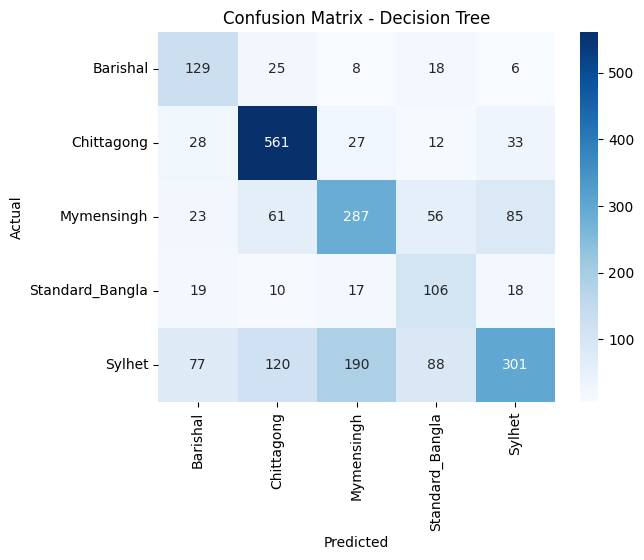

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 57.40%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5739696312364425
Classification Report:
               precision    recall  f1-score   support

           0       0.29      0.66      0.40       186
           1       0.74      0.78      0.76       661
           2       0.67      0.24      0.35       512
           3       0.33      0.59      0.43       170
           4       0.66      0.60      0.63       776

    accuracy                           0.57      2305
   macro avg       0.54      0.57      0.51      2305
weighted avg       0.63      0.57      0.57      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.5739696312364425
Precision: 0.6297
Recall for : 0.5740
F1 Score:  0.5699
AUC Score: 0.8577
Balanced Accuracy: 0.5717
G-mean Score: 0.7142
pf Score: 0.1075
Bal Score :  0.6893139760131548


## LightGBM Model -58.70%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006502 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2933
[LightGBM] [Info] Number of data points in the train set: 3595, number of used features: 161
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.5869848156182212
Classification Report:
               precision    recall  f1-score   support

           0       0.26      0.72      0.39       186
           1       0.80      0.70      0.74       661
           2       0.62      0.64      0.63       512
           3       0.40      0.56      0.47       170
           4       0.74      0.43      0.54       776

    accuracy                           0.59      2305
   macro avg       0.56      0.61      0.55      2305
weighted avg       0.67      0.59      0.60      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 1.49 seconds
Accuracy: 0.5869848156182212
Precision: 0.6668
Recall for : 0.5870
F1 Score:  0.6026
AUC Score: 0.8721
Balanced Accuracy: 0.6100
G-mean Score: 0.7308
pf Score: 0.1006
Bal Score :  0.6994080071427847


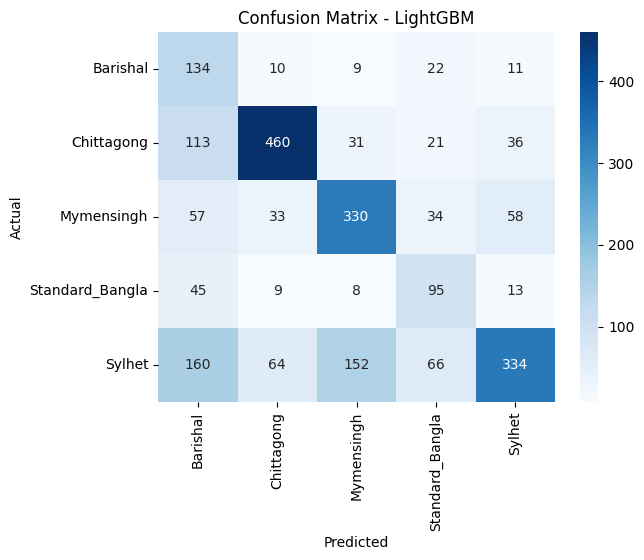

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 76.27%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7626898047722342
Classification Report:
               precision    recall  f1-score   support

           0       0.56      0.80      0.66       186
           1       0.85      0.88      0.87       661
           2       0.78      0.76      0.77       512
           3       0.51      0.79      0.62       170
           4       0.85      0.65      0.73       776

    accuracy                           0.76      2305
   macro avg       0.71      0.78      0.73      2305
weighted avg       0.79      0.76      0.77      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.11 seconds
Accuracy: 0.7626898047722342
Precision: 0.7856
Recall for : 0.7627
F1 Score:  0.7656
AUC Score: 0.9418
Balanced Accuracy: 0.7753
G-mean Score: 0.8467
pf Score: 0.0595
Bal Score :  0.8270038398146584


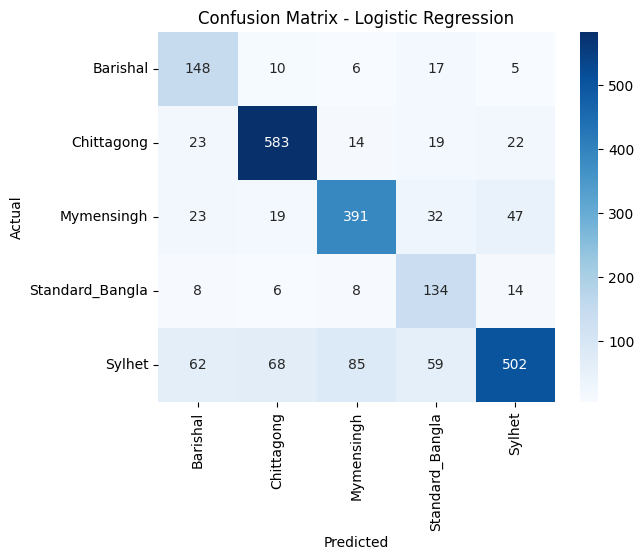

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 73.32%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.7331887201735358
Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.85      0.66       186
           1       0.94      0.83      0.88       661
           2       0.87      0.65      0.74       512
           3       0.32      0.89      0.47       170
           4       0.86      0.64      0.74       776

    accuracy                           0.73      2305
   macro avg       0.71      0.77      0.70      2305
weighted avg       0.82      0.73      0.75      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.7331887201735358
Precision: 0.8212
Recall for : 0.7332
F1 Score:  0.7545
AUC Score: 0.9501
Balanced Accuracy: 0.7732
G-mean Score: 0.8365
pf Score: 0.0625
Bal Score :  0.8062297363623036


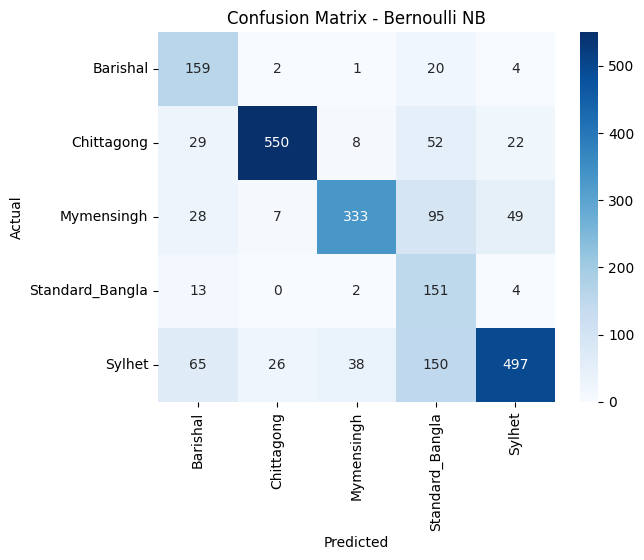

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

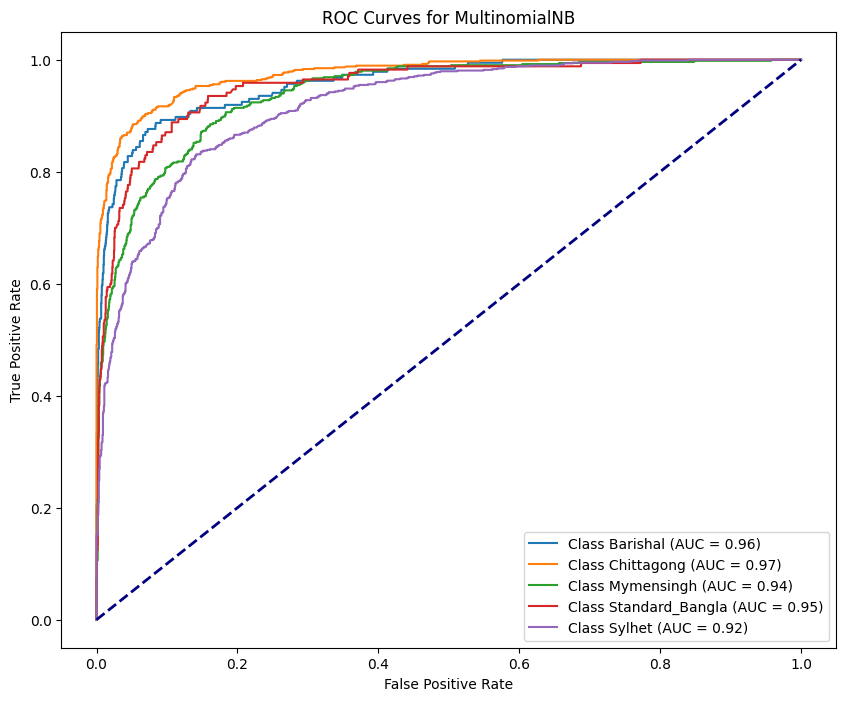

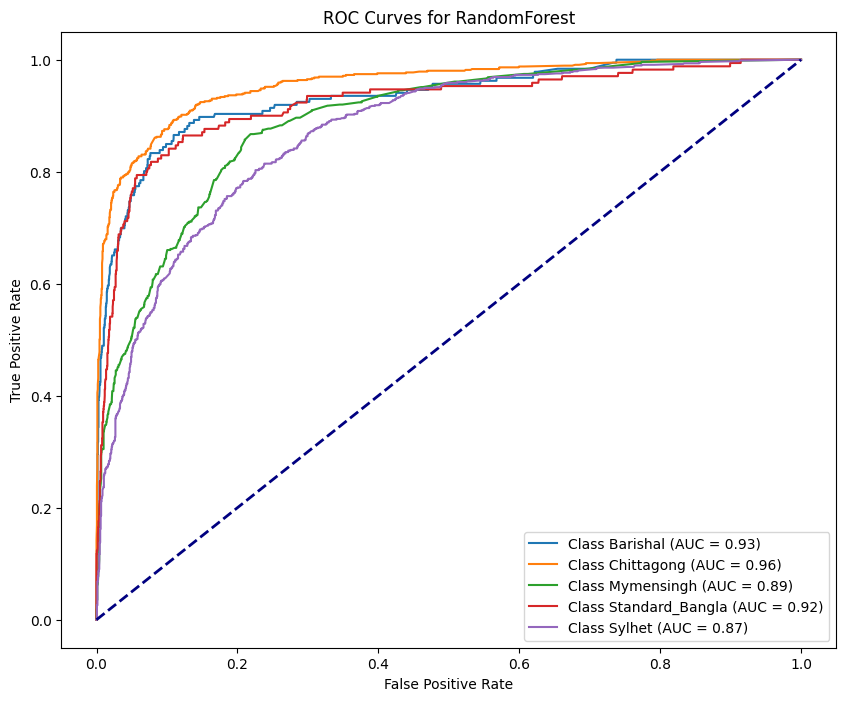

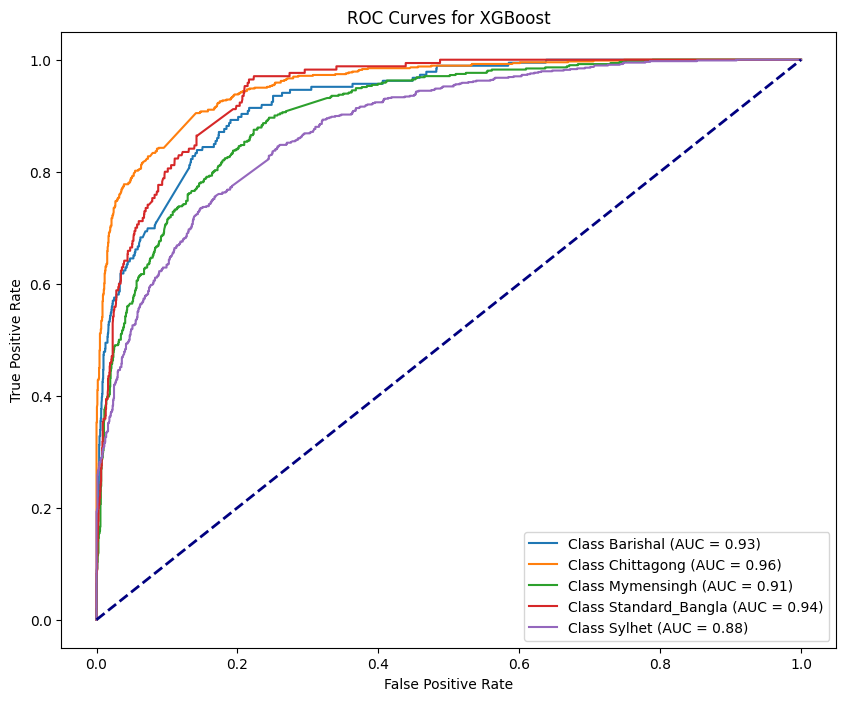

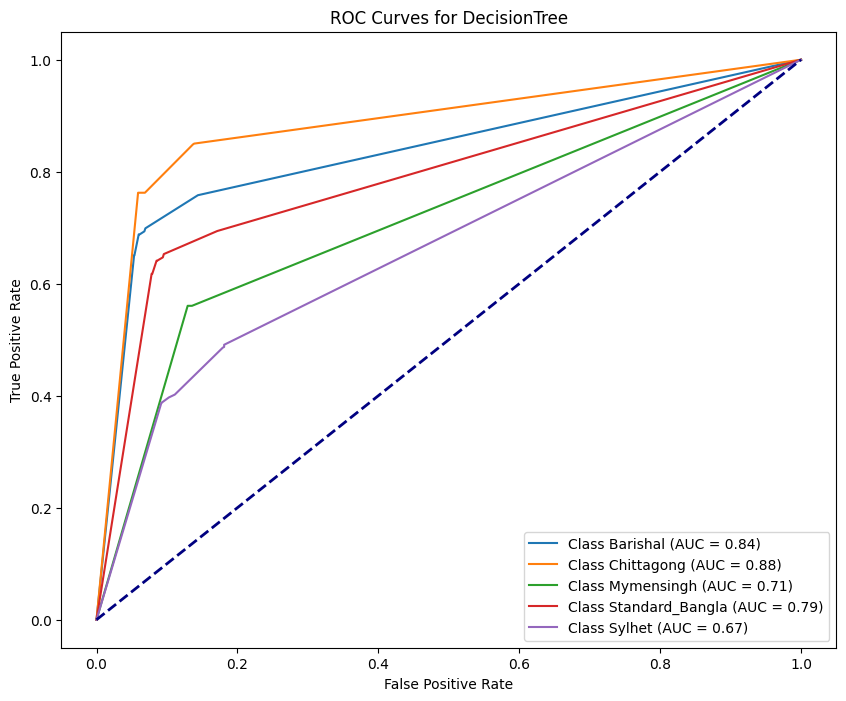

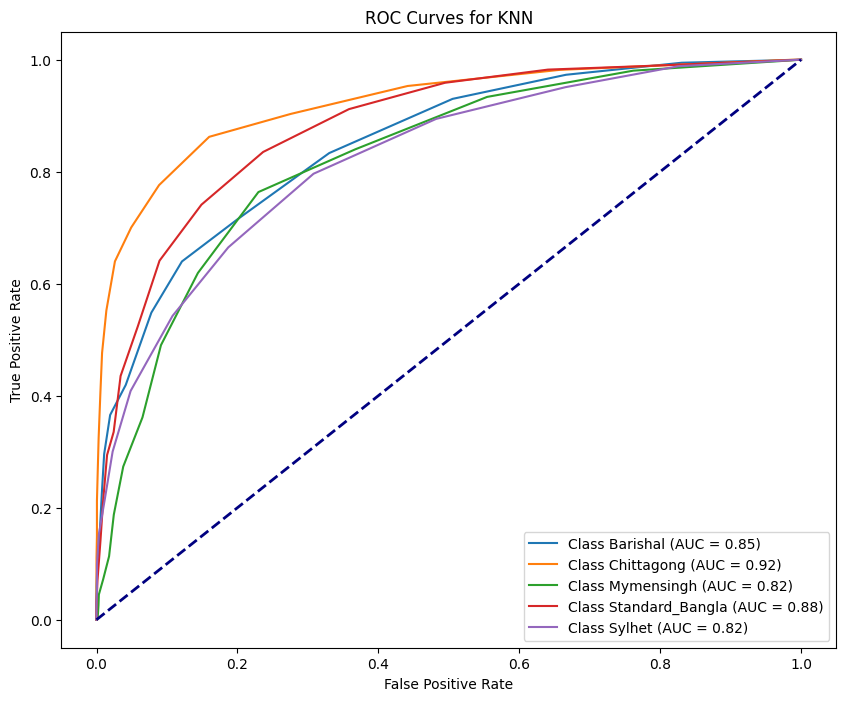

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


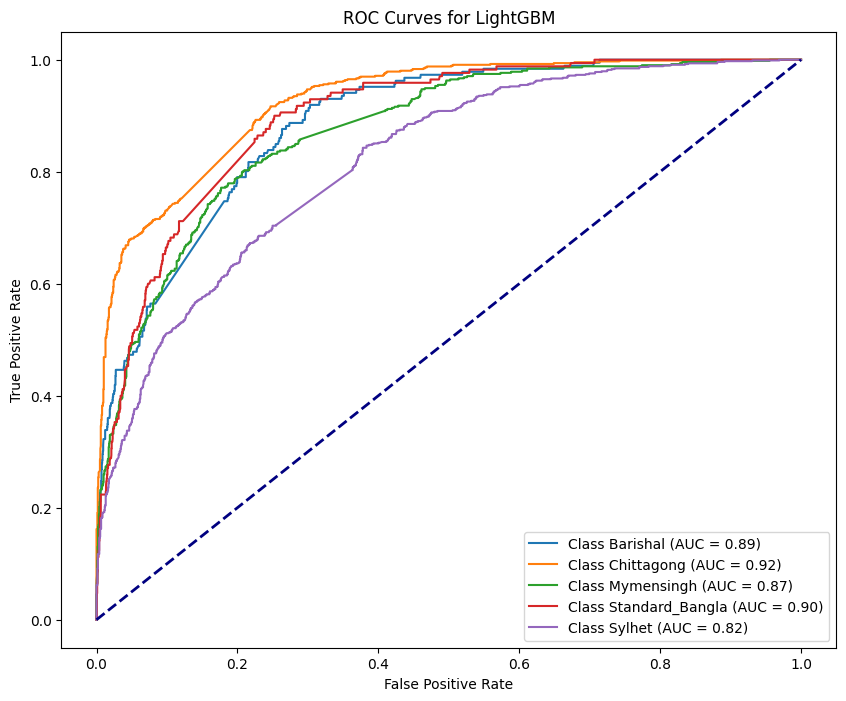

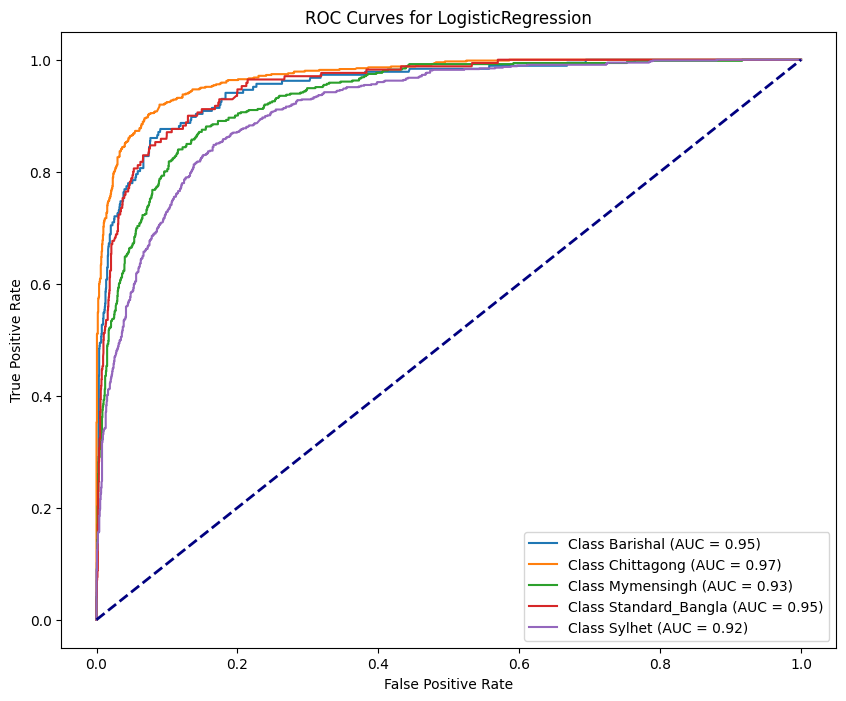

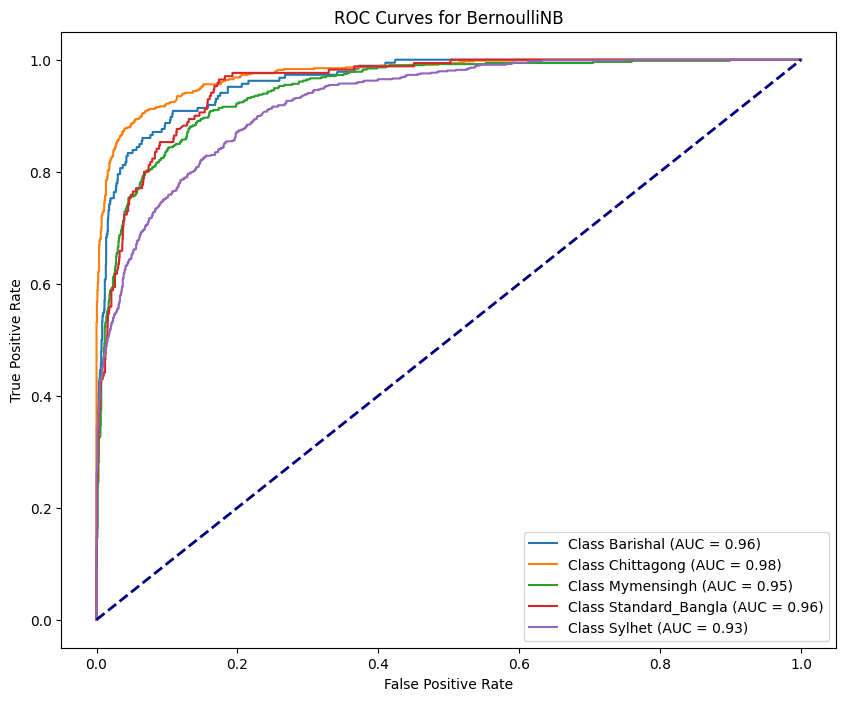

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


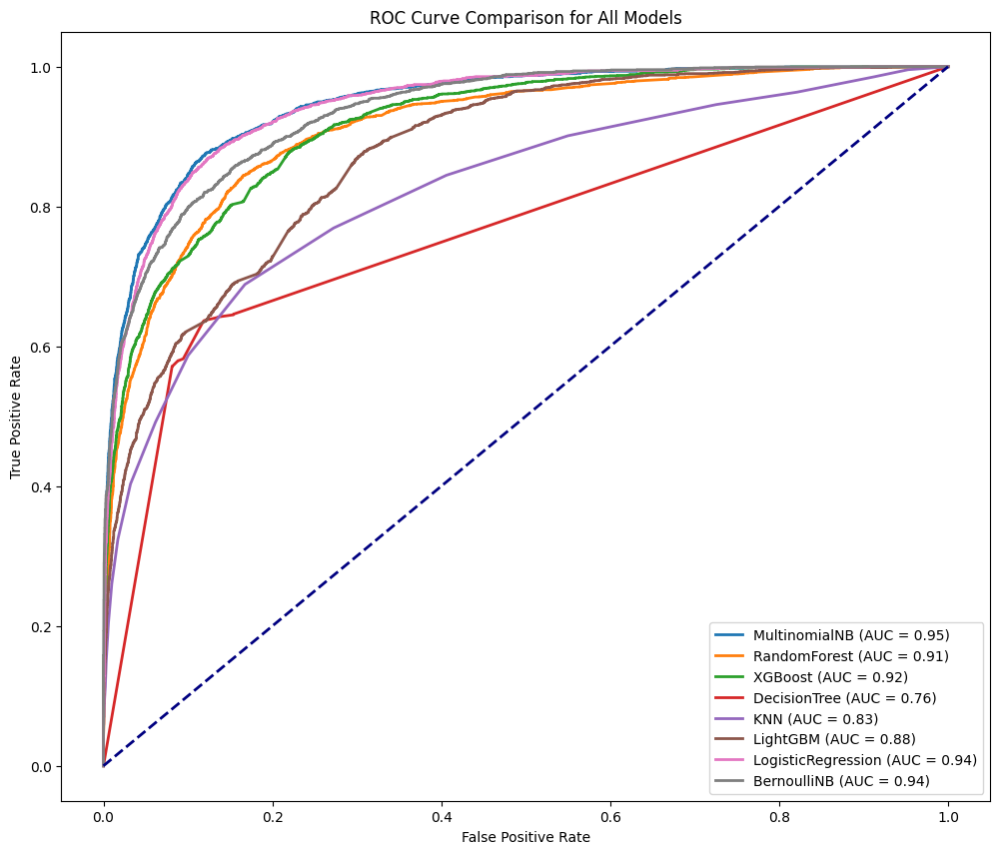

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **SMOTETomek**

In [ ]:
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks
# Define SMOTE-Tomek Links
resample=SMOTETomek(tomek=TomekLinks(sampling_strategy='majority'))
X_train, y_train = resample.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-625-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-625-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


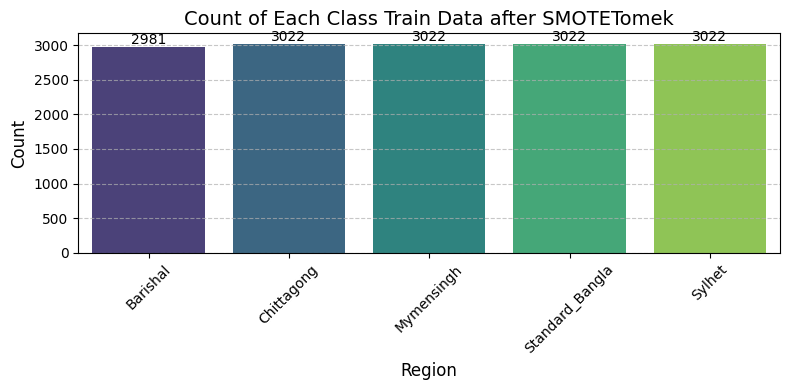

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTETomek")

## Multinomial NB- 84.21%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8420824295010846
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.80      0.73       186
           1       0.96      0.90      0.93       661
           2       0.83      0.86      0.84       512
           3       0.55      0.81      0.66       170
           4       0.91      0.80      0.85       776

    accuracy                           0.84      2305
   macro avg       0.78      0.83      0.80      2305
weighted avg       0.86      0.84      0.85      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8420824295010846
Precision: 0.8589
Recall for : 0.8421
F1 Score:  0.8468
AUC Score: 0.9680
Balanced Accuracy: 0.8332
G-mean Score: 0.9007
pf Score: 0.0389
Bal Score :  0.8849964196414504


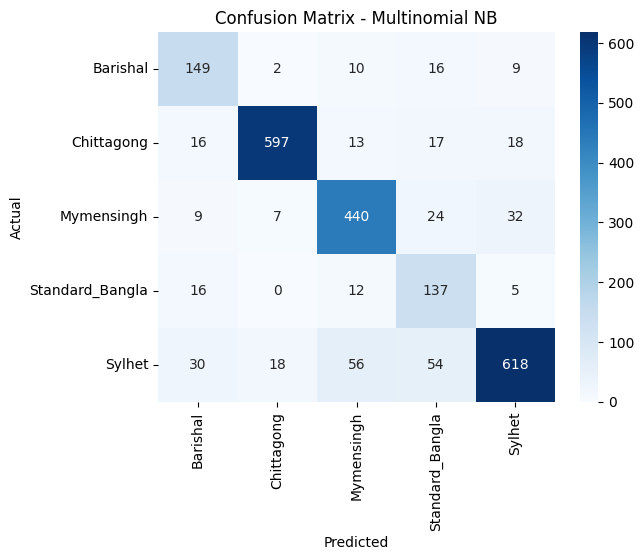

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -75.84%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7583514099783081
Classification Report:
               precision    recall  f1-score   support

           0       0.52      0.81      0.63       186
           1       0.86      0.89      0.88       661
           2       0.83      0.64      0.73       512
           3       0.56      0.76      0.64       170
           4       0.79      0.71      0.74       776

    accuracy                           0.76      2305
   macro avg       0.71      0.76      0.72      2305
weighted avg       0.78      0.76      0.76      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 53.07 seconds
Accuracy: 0.7583514099783081
Precision: 0.7783
Recall for : 0.7584
F1 Score:  0.7611
AUC Score: 0.9270
Balanced Accuracy: 0.7637
G-mean Score: 0.8412
pf Score: 0.0617
Bal Score :  0.8236434233792832


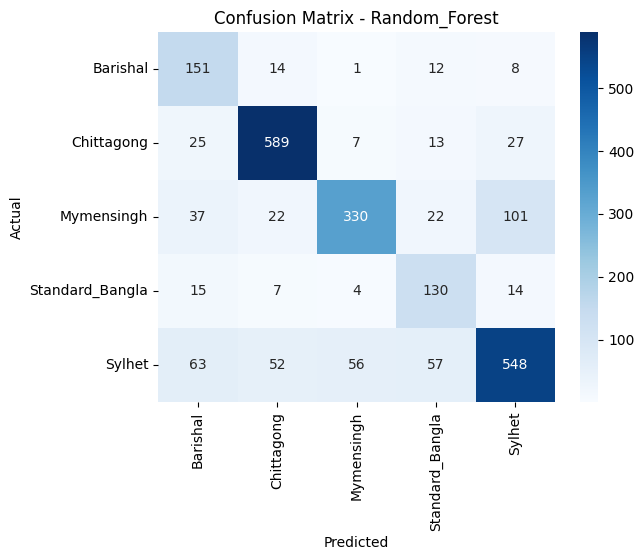

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 76.53%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.76529284164859
Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.71      0.66       186
           1       0.78      0.91      0.84       661
           2       0.79      0.70      0.74       512
           3       0.58      0.71      0.64       170
           4       0.83      0.71      0.77       776

    accuracy                           0.77      2305
   macro avg       0.72      0.75      0.73      2305
weighted avg       0.77      0.77      0.76      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 54.10 seconds
Accuracy: 0.76529284164859
Precision: 0.7725
Recall for : 0.7653
F1 Score:  0.7649
AUC Score: 0.9445
Balanced Accuracy: 0.7483
G-mean Score: 0.8427
pf Score: 0.0614
Bal Score :  0.8284581627755621


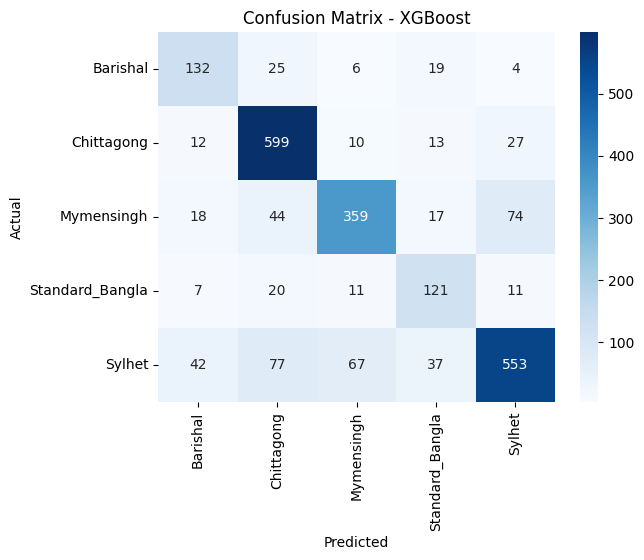

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 68.59%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6859002169197397
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.69      0.52       186
           1       0.84      0.84      0.84       661
           2       0.66      0.57      0.61       512
           3       0.55      0.62      0.58       170
           4       0.72      0.65      0.68       776

    accuracy                           0.69      2305
   macro avg       0.64      0.67      0.65      2305
weighted avg       0.70      0.69      0.69      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.05 seconds
Accuracy: 0.6859002169197397
Precision: 0.7024
Recall for : 0.6859
F1 Score:  0.6898
AUC Score: 0.8081
Balanced Accuracy: 0.6727
G-mean Score: 0.7896
pf Score: 0.0810
Bal Score :  0.7706307808709332


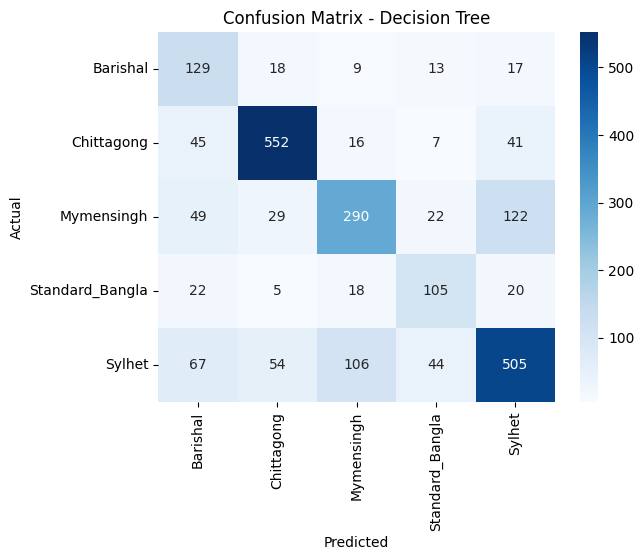

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 24.56%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2455531453362256
Classification Report:
               precision    recall  f1-score   support

           0       0.11      0.89      0.19       186
           1       0.97      0.39      0.55       661
           2       0.83      0.01      0.02       512
           3       0.27      0.74      0.40       170
           4       1.00      0.02      0.04       776

    accuracy                           0.25      2305
   macro avg       0.64      0.41      0.24      2305
weighted avg       0.83      0.25      0.22      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.2455531453362256
Precision: 0.8273
Recall for : 0.2456
F1 Score:  0.2193
AUC Score: 0.7507
Balanced Accuracy: 0.4086
G-mean Score: 0.4788
pf Score: 0.1642
Bal Score :  0.45404304772422033


## LightGBM Model -75.70%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19318
[LightGBM] [Info] Number of data points in the train set: 15069, number of used features: 670
[LightGBM] [Info] Start training from score -1.620381
[LightGBM] [Info] Start training from score -1.606721
[LightGBM] [Info] Start training from score -1.606721
[LightGBM] [Info] Start training from score -1.606721
[LightGBM] [Info] Start training from score -1.606721


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7570498915401301
Classification Report:
               precision    recall  f1-score   support

           0       0.45      0.75      0.56       186
           1       0.87      0.85      0.86       661
           2       0.82      0.72      0.77       512
           3       0.54      0.69      0.61       170
           4       0.82      0.71      0.76       776

    accuracy                           0.76      2305
   macro avg       0.70      0.75      0.71      2305
weighted avg       0.78      0.76      0.76      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 9.57 seconds
Accuracy: 0.7570498915401301
Precision: 0.7831
Recall for : 0.7570
F1 Score:  0.7645
AUC Score: 0.9484
Balanced Accuracy: 0.7455
G-mean Score: 0.8427
pf Score: 0.0610
Bal Score :  0.822879247590951


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

9.5663
0.7570
0.7831
0.7570
0.7645
0.9484
0.7455
0.8427
0.0610
0.8229


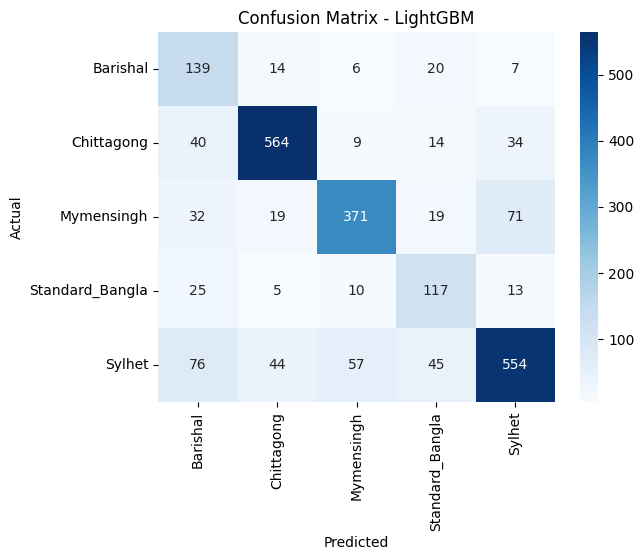

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 82.39%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8238611713665943
Classification Report:
               precision    recall  f1-score   support

           0       0.59      0.82      0.69       186
           1       0.94      0.90      0.92       661
           2       0.85      0.79      0.82       512
           3       0.56      0.78      0.66       170
           4       0.88      0.79      0.83       776

    accuracy                           0.82      2305
   macro avg       0.76      0.82      0.78      2305
weighted avg       0.84      0.82      0.83      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 5.72 seconds
Accuracy: 0.8238611713665943
Precision: 0.8417
Recall for : 0.8239
F1 Score:  0.8289
AUC Score: 0.9653
Balanced Accuracy: 0.8164
G-mean Score: 0.8882
pf Score: 0.0437
Bal Score :  0.8716760214084833


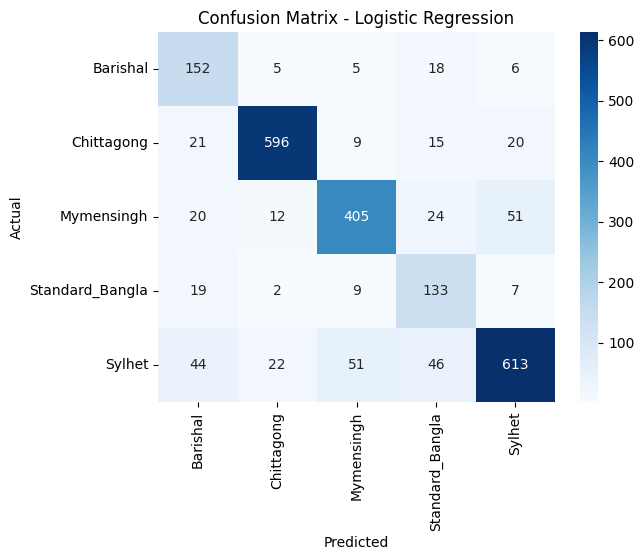

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 81.21%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8121475054229935
Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.84      0.71       186
           1       0.96      0.89      0.92       661
           2       0.92      0.74      0.82       512
           3       0.44      0.88      0.58       170
           4       0.88      0.77      0.82       776

    accuracy                           0.81      2305
   macro avg       0.76      0.82      0.77      2305
weighted avg       0.86      0.81      0.82      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.8121475054229935
Precision: 0.8572
Recall for : 0.8121
F1 Score:  0.8240
AUC Score: 0.9720
Balanced Accuracy: 0.8245
G-mean Score: 0.8845
pf Score: 0.0449
Bal Score :  0.8634281602613837


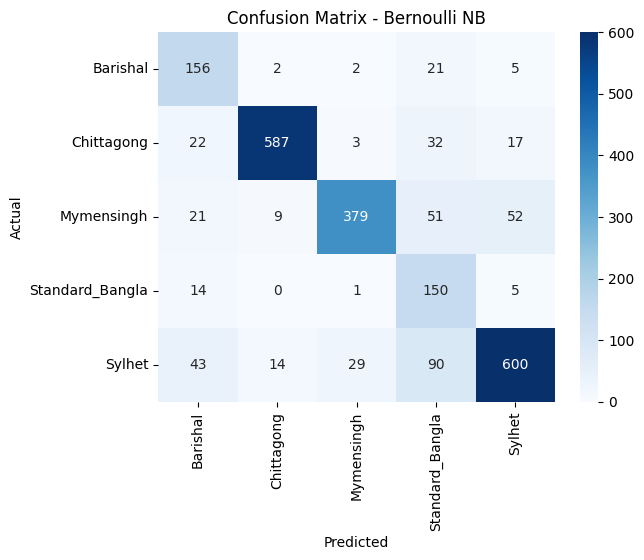

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

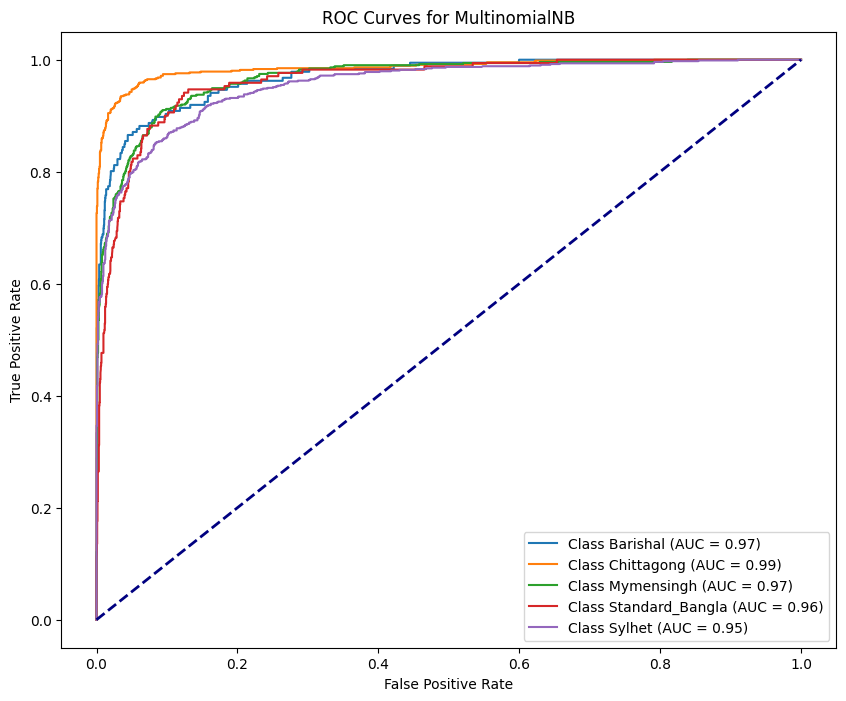

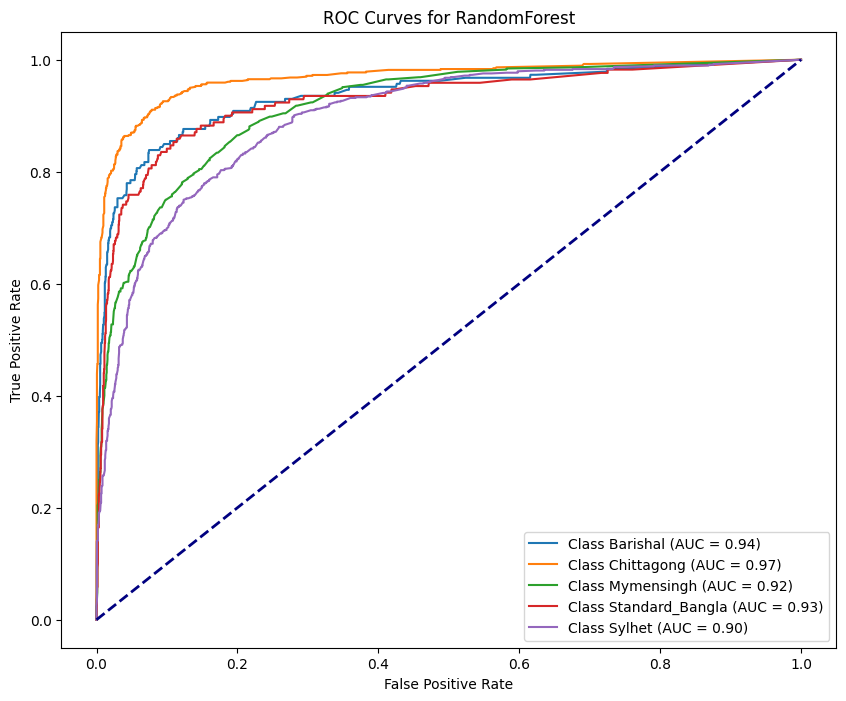

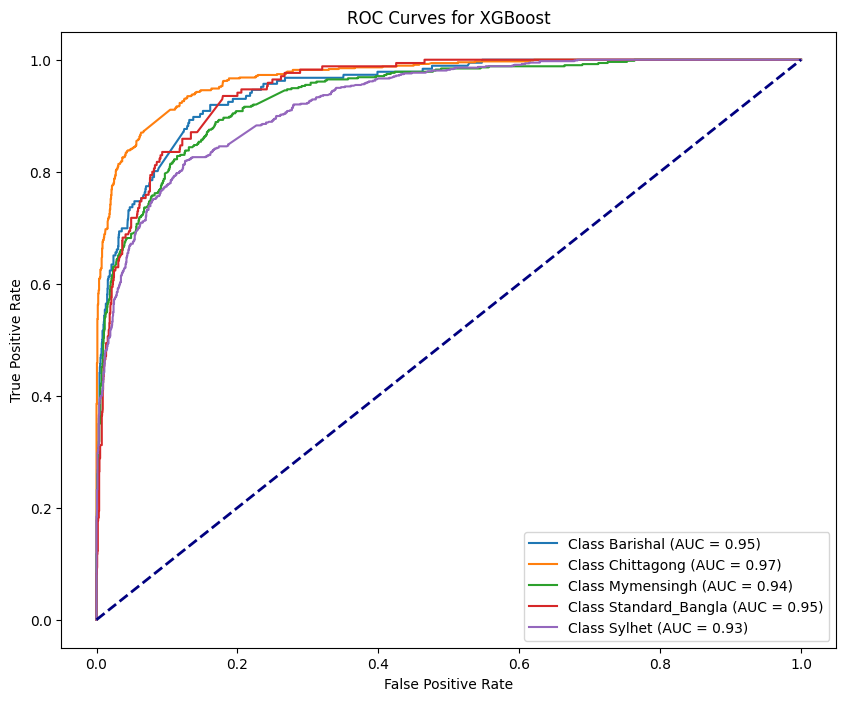

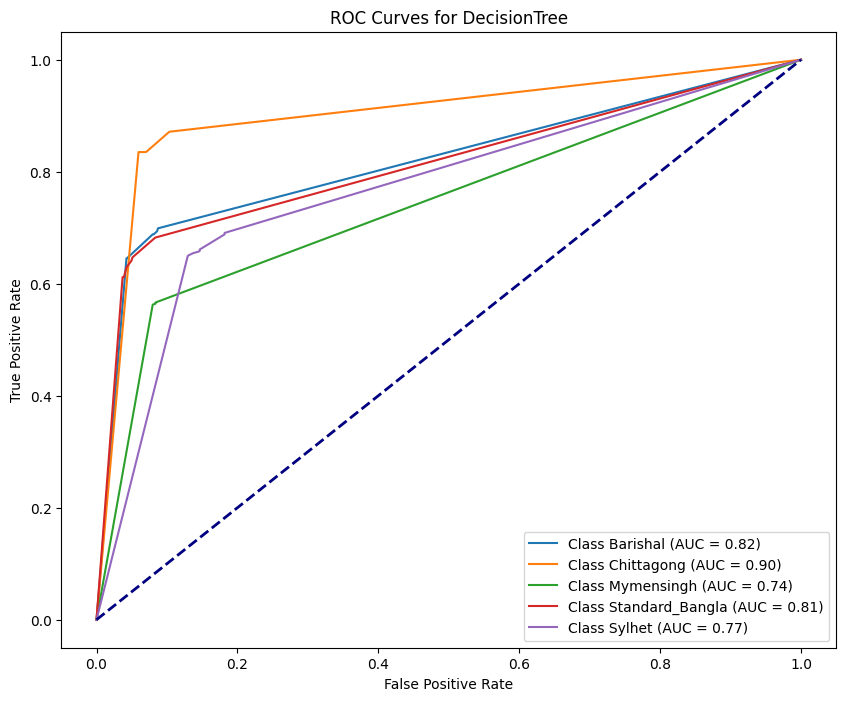

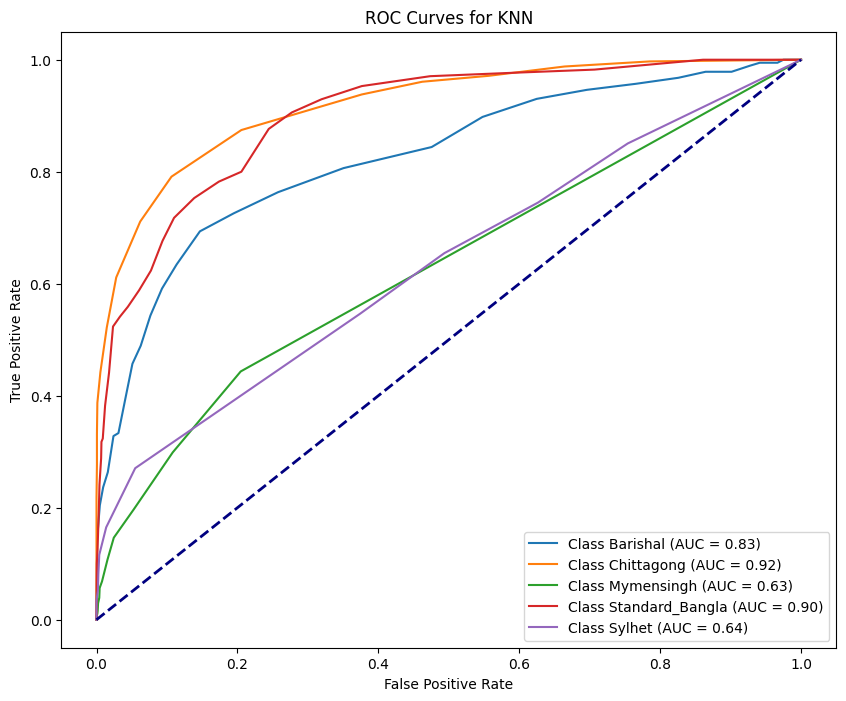

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


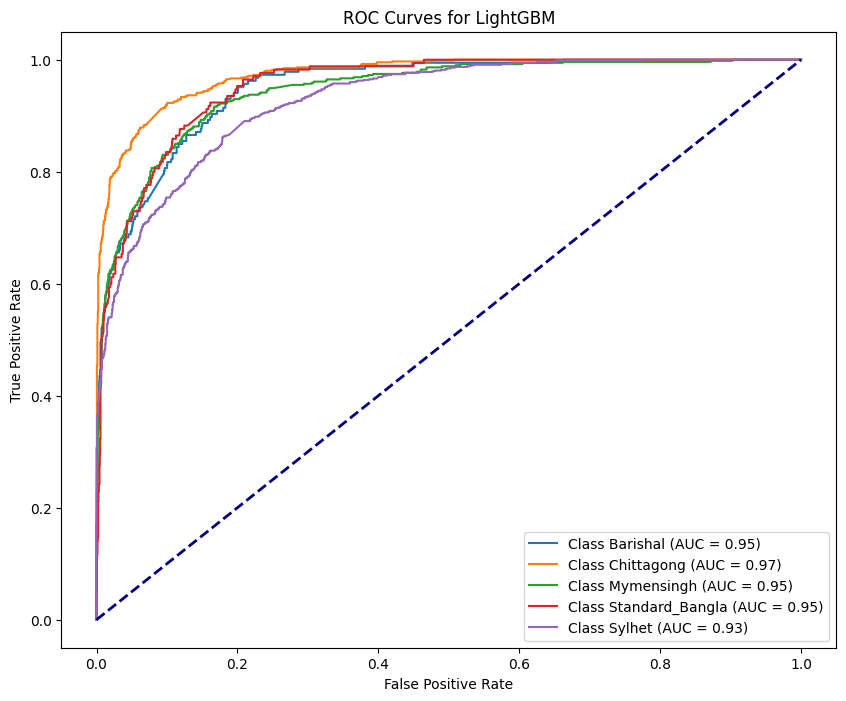

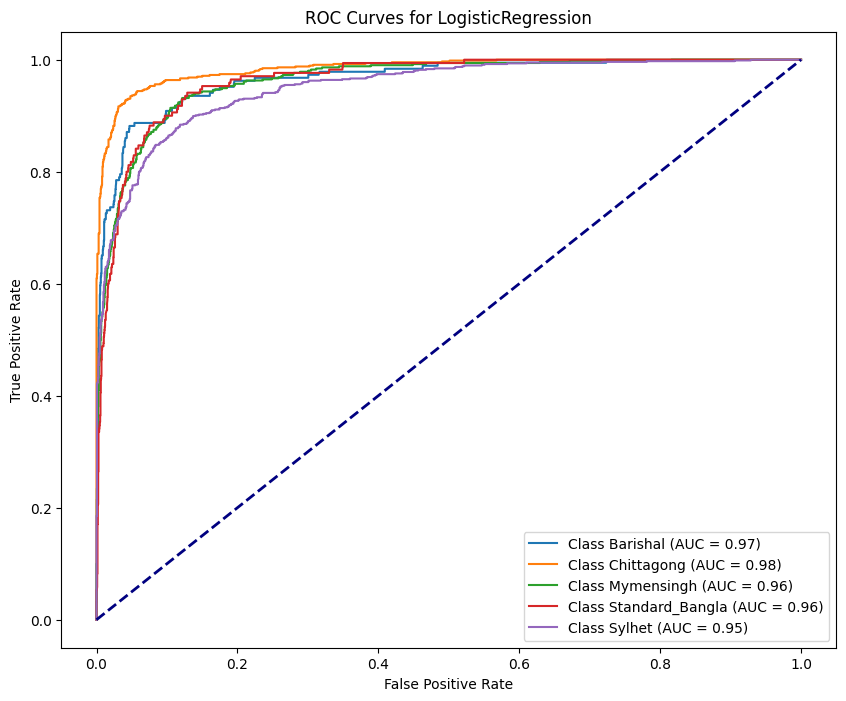

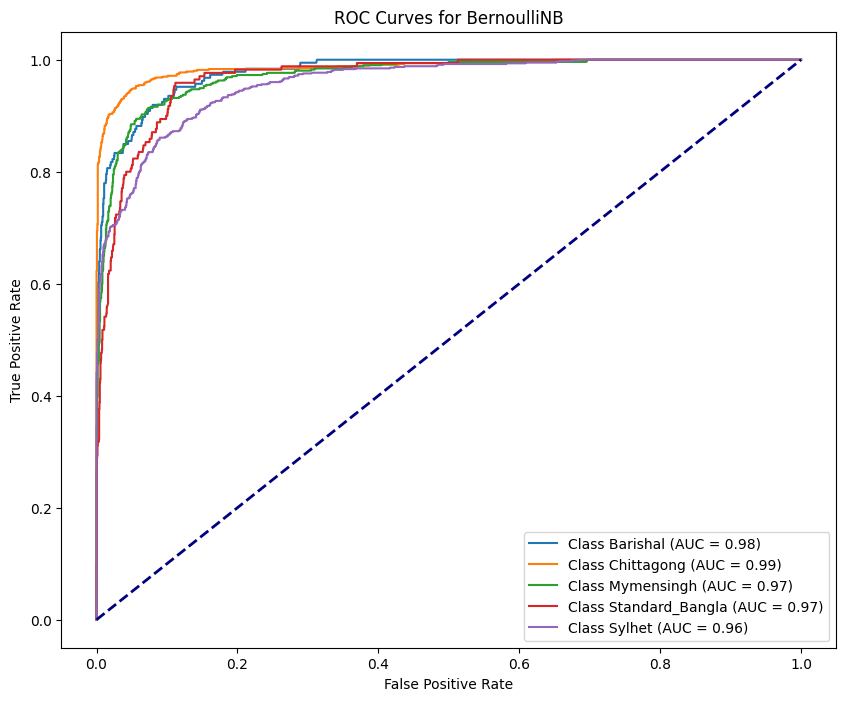

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


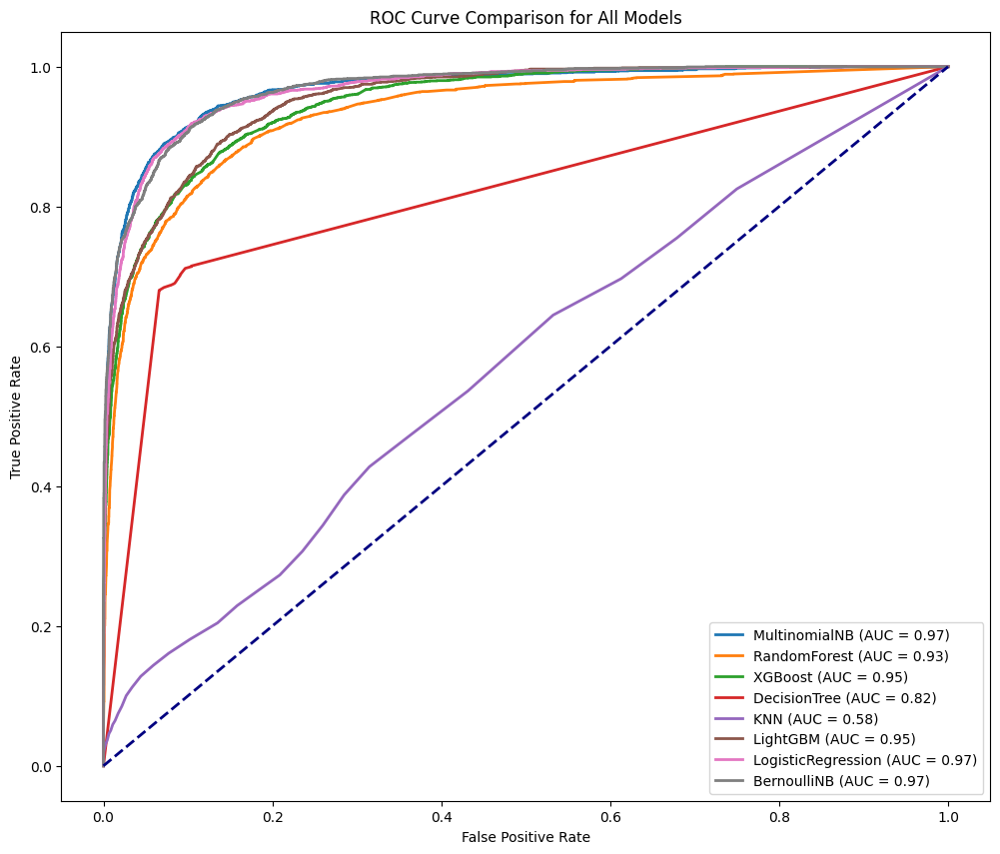

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **ROS-RUS**

In [ ]:
import numpy as np
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter
label_counts = Counter(y)
unique_labels = np.unique(y)
minority_class_label = unique_labels[np.argmin([label_counts[label] for label in unique_labels])]

label_counts_values = np.array(list(label_counts.values()))
median = int(np.median(label_counts_values))
desired_over = {label: max(median, count) for label, count in label_counts.items()}
desired_under = {label: median for label in label_counts.keys()}
under = RandomUnderSampler(sampling_strategy=desired_under)
# Define 'over' using RandomOverSampler with desired_over strategy
over = RandomOverSampler(sampling_strategy=desired_over) #This line is added
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

In [ ]:
X_train, y_train = pipeline.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-674-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-674-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


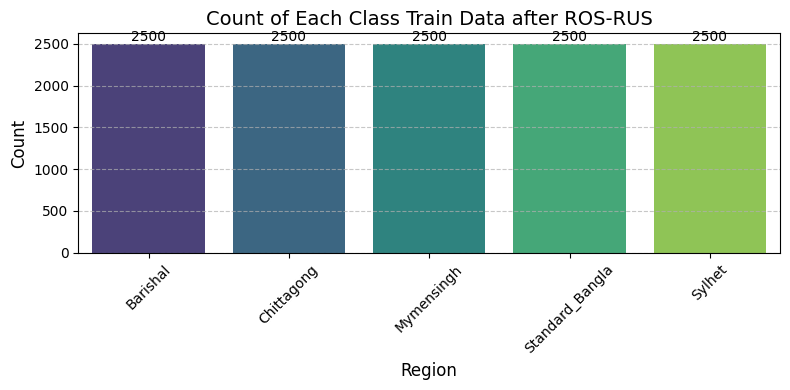

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after ROS-RUS")

## Multinomial NB- 83.04%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8303687635574837
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.82      0.72       186
           1       0.96      0.89      0.92       661
           2       0.83      0.84      0.83       512
           3       0.53      0.86      0.66       170
           4       0.90      0.77      0.83       776

    accuracy                           0.83      2305
   macro avg       0.77      0.84      0.79      2305
weighted avg       0.85      0.83      0.84      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8303687635574837
Precision: 0.8543
Recall for : 0.8304
F1 Score:  0.8365
AUC Score: 0.9658
Balanced Accuracy: 0.8359
G-mean Score: 0.8941
pf Score: 0.0414
Bal Score :  0.8765381504097179


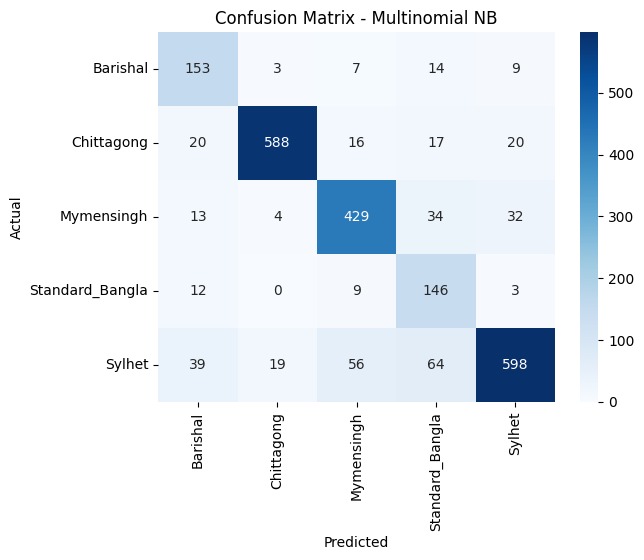

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -75.40%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7540130151843818
Classification Report:
               precision    recall  f1-score   support

           0       0.55      0.76      0.64       186
           1       0.86      0.87      0.87       661
           2       0.73      0.74      0.73       512
           3       0.59      0.78      0.68       170
           4       0.80      0.65      0.72       776

    accuracy                           0.75      2305
   macro avg       0.71      0.76      0.73      2305
weighted avg       0.77      0.75      0.76      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 41.01 seconds
Accuracy: 0.7540130151843818
Precision: 0.7670
Recall for : 0.7540
F1 Score:  0.7556
AUC Score: 0.9218
Balanced Accuracy: 0.7623
G-mean Score: 0.8379
pf Score: 0.0630
Bal Score :  0.8204554049911543


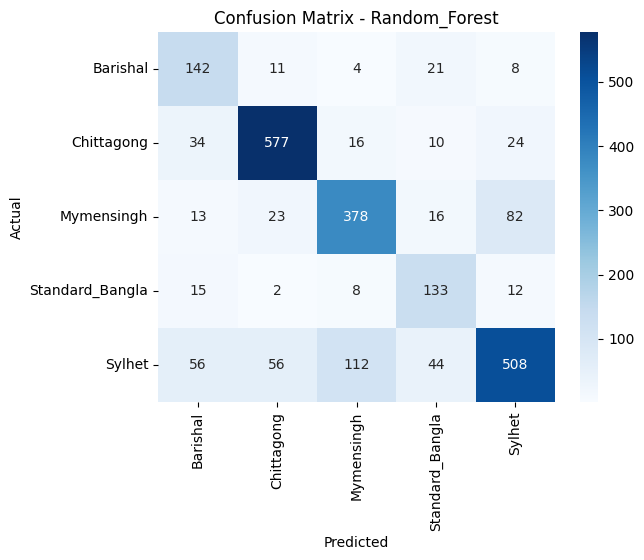

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 74.62%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.7462039045553145
Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.76      0.54       186
           1       0.90      0.82      0.86       661
           2       0.77      0.77      0.77       512
           3       0.52      0.75      0.61       170
           4       0.85      0.66      0.75       776

    accuracy                           0.75      2305
   macro avg       0.69      0.75      0.70      2305
weighted avg       0.79      0.75      0.76      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 43.16 seconds
Accuracy: 0.7462039045553145
Precision: 0.7865
Recall for : 0.7462
F1 Score:  0.7564
AUC Score: 0.9401
Balanced Accuracy: 0.7521
G-mean Score: 0.8389
pf Score: 0.0622
Bal Score :  0.815236411682169


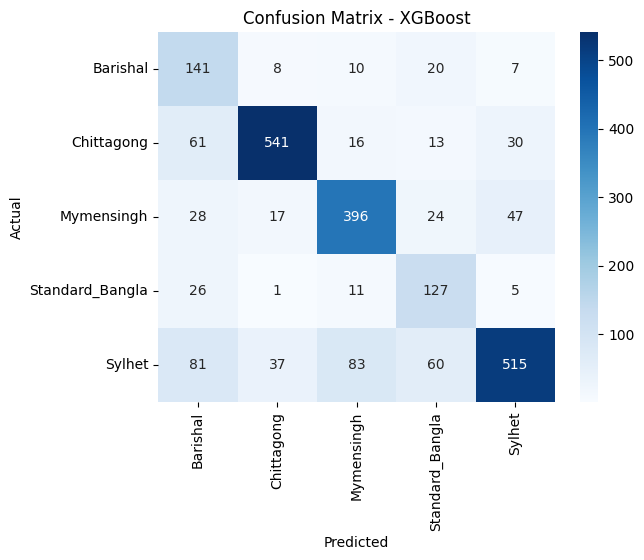

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 67.25%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.6724511930585684
Classification Report:
               precision    recall  f1-score   support

           0       0.41      0.65      0.50       186
           1       0.84      0.82      0.83       661
           2       0.62      0.63      0.62       512
           3       0.49      0.58      0.53       170
           4       0.73      0.60      0.66       776

    accuracy                           0.67      2305
   macro avg       0.62      0.66      0.63      2305
weighted avg       0.69      0.67      0.68      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.83 seconds
Accuracy: 0.6724511930585684
Precision: 0.6923
Recall for : 0.6725
F1 Score:  0.6778
AUC Score: 0.8018
Balanced Accuracy: 0.6557
G-mean Score: 0.7818
pf Score: 0.0837
Bal Score :  0.760937691466915


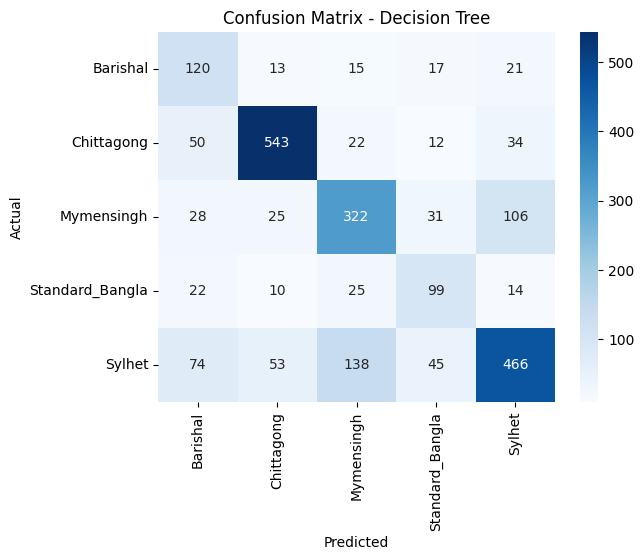

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 25.34%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.2533622559652928
Classification Report:
               precision    recall  f1-score   support

           0       0.10      0.92      0.18       186
           1       1.00      0.32      0.49       661
           2       0.00      0.00      0.00       512
           3       0.45      0.72      0.56       170
           4       0.95      0.10      0.18       776

    accuracy                           0.25      2305
   macro avg       0.50      0.41      0.28      2305
weighted avg       0.65      0.25      0.26      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.2533622559652928
Precision: 0.6470
Recall for : 0.2534
F1 Score:  0.2557
AUC Score: 0.8578
Balanced Accuracy: 0.4128
G-mean Score: 0.4865
pf Score: 0.1625
Bal Score :  0.45968499170474897


## LightGBM Model -72.89%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.074697 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11991
[LightGBM] [Info] Number of data points in the train set: 12500, number of used features: 530
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438
[LightGBM] [Info] Start training from score -1.609438


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Accuracy: 0.7288503253796096
Classification Report:
               precision    recall  f1-score   support

           0       0.44      0.74      0.55       186
           1       0.87      0.82      0.84       661
           2       0.75      0.75      0.75       512
           3       0.52      0.71      0.60       170
           4       0.80      0.64      0.71       776

    accuracy                           0.73      2305
   macro avg       0.67      0.73      0.69      2305
weighted avg       0.76      0.73      0.74      2305



In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 9.01 seconds
Accuracy: 0.7288503253796096
Precision: 0.7578
Recall for : 0.7289
F1 Score:  0.7359
AUC Score: 0.9399
Balanced Accuracy: 0.7316
G-mean Score: 0.8240
pf Score: 0.0679
Bal Score :  0.8023439432681703


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

9.0131
0.7289
0.7578
0.7289
0.7359
0.9399
0.7316
0.8240
0.0679
0.8023


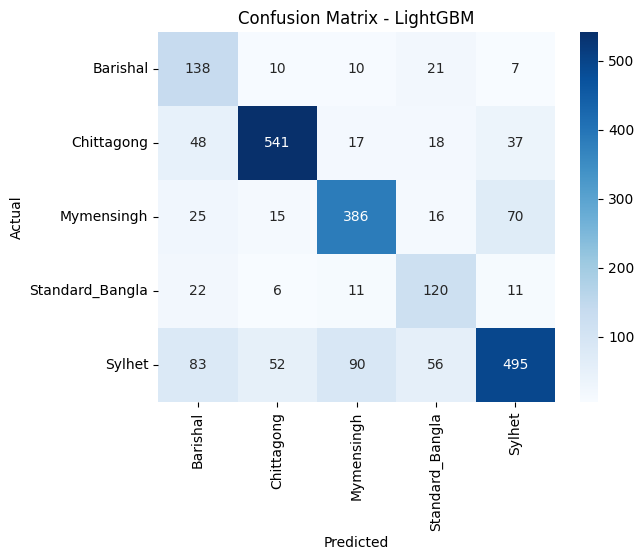

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 83.99%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.8399132321041215
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.82      0.75       186
           1       0.92      0.91      0.92       661
           2       0.84      0.84      0.84       512
           3       0.60      0.81      0.69       170
           4       0.89      0.79      0.84       776

    accuracy                           0.84      2305
   macro avg       0.79      0.83      0.81      2305
weighted avg       0.85      0.84      0.84      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 3.34 seconds
Accuracy: 0.8399132321041215
Precision: 0.8510
Recall for : 0.8399
F1 Score:  0.8428
AUC Score: 0.9645
Balanced Accuracy: 0.8343
G-mean Score: 0.8973
pf Score: 0.0403
Bal Score :  0.883274072698518


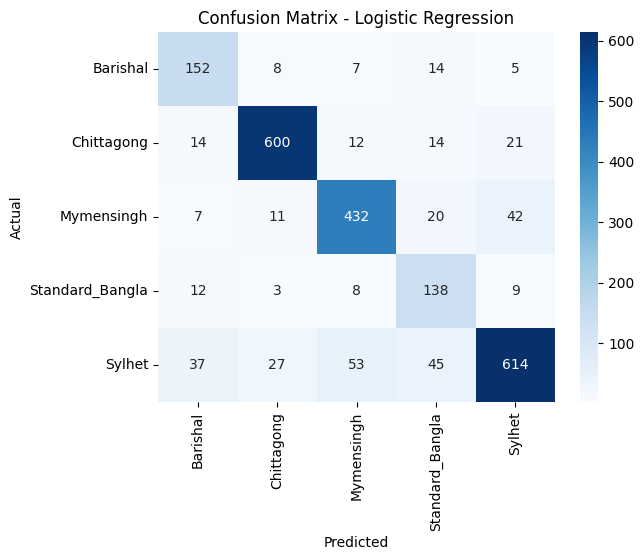

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 80.91%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.8091106290672451
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.85      0.72       186
           1       0.95      0.87      0.91       661
           2       0.90      0.79      0.84       512
           3       0.43      0.91      0.58       170
           4       0.91      0.73      0.81       776

    accuracy                           0.81      2305
   macro avg       0.76      0.83      0.77      2305
weighted avg       0.86      0.81      0.82      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.8091106290672451
Precision: 0.8589
Recall for : 0.8091
F1 Score:  0.8218
AUC Score: 0.9701
Balanced Accuracy: 0.8321
G-mean Score: 0.8838
pf Score: 0.0451
Bal Score :  0.8613045853422046


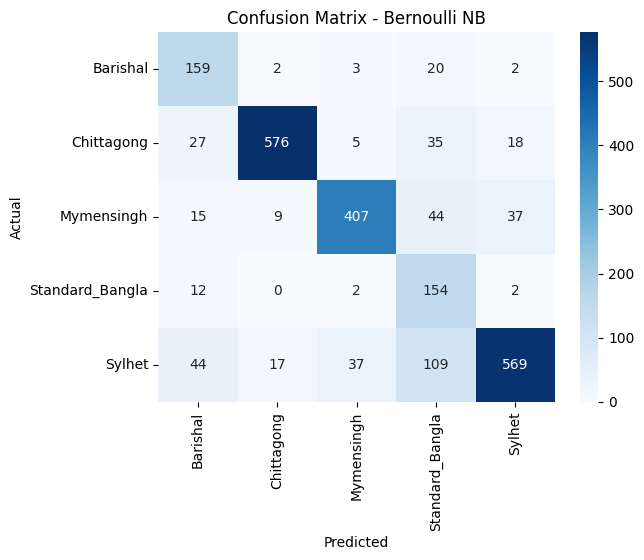

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

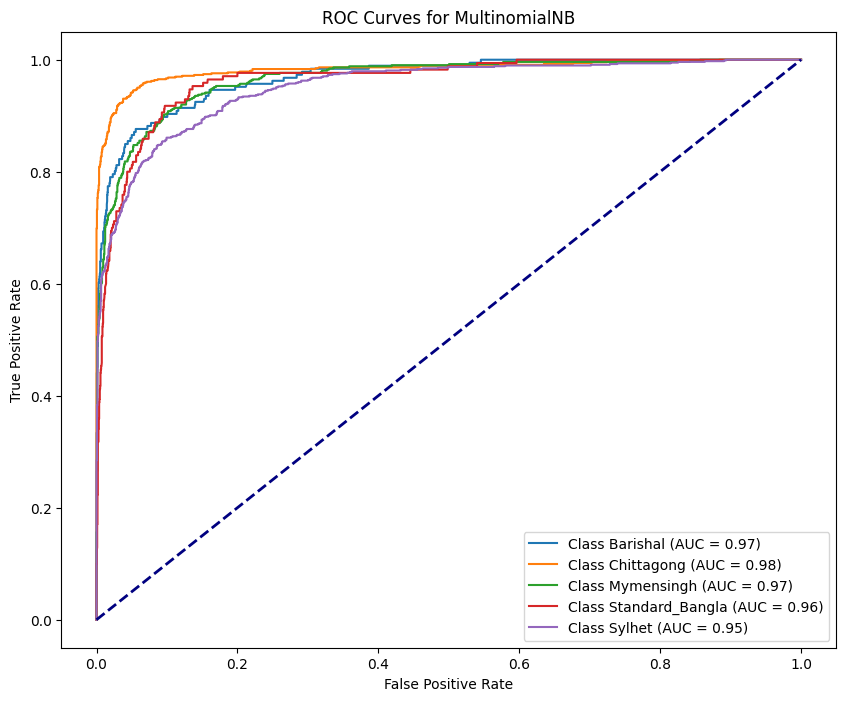

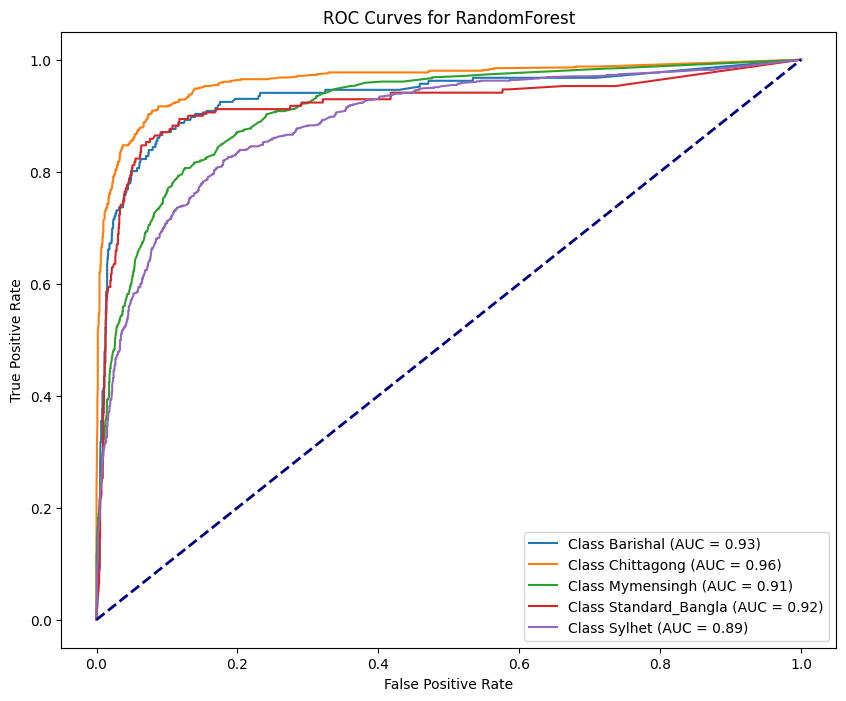

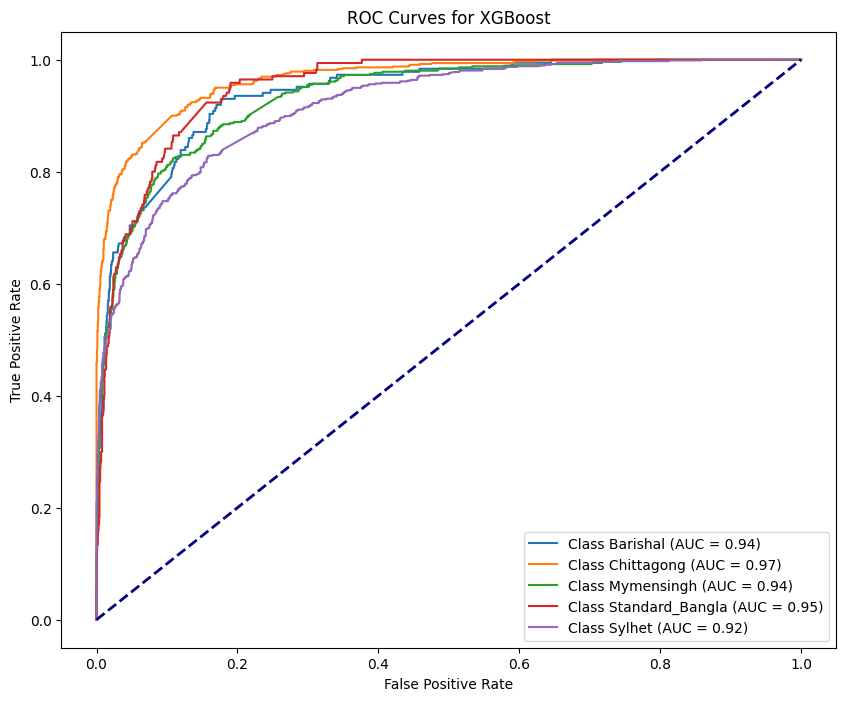

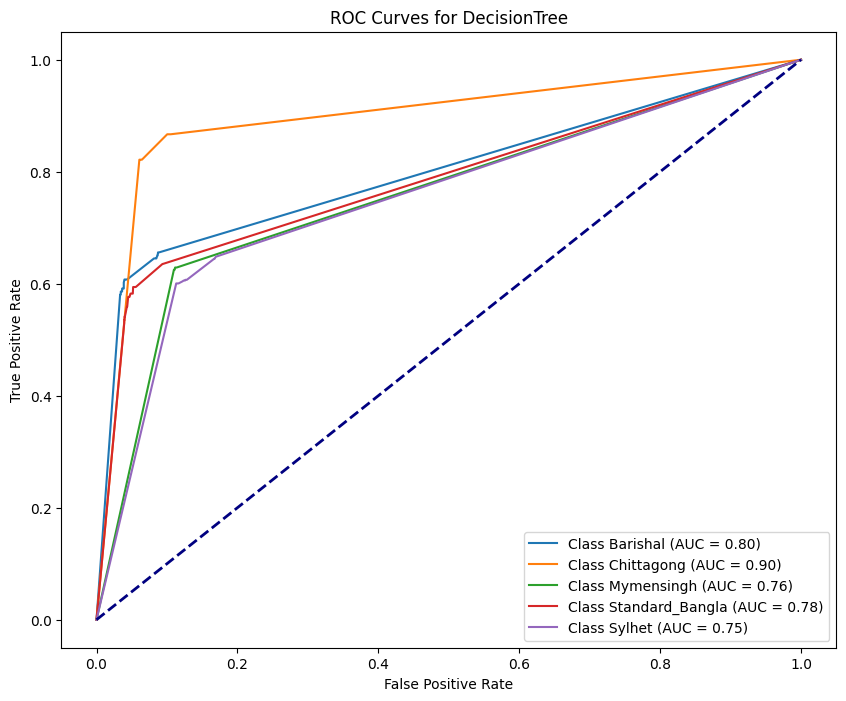

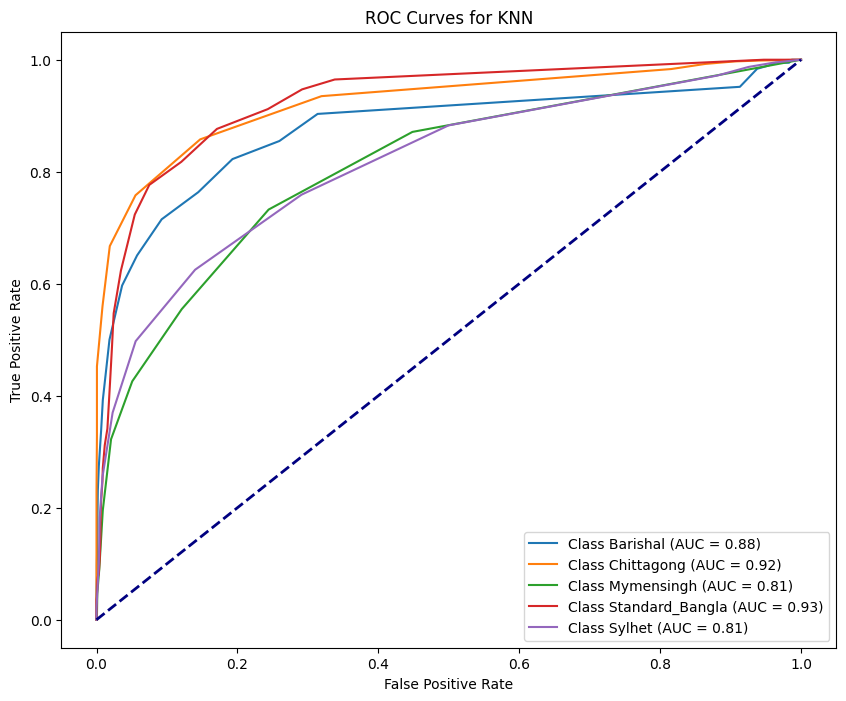

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


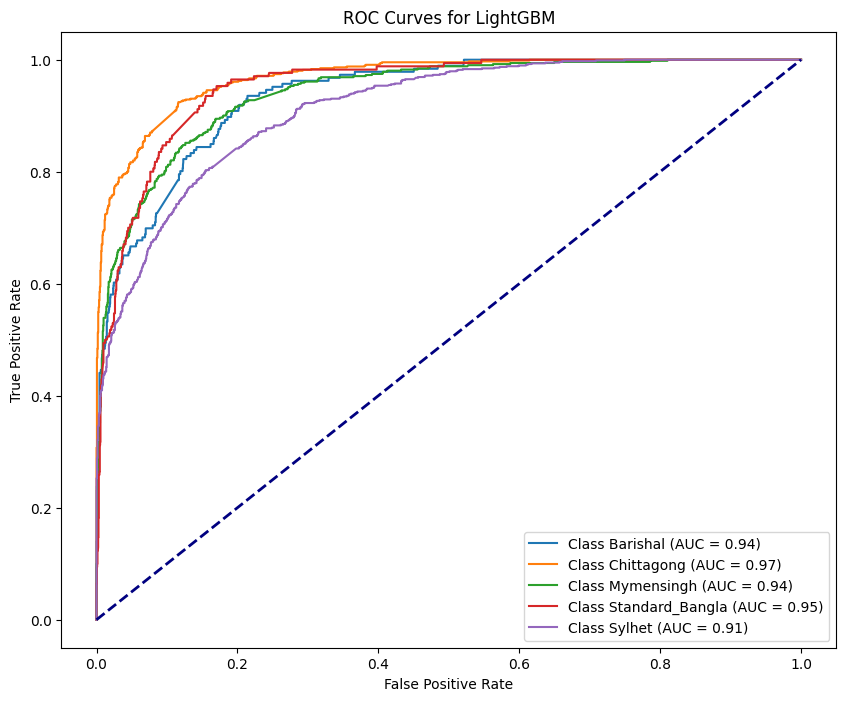

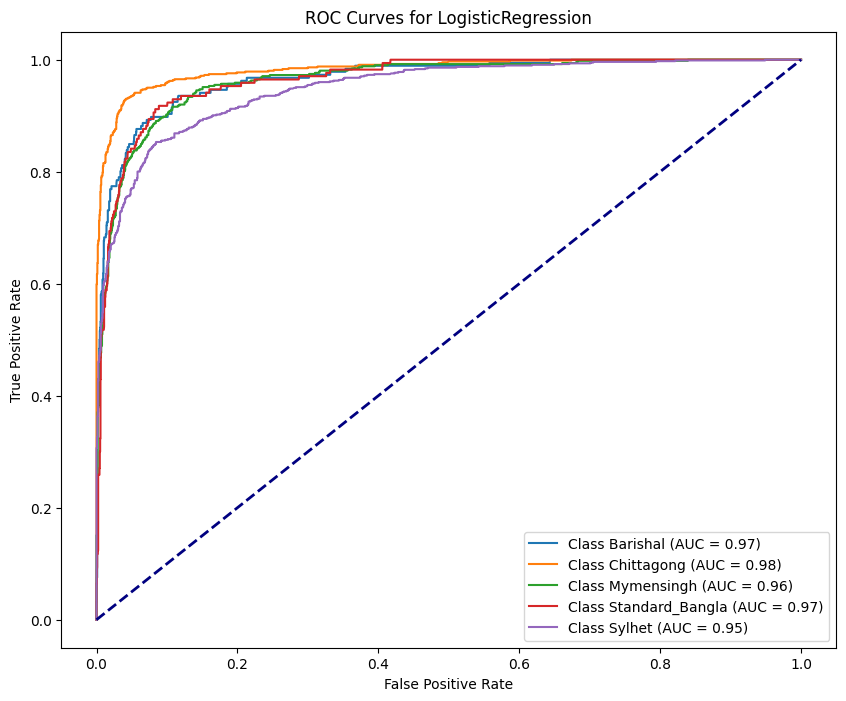

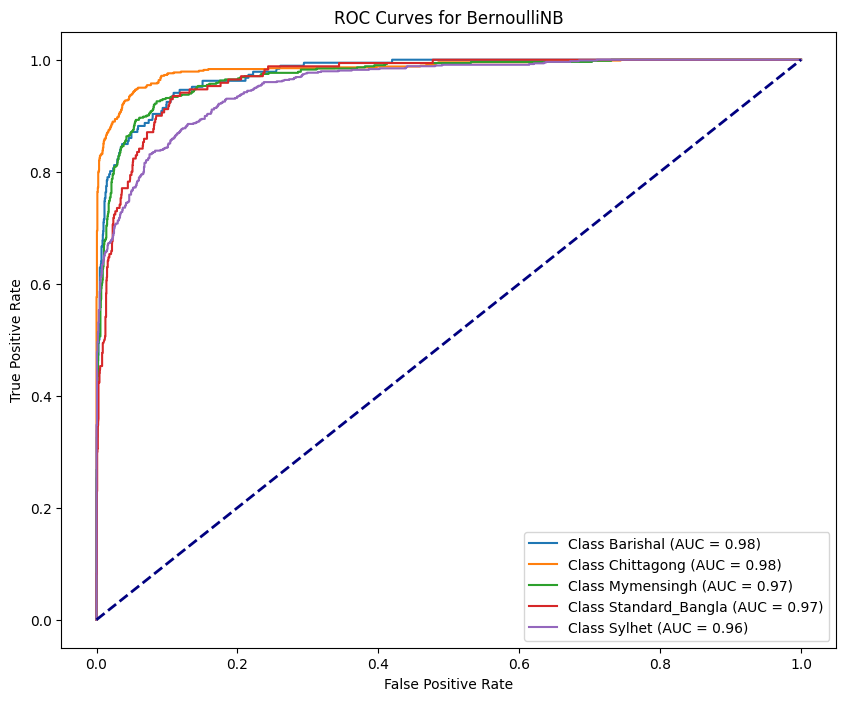

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


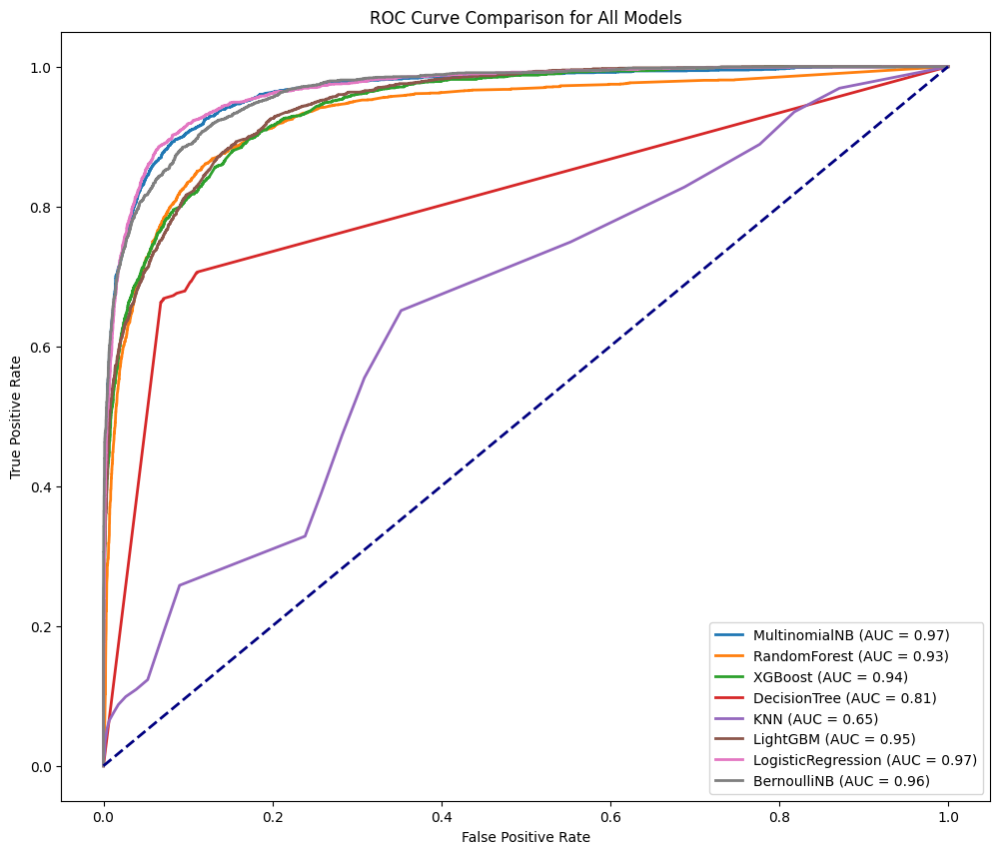

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()

# **SMOTEENN**

In [ ]:
from imblearn.combine import SMOTEENN

In [ ]:
smote_enn = SMOTEENN(random_state=42)
X_train, y_train = smote_enn.fit_resample(X_train_a, y_train_a)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def plot_label_distribution(y, title):
    if not isinstance(y, pd.Series) and not isinstance(y, pd.DataFrame):
        y = pd.Series(y)

    label_to_country = {
    0: 'Barishal',
    1: 'Chittagong',
    2: 'Mymensingh',
    3: 'Standard_Bangla',
    4: 'Sylhet'
    }

    label_counts = y.value_counts().sort_index()

    plt.figure(figsize=(8, 4))
    bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')

    for bar, count in zip(bar_plot.patches, label_counts.values):
        bar_plot.annotate(format(count, 'd'),
                          (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                          ha='center', va='bottom', fontsize=10)

    bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)

    plt.title(title, fontsize=14)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

<ipython-input-64-2acbf34c34f8>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  bar_plot = sns.barplot(x=label_counts.index, y=label_counts.values, palette='viridis')
<ipython-input-64-2acbf34c34f8>:27: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  bar_plot.set_xticklabels([label_to_country[label] for label in label_counts.index], rotation=45)


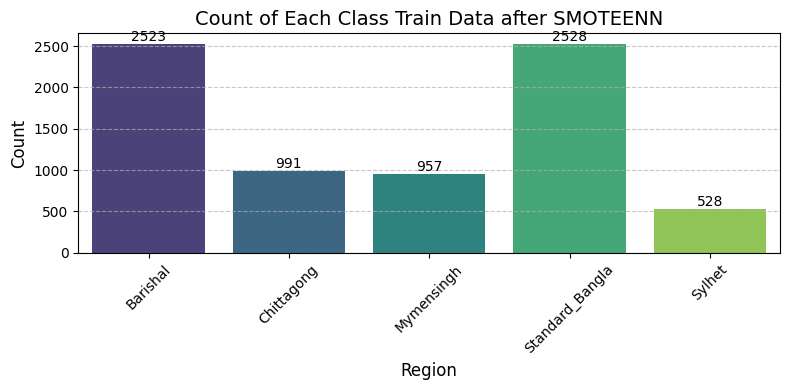

In [ ]:
plot_label_distribution(y_train, title="Count of Each Class Train Data after SMOTEENN")

## Multinomial NB- 48.76%

In [ ]:
nb_model = MultinomialNB()
start_time = time.time()
nb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = nb_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.4876355748373102
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.89      0.39       186
           1       0.93      0.72      0.81       661
           2       0.70      0.48      0.57       512
           3       0.21      0.87      0.34       170
           4       1.00      0.11      0.21       776

    accuracy                           0.49      2305
   macro avg       0.62      0.61      0.46      2305
weighted avg       0.79      0.49      0.49      2305



In [ ]:
y_pred_probs = nb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.01 seconds
Accuracy: 0.4876355748373102
Precision: 0.7936
Recall for : 0.4876
F1 Score:  0.4850
AUC Score: 0.8975
Balanced Accuracy: 0.6146
G-mean Score: 0.6780
pf Score: 0.1139
Bal Score :  0.6288553160637733


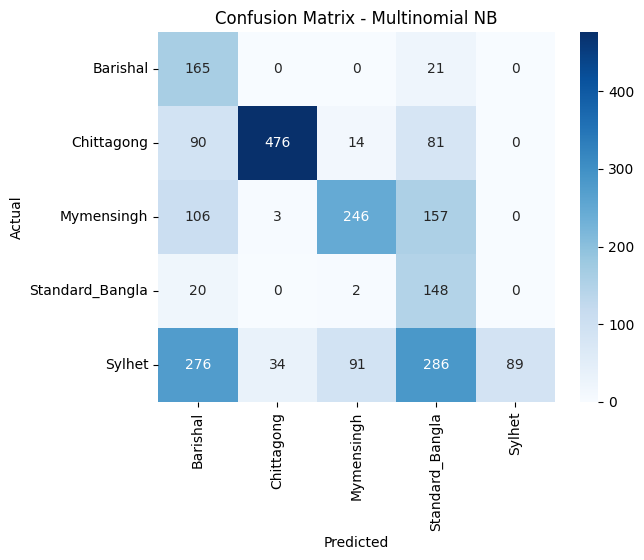

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Multinomial NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Random Forest -57.05%

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=1)
start_time = time.time()
rf_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = rf_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5704989154013015
Classification Report:
               precision    recall  f1-score   support

           0       0.26      0.88      0.40       186
           1       0.87      0.79      0.82       661
           2       0.75      0.49      0.59       512
           3       0.29      0.84      0.43       170
           4       0.91      0.31      0.46       776

    accuracy                           0.57      2305
   macro avg       0.62      0.66      0.54      2305
weighted avg       0.76      0.57      0.59      2305



In [ ]:
y_pred_probs = rf_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 9.68 seconds
Accuracy: 0.5704989154013015
Precision: 0.7638
Recall for : 0.5705
F1 Score:  0.5879
AUC Score: 0.8861
Balanced Accuracy: 0.6601
G-mean Score: 0.7328
pf Score: 0.0977
Bal Score :  0.6885436270533373


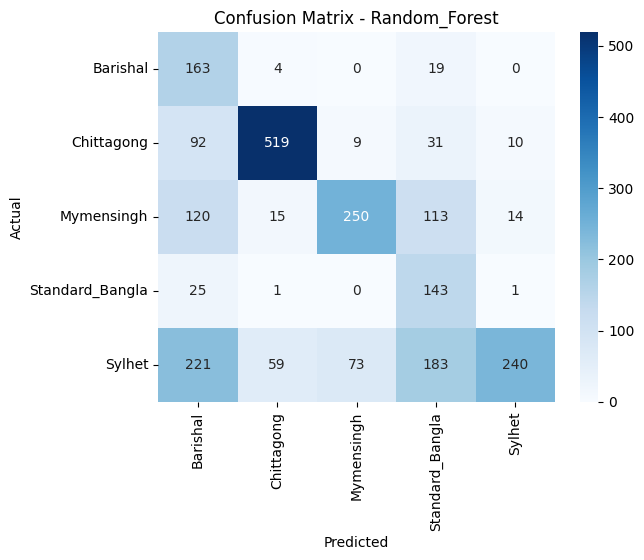

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Random_Forest"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## XGBoost - 56.62%

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report
xgb_model = xgb.XGBClassifier(objective='binary:logistic', random_state=1)
start_time = time.time()
xgb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = xgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5661605206073753
Classification Report:
               precision    recall  f1-score   support

           0       0.24      0.85      0.37       186
           1       0.90      0.73      0.81       661
           2       0.75      0.55      0.63       512
           3       0.30      0.79      0.43       170
           4       0.90      0.32      0.47       776

    accuracy                           0.57      2305
   macro avg       0.62      0.65      0.54      2305
weighted avg       0.77      0.57      0.59      2305



In [ ]:
y_pred_probs = xgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 29.11 seconds
Accuracy: 0.5661605206073753
Precision: 0.7691
Recall for : 0.5662
F1 Score:  0.5923
AUC Score: 0.8797
Balanced Accuracy: 0.6488
G-mean Score: 0.7306
pf Score: 0.0982
Bal Score :  0.6854658196825654


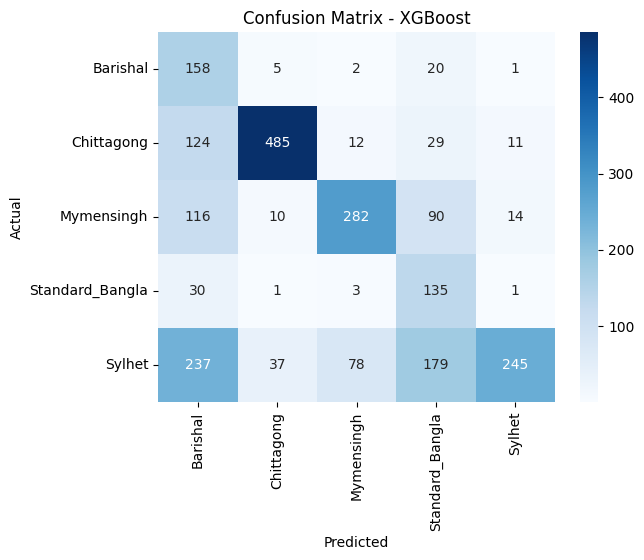

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "XGBoost"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Decision Trees - 53.06%

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier(random_state=1)
start_time = time.time()
dt_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = dt_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.53058568329718
Classification Report:
               precision    recall  f1-score   support

           0       0.24      0.82      0.37       186
           1       0.83      0.73      0.78       661
           2       0.59      0.54      0.56       512
           3       0.33      0.76      0.46       170
           4       0.84      0.24      0.37       776

    accuracy                           0.53      2305
   macro avg       0.57      0.62      0.51      2305
weighted avg       0.70      0.53      0.54      2305



In [ ]:
y_pred_probs = dt_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 1.02 seconds
Accuracy: 0.53058568329718
Precision: 0.6971
Recall for : 0.5306
F1 Score:  0.5360
AUC Score: 0.7273
Balanced Accuracy: 0.6168
G-mean Score: 0.7002
pf Score: 0.1091
Bal Score :  0.6592270503174522


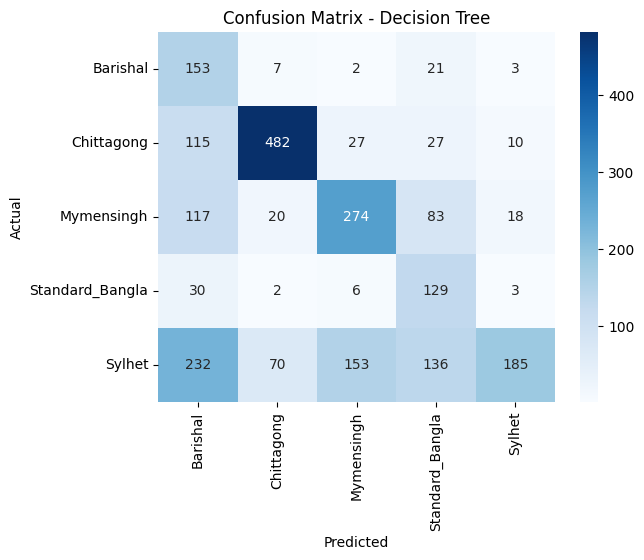

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Decision Tree"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## KNN Model - 12.67%

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_model = KNeighborsClassifier(n_neighbors=30)
start_time = time.time()
knn_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = knn_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.1266811279826464
Classification Report:
               precision    recall  f1-score   support

           0       0.08      0.94      0.15       186
           1       1.00      0.02      0.04       661
           2       0.60      0.01      0.01       512
           3       0.54      0.56      0.55       170
           4       1.00      0.01      0.02       776

    accuracy                           0.13      2305
   macro avg       0.65      0.31      0.15      2305
weighted avg       0.80      0.13      0.07      2305



In [ ]:
import numpy as np # Importing the NumPy library

In [ ]:
y_pred_probs = knn_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.00 seconds
Accuracy: 0.1266811279826464
Precision: 0.8034
Recall for : 0.1267
F1 Score:  0.0725
AUC Score: 0.6523
Balanced Accuracy: 0.3057
G-mean Score: 0.3420
pf Score: 0.1900
Bal Score :  0.36802864027000204


## LightGBM Model -57.14%

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=1)
start_time = time.time()
lgb_model.fit(X_train, y_train)
end_time = time.time()

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024706 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 9487
[LightGBM] [Info] Number of data points in the train set: 7527, number of used features: 371
[LightGBM] [Info] Start training from score -1.093048
[LightGBM] [Info] Start training from score -2.027537
[LightGBM] [Info] Start training from score -2.062448
[LightGBM] [Info] Start training from score -1.091068
[LightGBM] [Info] Start training from score -2.657156


In [ ]:
y_pred = lgb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.5713665943600867
Classification Report:
               precision    recall  f1-score   support

           0       0.24      0.78      0.37       186
           1       0.85      0.75      0.80       661
           2       0.69      0.62      0.65       512
           3       0.34      0.76      0.47       170
           4       0.82      0.29      0.43       776

    accuracy                           0.57      2305
   macro avg       0.59      0.64      0.54      2305
weighted avg       0.72      0.57      0.58      2305



/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
y_pred_probs = lgb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Training time: 3.58 seconds
Accuracy: 0.5713665943600867
Precision: 0.7151
Recall for : 0.5714
F1 Score:  0.5827
AUC Score: 0.8726
Balanced Accuracy: 0.6426
G-mean Score: 0.7287
pf Score: 0.0998
Bal Score :  0.6887961298613907


In [ ]:
print(f"{training_time:.4f}")
print(f"{accuracy_score(y_test, y_pred):.4f}")
print(f"{precision:.4f}")
print(f"{pd:.4f}")  # Assuming you renamed 'pd' to 'recall'
print(f"{f1:.4f}")
print(f"{auc_score:.4f}")
print(f"{balanced_acc:.4f}")
print(f"{g_mean:.4f}")
print(f"{pf:.4f}")
print(f"{bal:.4f}")

3.5798
0.5714
0.7151
0.5714
0.5827
0.8726
0.6426
0.7287
0.0998
0.6888


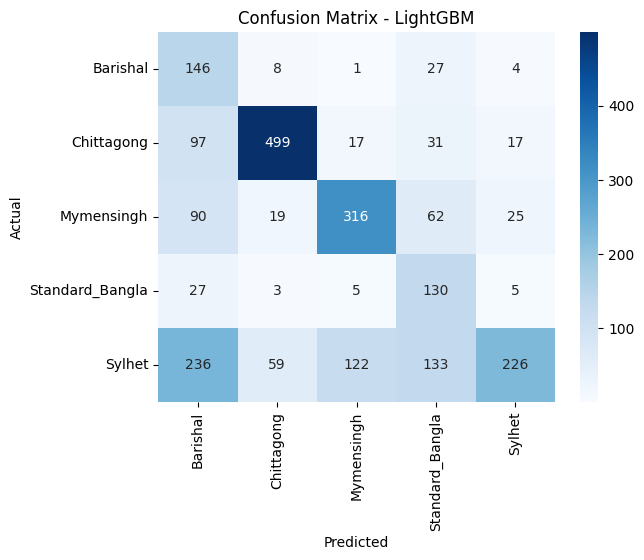

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "LightGBM"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## LogisticRegression - 57.57%

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
lgr_model = LogisticRegression(random_state=1)
start_time = time.time()
lgr_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = lgr_model.predict(X_test)

In [ ]:
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

Accuracy: 0.575704989154013
Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.88      0.39       186
           1       0.92      0.76      0.83       661
           2       0.72      0.60      0.65       512
           3       0.31      0.86      0.46       170
           4       0.94      0.27      0.42       776

    accuracy                           0.58      2305
   macro avg       0.63      0.67      0.55      2305
weighted avg       0.78      0.58      0.59      2305



In [ ]:
y_pred_probs = lgr_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 4.47 seconds
Accuracy: 0.575704989154013
Precision: 0.7845
Recall for : 0.5757
F1 Score:  0.5911
AUC Score: 0.9066
Balanced Accuracy: 0.6732
G-mean Score: 0.7377
pf Score: 0.0958
Bal Score :  0.6924289780985022


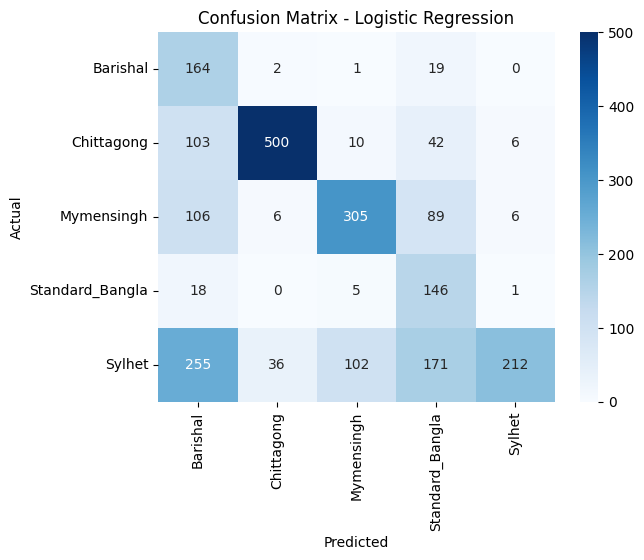

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Logistic Regression"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## Bernoulli NB - 52.93%

In [ ]:
from sklearn.naive_bayes import BernoulliNB

bnb_model = BernoulliNB()
start_time = time.time()
bnb_model.fit(X_train, y_train)
end_time = time.time()

In [ ]:
y_pred = bnb_model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.5292841648590022
Classification Report:
               precision    recall  f1-score   support

           0       0.31      0.89      0.46       186
           1       0.89      0.77      0.83       661
           2       0.73      0.51      0.60       512
           3       0.21      0.89      0.35       170
           4       0.99      0.17      0.29       776

    accuracy                           0.53      2305
   macro avg       0.63      0.65      0.50      2305
weighted avg       0.79      0.53      0.53      2305



In [ ]:
y_pred_probs = bnb_model.predict_proba(X_test)
precision = precision_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
pd = recall_score(y_test, y_pred, average='weighted')
auc_score = roc_auc_score(y_test, y_pred_probs, multi_class='ovr', average='weighted')
balanced_acc = balanced_accuracy_score(y_test, y_pred)
g_mean = geometric_mean_score(y_test, y_pred, average='weighted')



cm = confusion_matrix(y_test, y_pred, labels=np.unique(y_test))  # Get the confusion matrix
fp = np.sum(cm, axis=0) - np.diag(cm)  # Sum of false positives for each class
fn = np.sum(cm, axis=1) - np.diag(cm)  # Sum of false negatives for each class
tp = np.diag(cm)  # True positives are on the diagonal
tn = np.sum(cm) - (fp + fn + tp)
pf_per_class = fp / (fp + tn)
pf = np.mean(pf_per_class)


import math
bal = 1 - (math.sqrt((0 - pf)**2 + (1 - pd)**2) / math.sqrt(2))
training_time = end_time - start_time






print(f"Training time: {training_time:.2f} seconds")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(f"Precision: {precision:.4f}")
print(f"Recall for : {pd:.4f}")
print(f"F1 Score: {f1: .4f}")
print(f"AUC Score: {auc_score:.4f}")
print(f"Balanced Accuracy: {balanced_acc:.4f}")
print(f"G-mean Score: {g_mean:.4f}")
print(f"pf Score: {pf:.4f}")
print("Bal Score : ",bal)


Training time: 0.02 seconds
Accuracy: 0.5292841648590022
Precision: 0.7931
Recall for : 0.5293
F1 Score:  0.5306
AUC Score: 0.9038
Balanced Accuracy: 0.6467
G-mean Score: 0.7068
pf Score: 0.1054
Bal Score :  0.6589117880250253


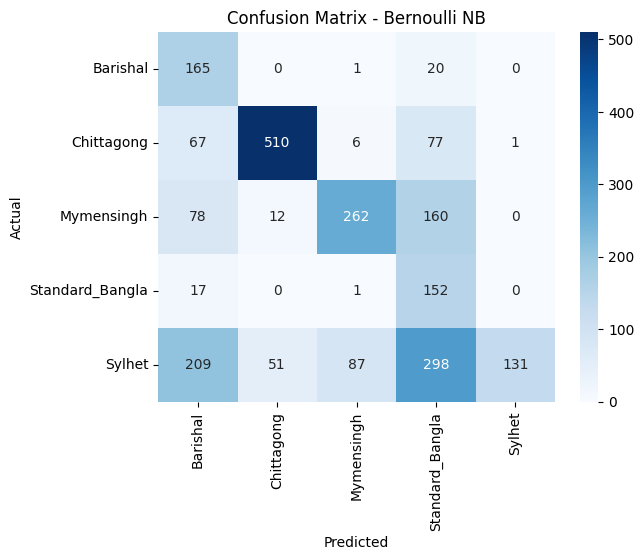

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
model_name = "Bernoulli NB"
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title(f'Confusion Matrix - {model_name}')
plt.show()

## ROC Curve

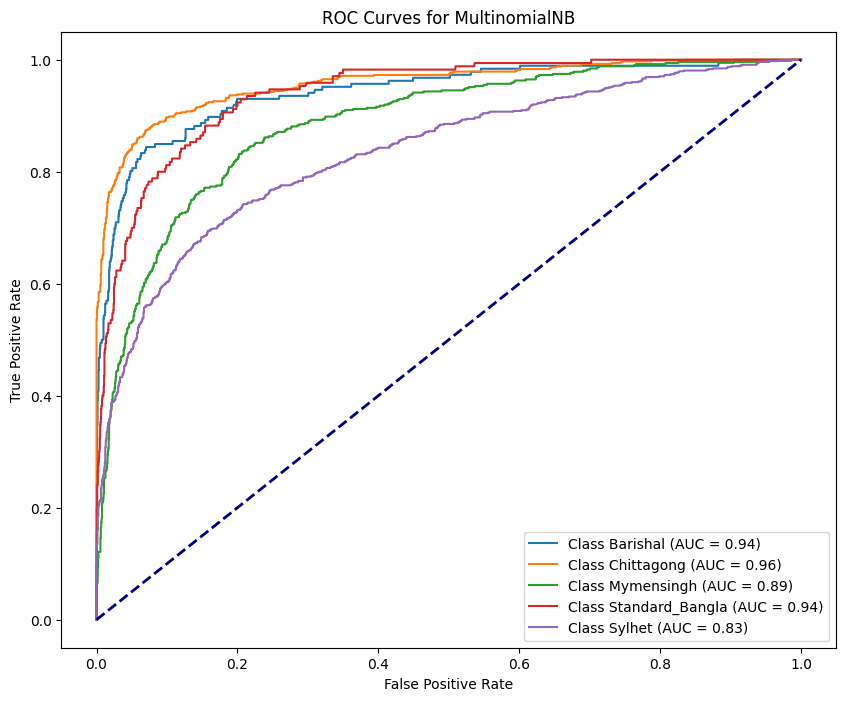

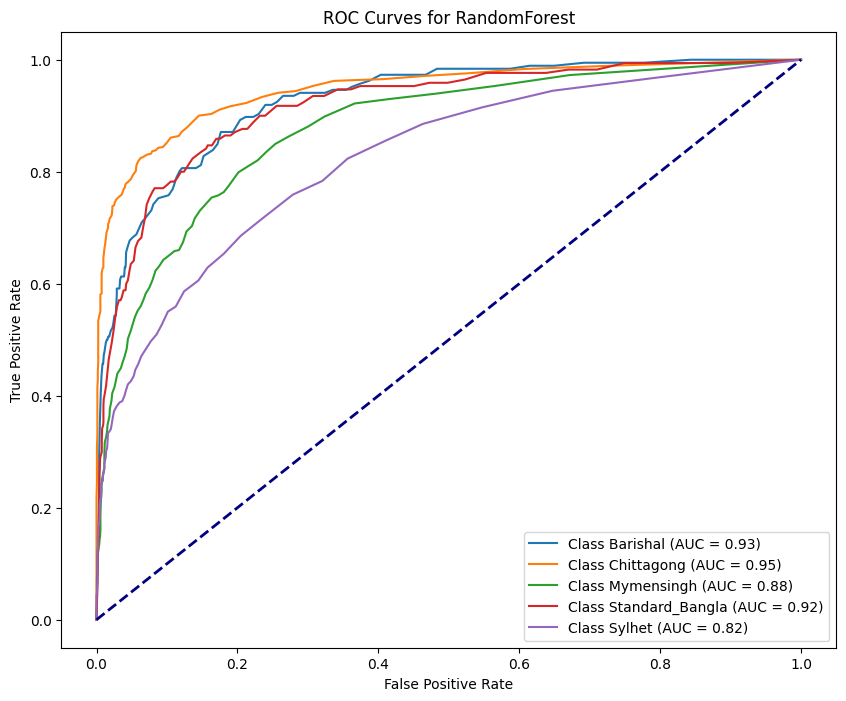

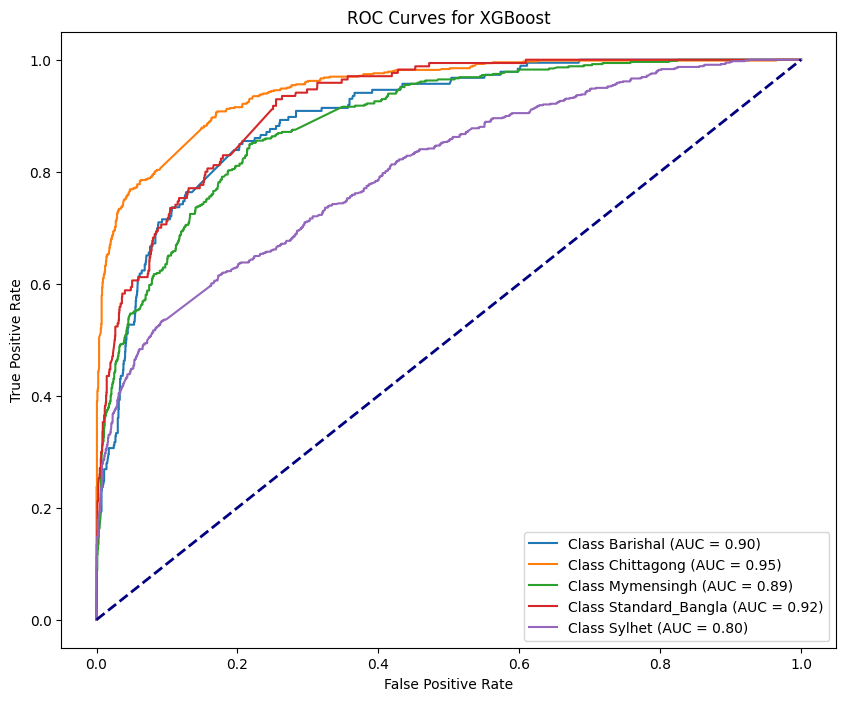

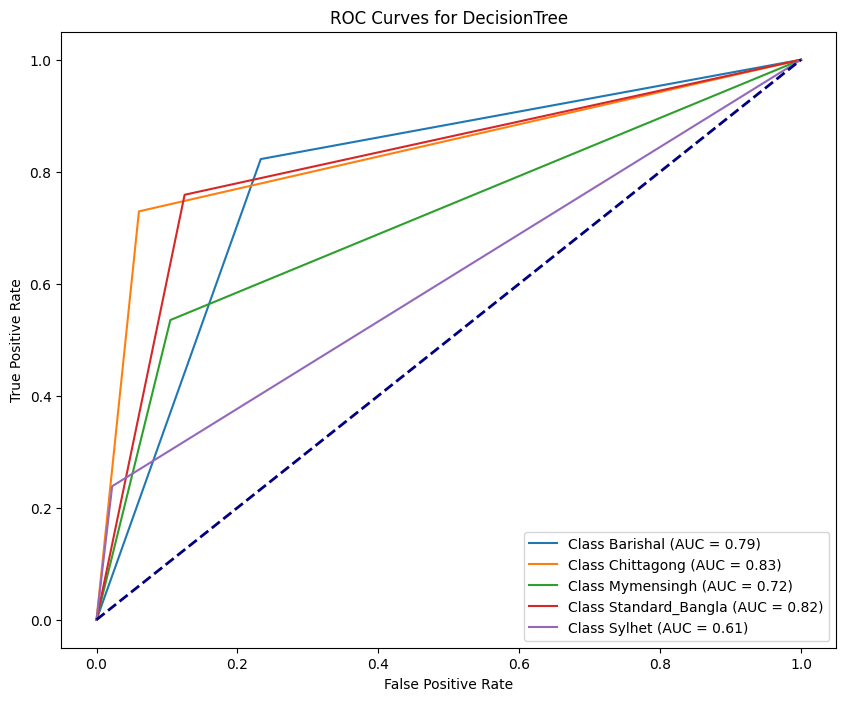

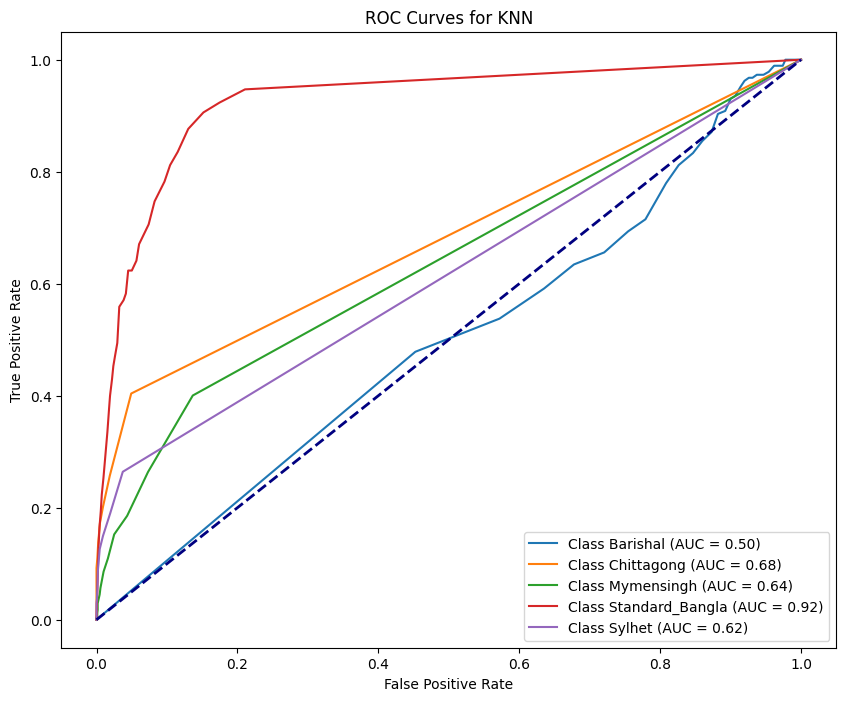

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


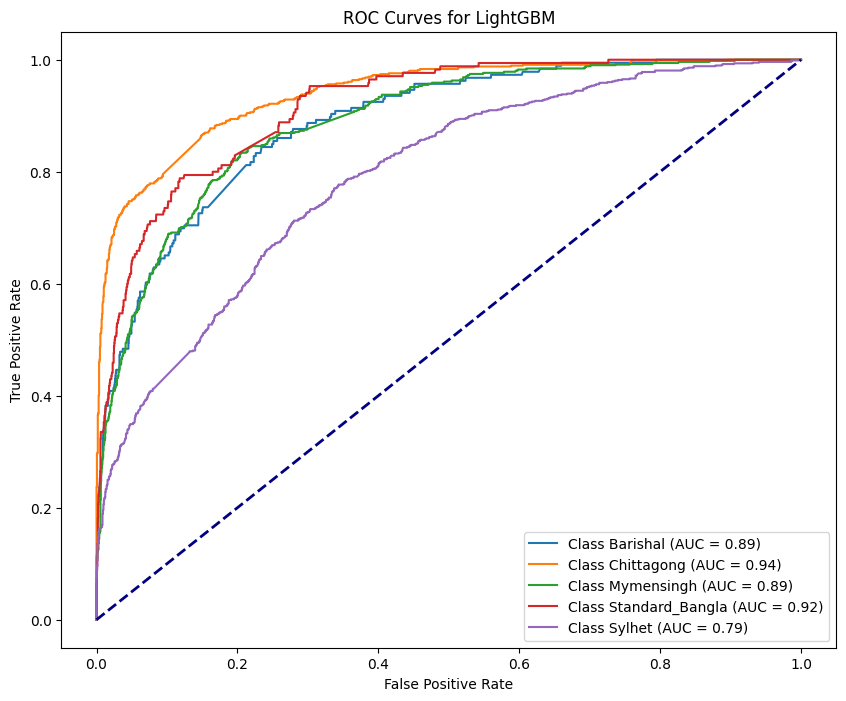

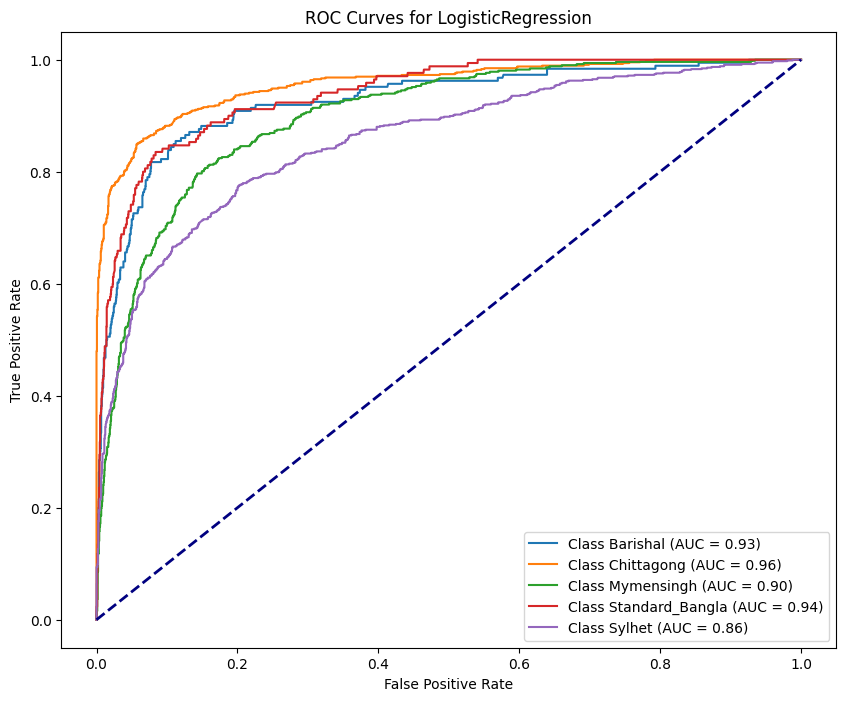

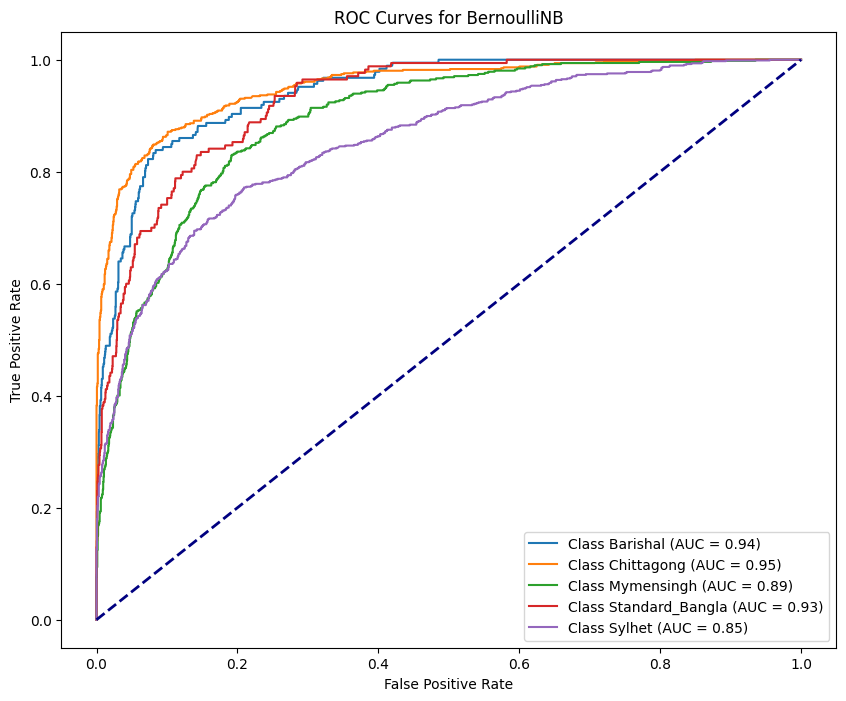

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_auc_multiclass(model, X_test, y_test, model_name):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_probs_bin[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Class {list(label_mapping.keys())[i]} (AUC = {roc_auc[i]:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves for {model_name}')
    plt.legend(loc='lower right')
    plt.show()

models = [nb_model, rf_model, xgb_model, dt_model, knn_model, lgb_model, lgr_model, bnb_model]
model_names = ["MultinomialNB", "RandomForest", "XGBoost", "DecisionTree", "KNN", "LightGBM", "LogisticRegression", "BernoulliNB"]

for model, model_name in zip(models, model_names):
    plot_roc_auc_multiclass(model, X_test, y_test, model_name)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


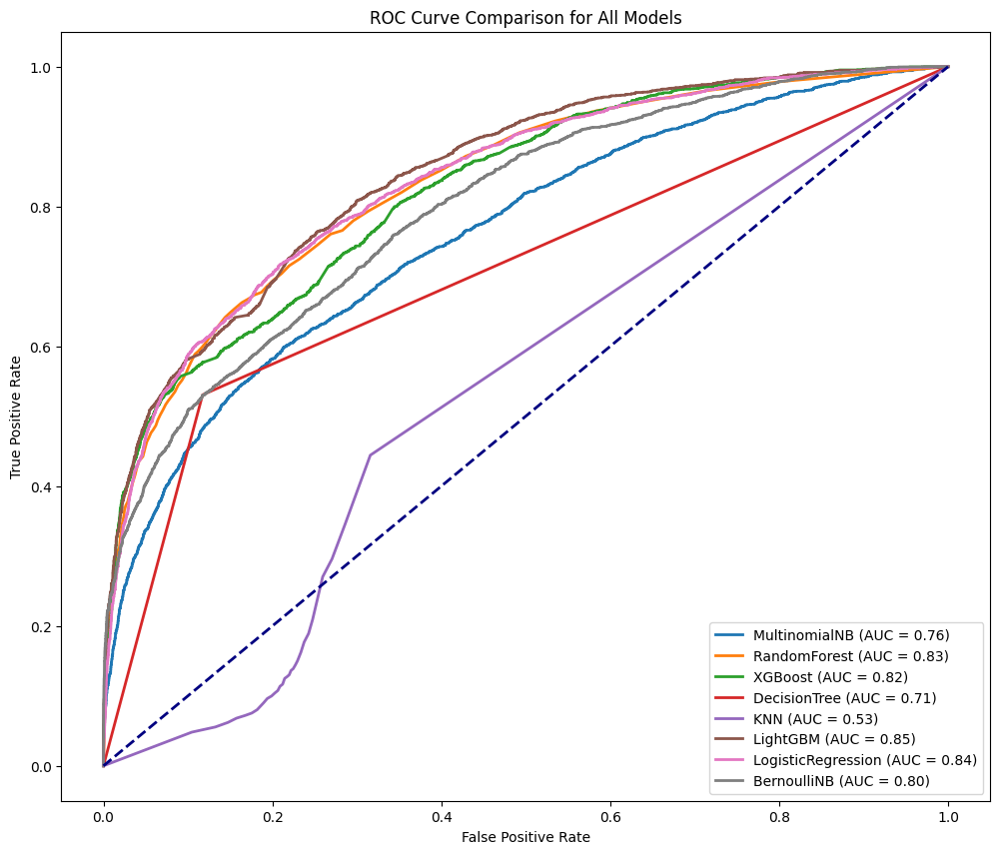

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

plt.figure(figsize=(12, 10))

for model, model_name in zip(models, model_names):
    n_classes = len(label_mapping)
    y_test_bin = label_binarize(y_test, classes=list(range(n_classes)))
    y_pred_probs_bin = model.predict_proba(X_test)
    fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_pred_probs_bin.ravel())
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve Comparison for All Models')
plt.legend(loc='lower right')
plt.show()